<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Функции" data-toc-modified-id="Функции-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Функции</a></span></li><li><span><a href="#Загружаем-данные,-EDA" data-toc-modified-id="Загружаем-данные,-EDA-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Загружаем данные, EDA</a></span></li><li><span><a href="#DFM" data-toc-modified-id="DFM-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>DFM</a></span></li><li><span><a href="#DFM-Analysis" data-toc-modified-id="DFM-Analysis-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>DFM Analysis</a></span></li><li><span><a href="#Загрузка-дат" data-toc-modified-id="Загрузка-дат-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Загрузка дат</a></span></li><li><span><a href="#DFM-Train-forecasts" data-toc-modified-id="DFM-Train-forecasts-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>DFM Train forecasts</a></span></li><li><span><a href="#DFM-Test-forecasts" data-toc-modified-id="DFM-Test-forecasts-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>DFM Test forecasts</a></span></li><li><span><a href="#Загрузка-имен-датасета" data-toc-modified-id="Загрузка-имен-датасета-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Загрузка имен датасета</a></span></li><li><span><a href="#Подготовка-для-LSTM" data-toc-modified-id="Подготовка-для-LSTM-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Подготовка для LSTM</a></span></li><li><span><a href="#LSTM" data-toc-modified-id="LSTM-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>LSTM</a></span></li><li><span><a href="#Анализ-нейронной-сети" data-toc-modified-id="Анализ-нейронной-сети-11"><span class="toc-item-num">11&nbsp;&nbsp;</span>Анализ нейронной сети</a></span></li><li><span><a href="#Оценка-ансамбля" data-toc-modified-id="Оценка-ансамбля-12"><span class="toc-item-num">12&nbsp;&nbsp;</span>Оценка ансамбля</a></span></li><li><span><a href="#Оценка-средневзвешенного-ансамбля" data-toc-modified-id="Оценка-средневзвешенного-ансамбля-13"><span class="toc-item-num">13&nbsp;&nbsp;</span>Оценка средневзвешенного ансамбля</a></span></li><li><span><a href="#Подготовка-для-моделей-конкурентов" data-toc-modified-id="Подготовка-для-моделей-конкурентов-14"><span class="toc-item-num">14&nbsp;&nbsp;</span>Подготовка для моделей-конкурентов</a></span></li><li><span><a href="#ARMAX" data-toc-modified-id="ARMAX-15"><span class="toc-item-num">15&nbsp;&nbsp;</span>ARMAX</a></span></li><li><span><a href="#VAR" data-toc-modified-id="VAR-16"><span class="toc-item-num">16&nbsp;&nbsp;</span>VAR</a></span></li><li><span><a href="#SVM" data-toc-modified-id="SVM-17"><span class="toc-item-num">17&nbsp;&nbsp;</span>SVM</a></span></li><li><span><a href="#CatBoost" data-toc-modified-id="CatBoost-18"><span class="toc-item-num">18&nbsp;&nbsp;</span>CatBoost</a></span></li></ul></div>

In [6]:
%matplotlib inline

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime as dt
import pickle
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from scipy.signal import lfilter
from scipy.interpolate import CubicSpline
from scipy.linalg import eig
from scipy.linalg import block_diag
from dateutil.relativedelta import relativedelta

import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.vector_ar.vecm import coint_johansen

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

from keras.models import Sequential
from keras.layers import Dense, LSTM, BatchNormalization, Dropout
from keras.models import load_model
from keras.optimizers import Adam
import tensorflow as tf
# import kerastuner
# from kerastuner.tuners import RandomSearch
# from kerastuner.engine.hyperparameters import HyperParameters
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import regularizers

from Functions.load_spec import load_spec

from sklearn import svm
from sklearn.model_selection import GridSearchCV
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

import catboost as cb

from datetime import datetime, timedelta

import random

np.set_printoptions(precision=4, suppress=True, linewidth=120)
pd.set_option('display.expand_frame_repr', False)

# Функции

In [7]:
def load_data(datafile,Spec,sample = None):

    if not os.path.splitext(datafile)[1] in [".xlsx",".xls"]:
        ValueError("File is not an EXCEL FILE")

    Z,Time,Mnem = readData(datafile)
    #    Z : raw (untransformed) observed data
    # Time : observation periods for the time series data
    # Mnem : series ID for each variable

    # Sort data based on model specification
    Z,_,permutation = sortData(Z.copy(),Mnem.copy(),Spec)

    # since now Mnem == Spec.SeriesID
    del Mnem

    # Transform data based on model specification
    X,Time,Z = transformData(Z.copy(),Time.copy(),Spec)

    # Drop data not in estimation sample
    if sample != None:
        X,Time,Z = dropData(X.copy(),Time.copy(),Z.copy(),sample)

    return X,Time,Z,permutation

In [8]:
def readData(datafile):

    # readData Read data from Microsoft Excel workbook file

    dat  = pd.read_excel(datafile)
    Mnem = np.array([i for i in list(dat.columns) if i != "Date"])
    Z    = dat[Mnem].to_numpy(copy=True)
    Time = dat.Date.apply(lambda x: x.toordinal()+366).to_numpy(copy= True)

    return Z,Time,Mnem

def sortData(Z,Mnem,Spec):

    # sortData Sort series by order of model specification

    # Drop series not in Spec
    inSpec = np.in1d(Mnem,Spec.SeriesID)
    Mnem   = Mnem[inSpec]
    Z      = Z[:,inSpec]

    # Sort series by ordering of Spec
    permutation = np.array([np.where(Mnem == i)[0][0] for i in Spec.SeriesID])
    Mnem        = Mnem[permutation]
    Z           = Z[:,permutation]

    return Z, Mnem, permutation

def transformData(Z,Time,Spec):

    # transformData Transforms each data series based on Spec.Transformation
    #
    # Input Arguments:
    #
    #      Z : T x N numeric array, raw (untransformed) observed data
    #   Spec : structure          , model specification
    #
    # Output Arguments:
    #
    #      X : T x N numeric array, transformed data (stationary to enter DFM)

    """
    Transformation notes:
        'lin' = Levels (No Transformation)
        'chg' = Change (Difference)
        'ch1' = Year over Year Change (Difference)
        'pch' = Percent Change
        'pc1' = Year over Year Percent Change
        'pca' = Percent Change (Annual Rate)
        'log' = Natural Log
    """

    T,N          = Z.shape
    X            = np.empty((T, N))
    X[:]         = np.nan
    Freq_dict    = {"m":1,"q":3}
    formula_dict = {"lin":lambda x:x*2,
                    "chg":lambda x:np.append(np.nan,x[t1+step::step] - x[t1:-1-t1:step]),
                    "ch1":lambda x:x[12+t1::step] - x[t1:-12:step],
                    "pch":lambda x:(np.append(np.nan,x[t1+step::step]/x[t1:-1-t1:step]) - 1)*100,
                    "pc1":lambda x:((x[12+t1::step]/x[t1:-12:step])-1)*100,
                    "pca":lambda x:(np.append(np.nan,x[t1+step::step]/x[t1:-step:step])**(1/n) - 1)*100,
                    "log":lambda x:np.log(x)
    }

    for i in range(N):
        formula = Spec.Transformation[i]
        freq    = Spec.Frequency[i]
        step    = Freq_dict[freq] # time step for different frequencies based on monthly time
        t1      = step -1         # assume monthly observations start at beginning of quarter (subtracted 1 for indexing)
        n       = step/12         # number of years, needed to compute annual % changes
        series  = Spec.SeriesName[i]

        if formula == 'lin':
            X[:,i] = Z[:,i].copy()
        elif formula == 'chg':
            X[t1::step,i] = formula_dict['chg'](Z[:,i].copy())
        elif formula == 'ch1':
            X[12+t1::step, i] = formula_dict['ch1'](Z[:, i].copy())
        elif formula == 'pch':
            X[t1::step, i] = formula_dict['pch'](Z[:, i].copy())
        elif formula == 'pc1':
            X[12+t1::step, i] = formula_dict['pc1'](Z[:, i].copy())
        elif formula == 'pca':
            X[t1::step, i] = formula_dict['pca'](Z[:, i].copy())
        elif formula == 'log':
            X[:, i] = formula_dict['log'](Z[:, i].copy())
        else:
            ValueError("{}: Transformation is unknown".format(formula))

    # Drop first quarter of observations
    # since transformations cause missing values

    return X[3:,:],Time[3:],Z[3:,:]


def dropData(X,Time,Z,sample):

    # dropData Remove data not in estimation sample

    filter_index = Time <= sample
    X            = X[filter_index,:].copy()
    Time         = Time[filter_index].copy()
    Z            = Z[filter_index, :].copy()

    return X,Time,Z

In [9]:
def remNaNs_spline(X,options):

    T,N    = X.shape
    k      = options["k"]
    indNaN = np.isnan(X)

    if options["method"] == 1:  # replace all the missing values
        for i in range(N): # Loop through columns
            x              = X[:,i].copy()
            x[indNaN[:,i]] = np.nanmedian(x)
            x_MA           = lfilter(np.ones((2*k+1))/(2*k+1),1,np.append(np.append(x[0]*np.ones((k,1)),x),x[-1]*np.ones((k,1))))
            x_MA           = x_MA[(2*k+1) -1:] # Match dimensions
            # replace all the missing values
            x[indNaN[:,i]] = x_MA[indNaN[:,i]]
            X[:,i]         = x # Replace vector

    elif options["method"] == 2: # replace missing values after removing leading and closing zeros
        # Returns row sum for NaN values. Marks true for rows with more than 80% NaN
        rem1    = np.nansum(indNaN, axis =1) > (N * 0.8)
        nanLead = np.cumsum(rem1) == np.arange(1,(T+1))
        nanEnd  = np.cumsum(rem1) == np.arange(T,0,-1)
        nanLE   = nanLead|nanEnd

        # Subsets X
        X      = X[~nanLE,:]
        indNaN = np.isnan(X) # Index for missing values

        for i in range(N): # Loop for each series
            x          = X[:,i].copy()
            isnanx     = np.isnan(x)
            t1         = np.min(np.where(~isnanx)) # First non-NaN entry
            t2         = np.max(np.where(~isnanx)) # Last non-NaN entry

            # Interpolates without NaN entries in beginning and end
            x[t1:t2+1] = CubicSpline(np.where(~isnanx)[0],x[~isnanx])(np.arange(t1,t2+1))
            isnanx     = np.isnan(x)

            # replace NaN observations with median
            x[isnanx]  = np.nanmedian(x)

            # Apply filter
            x_MA       = lfilter(np.ones((2*k+1))/(2*k+1),1,np.append(np.append(x[0]*np.ones((k,1)),x),x[-1]*np.ones((k,1))))
            x_MA       = x_MA[(2*k+1) -1:]

            # Replace nanx wih filtered observations
            x[isnanx]  = x_MA[isnanx]
            X[:,i]     = x

    elif options["method"] == 3:
        rem1    = np.sum(indNaN, axis = 1) == N
        nanLead = np.cumsum(rem1) == np.arange(1,(T+1))
        nanEnd  = np.cumsum(rem1) == np.arange(T,0,-1)
        nanLE   = nanLead|nanEnd

        X      = X[~nanLE,:]
        indNaN = np.isnan(X)

    elif options["method"] == 4: # remove rows with leading and closing zeros & replace missing values
        rem1    = np.sum(indNaN, axis = 1) == N
        nanLead = np.cumsum(rem1) == np.arange(1,(T+1))
        nanEnd  = np.cumsum(rem1) == np.arange(T,0,-1)
        nanLE   = nanLead|nanEnd

        X      = X[~nanLE,:]
        indNaN = np.isnan(X)

        for i in range(N):
            x            = X[:, i].copy()
            isnanx       = np.isnan(x)
            t1           = np.min(np.where(~isnanx))
            t2           = np.max(np.where(~isnanx))
            x[t1:t2 + 1] = CubicSpline(np.where(~isnanx)[0],x[~isnanx])(np.arange(t1,t2+1))
            isnanx       = np.isnan(x)
            x[isnanx]    = np.nanmedian(x)
            x_MA         = lfilter(np.ones((2 * k + 1)) / (2 * k + 1), 1,
                                   np.append(np.append(x[0] * np.ones((k, 1)), x), x[-1] * np.ones((k, 1))))
            x_MA      = x_MA[(2 * k + 1) - 1:]
            x[isnanx] = x_MA[isnanx]
            X[:, i]   = x

    elif options["method"] == 5: # replace missing values
        indNaN = np.isnan(X)

        for i in range(N):
            x            = X[:, i].copy()
            isnanx       = np.isnan(x)
            t1           = np.min(np.where(~isnanx))
            t2           = np.max(np.where(~isnanx))
            x[t1:t2 + 1] = CubicSpline(np.where(~isnanx)[0],x[~isnanx])(np.arange(t1,t2+1))
            isnanx       = np.isnan(x)
            x[isnanx]    = np.nanmedian(x)
            x_MA         = lfilter(np.ones((2 * k + 1)) / (2 * k + 1), 1,
                                   np.append(np.append(x[0] * np.ones((k, 1)), x), x[-1] * np.ones((k, 1))))
            x_MA         = x_MA[(2 * k + 1) - 1:]
            x[isnanx]    = x_MA[isnanx]
            X[:, i]      = x

    return X,indNaN

In [10]:
#-------------------------------------------------Dynamic Factor Modeling functions
def dfm(X,Spec,threshold = 1e-5,max_iter = 5000):
    
    # DFM input specifications: See documentation for details
    Par = {}
    Par["blocks"] = Spec.Blocks.copy()                                  # Block loading structure
    Par["nQ"]     = (Spec.Frequency == "q").sum()                       # Number of quarterly series
    Par["p"]      = 1                                                   # Number of lags in autoregressive of factor (same for all factors)
    Par["r"]      = np.ones((1,Spec.Blocks.shape[1])).astype(np.int64)  # Number of common factors for each block
    # Par.r(1) =2;
    # Display blocks

    print("\n\n\n")
    print("Table 3: Block Loading Structure")
    print(pd.DataFrame(data=Spec.Blocks, index=Spec.SeriesName, columns=Spec.BlockNames))
    print("\n")
    print("Estimating the dynamic factor model (DFM) \n\n")

    T, N   = X.shape
    r      = Par["r"].copy()
    p      = Par["p"]
    nQ     = Par["nQ"]
    blocks = Par["blocks"].copy()

    i_idio = np.append(np.ones(N-nQ),np.zeros(nQ)).reshape((-1,1),order="F") == 1

    # R*Lambda = q; Contraints on the loadings of the quartrly variables
    R_mat = np.array([2,-1,0,0,0,3,0,-1,0,0,2,0,0,-1,0,1,0,0,0,-1]).reshape((4,5))
    q     = np.zeros((4,1))

    # Prepare data -----------------------------------------------------------
    Mx   = np.nanmean(X,axis = 0)
    Wx   = np.nanstd(X,axis = 0,ddof = 1)
    xNaN = (X - np.tile(Mx,(T,1))) / np.tile(Wx,(T,1))

    # Initial Conditions------------------------------------------------------
    optNaN           = {}
    optNaN["method"] = 2 # Remove leading and closing zeros
    optNaN["k"]      = 3 # Setting for filter(): See remNaN_spline

    A,C,Q,R,Z_0,V_0  = InitCond(xNaN.copy(), r.copy(), p, blocks.copy(), optNaN, R_mat.copy(), q, nQ, i_idio.copy())

    # initialize EM loop values
    previous_loglik = -np.inf
    num_iter        = 0
    LL              = [-np.inf]
    converged       = 0

    # y for the estimation is with missing data
    y                = xNaN.copy().T

    # EM LOOP ----------------------------------------------------------------

    # The model can be written as
    # y = C*Z + e;
    # Z = A*Z(-1) + v
    # where y is NxT, Z is (pr)xT, etc

    # Remove the leading and ending nans
    optNaN["method"] = 3
    y_est,_          = remNaNs_spline(xNaN.copy(),optNaN)
    y_est            = y_est.T

    max_iter = 5000
    while num_iter < max_iter and not converged: # Loop until converges or max iter.

        # Applying EM algorithm
        C_new, R_new, A_new, Q_new, Z_0, V_0, loglik = EMstep(y_est, A, C, Q, R, Z_0, V_0, r,p,R_mat,q,nQ,i_idio,blocks)

        C = C_new.copy()
        R = R_new.copy()
        A = A_new.copy()
        Q = Q_new.copy()

        if num_iter > 2: # Check convergence
            converged, decrease = em_converged(loglik,previous_loglik,threshold,1)

        if (num_iter % 10) == 0 and num_iter > 0:
            print("Now running the {}th iteration of max {}".format(num_iter,max_iter))
            print('Loglik: {} (% Change: {})'.format(loglik, 100*((loglik-previous_loglik)/previous_loglik)))

        LL.append(loglik)
        previous_loglik = loglik
        num_iter        += 1

    if num_iter < max_iter:
        print('Successful: Convergence at {} interations'.format(num_iter))
    else:
        print('Stopped because maximum iterations reached')

    # Final run of the Kalman filter
    Zsmooth,_,_,_  = runKF(y,A,C,Q,R,Z_0,V_0)
    Zsmooth        = Zsmooth.T
    x_sm           = np.matmul(Zsmooth[1:,:],C.T) # Get smoothed X

    # Loading the structure with the results --------------------------------
    Res = { "x_sm"     : x_sm.copy(),
            "X_sm" : np.tile(Wx,(T,1)) * x_sm + np.tile(Mx,(T,1)),
            "Z"        : Zsmooth[1:,:].copy(),
            "C"        : C.copy(),
            "R"        : R.copy(),
            "A"        : A.copy(),
            "Q"        : Q.copy(),
            "Mx"       : Mx.copy(),
            "Wx"       : Wx.copy(),
            "Z_0"      : Z_0.copy(),
            "V_0"      : V_0.copy(),
            "r"        : r,
            "p"        : p,
            "loglik"   : LL
    }

    # Display output
    # Table with names and factor loadings
    nQ       = Par["nQ"]
    nM       = Spec.SeriesID.shape[0] - nQ
    nLags    = max(Par["p"],5)
    nFactors = np.sum(Par["r"])

    print("\n Table 4: Factor Loadings for Monthly Series")
    print(pd.DataFrame(Res["C"][:nM,np.arange(0,nFactors*5,5)],
                       columns = Spec.BlockNames,
                       index   = Spec.SeriesName[:nM]))
    factor_load_monthly = pd.DataFrame(Res["C"][:nM,np.arange(0,nFactors*5,5)],
                       columns = Spec.BlockNames,
                       index   = Spec.SeriesName[:nM])

    print("\n Table 5: Quarterly Loadings Sample (Global Factor)")
    print(pd.DataFrame(Res["C"][(-1-nQ+1):,:5],
                       columns = ['f1_lag0', 'f1_lag1', 'f1_lag2', 'f1_lag3', 'f1_lag4'],
                       index   = Spec.SeriesName[-1-nQ+1:]))
    
    quarter_load_global = pd.DataFrame(Res["C"][(-1-nQ+1):,:5],
                       columns = ['f1_lag0', 'f1_lag1', 'f1_lag2', 'f1_lag3', 'f1_lag4'],
                       index   = Spec.SeriesName[-1-nQ+1:])

    # Table with AR model on factors (factors with AR parameter and variance of residuals)
    A_terms = np.diag(Res["A"]).copy()
    Q_terms = np.diag(Res["Q"]).copy()

    print('\n Table 6: Autoregressive Coefficients on Factors')
    print(pd.DataFrame({'AR_Coefficient'    : A_terms[np.arange(0,nFactors*5,5)].copy(),
                        'Variance_Residual' : Q_terms[np.arange(0,nFactors*5,5)].copy()},
                       index   = Spec.BlockNames))
    
    autoreg_coef_factors = pd.DataFrame({'AR_Coefficient'    : A_terms[np.arange(0,nFactors*5,5)].copy(),
                        'Variance_Residual' : Q_terms[np.arange(0,nFactors*5,5)].copy()},
                       index   = Spec.BlockNames)

    # Table with AR model idiosyncratic errors (factors with AR parameter and variance of residuals)
    print('\n Table 7: Autoregressive Coefficients on Idiosyncratic Component')
    A_len = A.shape[0]
    Q_len = Q.shape[0]

    A_index = np.hstack([np.arange(nFactors*5,nFactors*5+nM),np.arange(nFactors*5+nM,A_len,5)])
    Q_index = np.hstack([np.arange(nFactors*5,nFactors*5+nM),np.arange(nFactors*5+nM,Q_len,5)])

    print(pd.DataFrame({'AR_Coefficient'    : A_terms[A_index].copy(),
                        'Variance_Residual' : Q_terms[Q_index].copy()},
                       index   = Spec.SeriesName))
    
    autoreg_coef_idiosyncratic = pd.DataFrame({'AR_Coefficient'    : A_terms[A_index].copy(),
                        'Variance_Residual' : Q_terms[Q_index].copy()},
                       index   = Spec.SeriesName)

    return Res, factor_load_monthly, quarter_load_global, autoreg_coef_factors, autoreg_coef_idiosyncratic

In [11]:
def InitCond(x,r,p,blocks,optNaN,Rcon,q,nQ,i_idio):

    pC  = Rcon.shape[1]   # Gives 'tent' structure size (quarterly to monthly)
    ppC = max(p,pC)
    n_b = blocks.shape[1] # Number of blocks

    xBal,indNaN = remNaNs_spline(x.copy(),optNaN)  # Spline without NaNs
    
    T,N = xBal.shape  # Time T series number N
    nM  = N-nQ        # Number of monthly series
    
    xNaN         = xBal.copy()
    xNaN[indNaN] = np.nan        # Set missing values equal to NaNs
    res          = xBal.copy()   # Spline output equal to res Later this is used for residuals
    resNaN       = xNaN.copy()   # Later used for residuals

    # Initialize model coefficient output
    C   = None
    A   = None
    Q   = None
    V_0 = None

    # Set the first observations as NaNs: For quarterly-monthly aggreg. scheme
    indNaN[:pC-1, :] = np.True_

    # Set the first observations as NaNs: For quarterly-monthly aggreg. scheme
    for i in range(n_b): # Loop for each block
        r_i = r[0,i].copy() # r_i = 1 when block is loaded

        # Observation equation -----------------------------------------------

        C_i = np.zeros((N, r_i * ppC))     # Initialize state variable matrix helper
        idx_i = np.where(blocks[:, i])[0]  # Returns series index loading block i
        idx_iM = idx_i[idx_i < nM]         # Monthly series indicies for loaded blocks
        idx_iQ = idx_i[idx_i >= nM]        # Quarterly series indicies for loaded blocks

        # Returns eigenvector v w/largest eigenvalue d, CHECK: test if eig values are the same in Matlab
        d, v = eig(np.cov(res[:, idx_iM], rowvar=False))
        e_idx = np.where(d == np.max(d))[0]
        d = d[e_idx]
        v = v[:, e_idx]

        # Flip sign for cleaner output. Gives equivalent results without this section
        if np.sum(v) < 0:
            v = -v

        # For monthly series with loaded blocks (rows), replace with eigenvector
        # This gives the loading
        C_i[idx_iM,0:r_i] = v.copy()
        f                 = np.matmul(res[:,idx_iM],v) # Data projection for eigenvector direction
        F                 = np.array(f[(pC-1):f.shape[0],:]).reshape((-1,1))

        # Lag matrix using loading. This is later used for quarterly series
        for kk in range(1,max(p+1,pC)):
            F = np.concatenate((F,f[(pC-1)-kk:f.shape[0]-kk,:]), axis =1)

        Rcon_i = np.kron(Rcon,np.eye(r_i)) # Quarterly-monthly aggregation scheme
        q_i    = np.kron(q,np.zeros((r_i,1)))

        # Produces projected data with lag structure (so pC-1 fewer entries)
        ff = F[:, 0:(r_i*pC)].copy()

        for j in idx_iQ: # Loop for quarterly variables

            # For series j, values are dropped to accommodate lag structure
            xx_j = resNaN[(pC-1):,j].copy()

            if sum(~np.isnan(xx_j)) < (ff.shape[1] + 2):
                xx_j = res[(pC-1):,j].copy()

            ff_j = ff[~np.isnan(xx_j),:].copy()
            xx_j = xx_j[~np.isnan(xx_j)].reshape((-1,1)).copy()

            iff_j = np.linalg.inv(np.matmul(ff_j.T,ff_j))
            Cc    = np.matmul(np.matmul(iff_j,ff_j.T),xx_j)

            a1 = np.matmul(iff_j,Rcon_i.T)
            a2 = np.linalg.inv(np.matmul(np.matmul(Rcon_i,iff_j),Rcon_i.T))
            a3 = np.matmul(Rcon_i,Cc)-q_i

            # Spline data monthly to quarterly conversion
            Cc = Cc - np.matmul(np.matmul(a1,a2),a3)

            C_i[j,0:pC*r_i] = Cc.T.copy() # Place in output matrix

        # Zeros in first pC-1 entries (replace dropped from lag)
        ff = np.concatenate([np.zeros((pC-1,pC*r_i)),ff], axis = 0)

        # Residual Calculations
        res            = res - np.matmul(ff,C_i.T)
        resNaN         = res.copy()
        resNaN[indNaN] = np.nan

        # Combine past loadings together
        if i == 0:
            C = C_i.copy()
        else:
            C = np.hstack([C,C_i.copy()])

        # Transition equation ------------------------------------------------

        z = F[:,r_i-1].copy()           # Projected data (no lag)
        Z = F[:,r_i:(r_i*(p+1))].copy() # Data with lag 1

        A_i    = np.zeros((r_i*ppC,r_i*ppC)).T                               # Initialize transition matrix
        A_temp = np.matmul(np.matmul(np.linalg.inv(np.matmul(Z.T,Z)),Z.T),z) # OLS: gives coefficient value AR(p) process

        A_i[:r_i,:r_i*p]       = A_temp.T.copy()
        A_i[r_i:,:r_i*(ppC-1)] = np.eye(r_i*(ppC-1))


        Q_i            = np.zeros((ppC*r_i,ppC*r_i))
        e              = z - np.matmul(Z,A_temp) # VAR residuals
        Q_i[:r_i,:r_i] = np.cov(e, rowvar=False) # VAR covariance matrix

        initV_i = np.reshape(np.matmul(np.linalg.inv(np.eye((r_i*ppC)**2) - np.kron(A_i,A_i)),Q_i.flatten('F').reshape((-1,1))),(r_i*ppC,r_i*ppC))

        # Gives top left block for the transition matrix
        if i == 0:
            A   = A_i.copy()
            Q   = Q_i.copy()
            V_0 = initV_i.copy()
        else:
            A   = block_diag(A,A_i)
            Q   = block_diag(Q,Q_i)
            V_0 = block_diag(V_0,initV_i)

    eyeN = np.eye(N)[:,i_idio.flatten('F')] # Used inside observation matrix

    C    = np.hstack([C,eyeN])
    # Monthly-quarterly agreggation scheme
    C    = np.hstack([C,np.vstack([np.zeros((nM,5*nQ)),np.kron(np.eye(nQ),np.array([1,2,3,2,1]).reshape((1,-1)))])])
    # Initialize covariance matrix for transition matrix
    R    = np.diag(np.nanvar(resNaN,ddof = 1,axis = 0))

    ii_idio = np.where(i_idio)[0]        # Indicies for monthly variables
    n_idio  = ii_idio.shape[0]           # Number of monthly variables
    BM      = np.zeros((n_idio,n_idio))  # Initialize monthly transition matrix values
    SM      = np.zeros((n_idio, n_idio)) # Initialize monthly residual covariance matrix values

    for i in range(n_idio): # Loop for monthly variables

        # Set observation equation residual covariance matrix diagonal
        R[ii_idio[i],ii_idio[i]] = 1e-4

        # Subsetting series residuals for series i
        res_i = resNaN[:,ii_idio[i]].copy()

        # Returns number of leading/ending zeros
        try:
            leadZero = np.max(np.where(np.arange(1,T+1) == np.cumsum(np.isnan(res_i)))) + 1
        except ValueError:
            leadZero = None

        try:
            endZero  = -(np.max(np.where(np.arange(1,T+1) == np.cumsum(np.isnan(res_i[::-1])))[0]) + 1)
        except ValueError:
            endZero = None

        # Truncate leading and ending zeros
        res_i = res[:,ii_idio[i]].copy()
        res_i = res_i[:endZero]
        res_i = res_i[leadZero:].reshape((-1,1),order="F")

        # Linear regression: AR 1 process for monthly series residuals
        BM[i,i] = np.matmul(np.matmul(np.linalg.inv(np.matmul(res_i[:-1].T,res_i[:-1])),res_i[:-1].T),res_i[1:])
        SM[i,i] = np.cov(res_i[1:] - (res_i[:-1]*BM[i,i]),rowvar=False)

    Rdiag       = np.diag(R).copy()
    sig_e       = (Rdiag[nM:]/19)
    Rdiag[nM:]  = 1e-4
    R           = np.diag(Rdiag).copy() # Covariance for obs matrix residuals

    # For BQ, SQ
    rho0      = np.array([[.1]])
    temp      = np.zeros((5,5))
    temp[0,0] = 1

    # Blocks for covariance matrices
    SQ = np.kron(np.diag((1 - rho0[0,0]**2)*sig_e),temp)
    BQ = np.kron(np.eye(nQ),np.vstack([np.hstack([rho0,np.zeros((1,4))]),np.hstack([np.eye(4),np.zeros((4,1))])]))

    initViQ = np.matmul(np.linalg.inv(np.eye((5*nQ)**2) - np.kron(BQ,BQ)),SQ.reshape((-1,1))).reshape((5*nQ,5*nQ))
    initViM = np.diag(1/np.diag(np.eye(BM.shape[0]) - BM**2))*SM

    # Output
    A   = block_diag(A,BM,BQ)
    Q   = block_diag(Q,SM,SQ)
    Z_0 = np.zeros((A.shape[0],1))
    V_0 = block_diag(V_0,initViM,initViQ)

    return A, C, Q, R, Z_0, V_0

In [12]:
def EMstep(y, A, C, Q, R, Z_0, V_0, r,p,R_mat,q,nQ,i_idio,blocks):

    # Initialize preliminary values

    # Store series/model values
    n,T        = y.shape
    nM         = n - nQ
    pC         = R_mat.shape[1]
    ppC        = max(p,pC)
    num_blocks = blocks.shape[1]

    # ESTIMATION STEP: Compute the (expected) sufficient statistics for a single
    # Kalman filter sequence

    # Running the Kalman filter and smoother with current parameters
    # Note that log-liklihood is NOT re-estimated after the runKF step: This
    # effectively gives the previous iteration's log-likelihood
    # For more information on output, see runKF
    Zsmooth,Vsmooth,VVsmooth,loglik = runKF(y, A, C, Q, R, Z_0, V_0)

    # MAXIMIZATION STEP (TRANSITION EQUATION)
    # See (Banbura & Modugno, 2010) for details.

    # Initialize output
    A_new   = A.copy()
    Q_new   = Q.copy()
    V_0_new = V_0.copy()

    # 2A. UPDATE FACTOR PARAMETERS INDIVIDUALLY ----------------------------
    for i in range(num_blocks): # Loop for each block: factors are uncorrelated

        # SETUP INDEXING
        r_i      = r[0,i].copy()         # r_i = 1 if block is loaded
        rp       = r_i*p
        rp1      = np.sum(r[0,:i]) *ppC
        b_subset = np.arange(rp1,rp1+rp) # Subset blocks: Helps for subsetting Zsmooth, Vsmooth
        t_start  = rp1                   # Transition matrix factor idx start
        t_end    = (rp1+r_i*ppC)         # Transition matrix factor idx end

        # ESTIMATE FACTOR PORTION OF Q, A
        # Note: EZZ, EZZ_BB, EZZ_FB are parts of equations 6 and 8 in BM 2010

        # E[f_t*f_t' | Omega_T]
        EZZ    = np.matmul(Zsmooth[b_subset,1:],Zsmooth[b_subset,1:].T) + \
                   np.sum(Vsmooth[1:,[b_subset],[b_subset]], axis =0)

        # E[f_{t-1}*f_{t-1}' | Omega_T]
        EZZ_BB = np.matmul(Zsmooth[b_subset,:-1],Zsmooth[b_subset,:-1].T) + \
                   np.sum(Vsmooth[:-1,[b_subset],[b_subset]],axis =0)

        # E[f_t*f_{t-1}' | Omega_T]
        EZZ_FB = np.matmul(Zsmooth[b_subset,1:],Zsmooth[b_subset,:-1].T) + \
                    np.sum(VVsmooth[:,b_subset,b_subset], axis = 0)

        # Select transition matrix/covariance matrix for block i
        A_i = A[t_start:t_end, t_start:t_end].copy()
        Q_i = Q[t_start:t_end, t_start:t_end].copy()

        # Equation 6: Estimate VAR(p) for factor
        A_i[:r_i,:rp] = np.matmul(EZZ_FB[:r_i,:rp],np.linalg.inv(EZZ_BB[:rp,:rp]))

        # Equation 8: Covariance matrix of residuals of VA
        Q_i[:r_i,:r_i] = (EZZ[:r_i,:r_i] - np.matmul(A_i[:r_i,:rp],EZZ_FB[:r_i,:rp].T))/T

        # Place updated results in output matrix
        A_new[t_start:t_end, t_start:t_end]   = A_i.copy()
        Q_new[t_start:t_end, t_start:t_end]   = Q_i.copy()
        V_0_new[t_start:t_end, t_start:t_end] = Vsmooth[0,t_start:t_end,t_start:t_end].copy()

    # B. UPDATING PARAMETERS FOR IDIOSYNCRATIC COMPONENT ------------------

    rp1      = np.sum(r)*ppC              # Col size of factor portion
    niM      = np.sum(i_idio[:nM])        # Number of monthly values
    t_start  = rp1                        # Start of idiosyncratic component index
    i_subset = np.arange(t_start,rp1+niM) # Gives indices for monthly idiosyncratic component values

    # Below 3 estimate the idiosyncratic component (for eqns 6, 8 BM 2010)

    # E[f_t*f_t' | \Omega_T]
    EZZ = np.diag(np.diag(np.matmul(Zsmooth[t_start:,1:],Zsmooth[t_start:,1:].T))) + \
            np.diag(np.diag(np.sum(Vsmooth[1:,t_start:,t_start:], axis = 0)))

    # E[f_{t-1}*f_{t-1}' | \Omega_T]
    EZZ_BB = np.diag(np.diag(np.matmul(Zsmooth[t_start:,:-1],Zsmooth[t_start:,:-1].T))) + \
                np.diag(np.diag(np.sum(Vsmooth[:-1,t_start:,t_start:], axis =0)))

    # E[f_t*f_{t-1}' | \Omega_T]
    EZZ_FB = np.diag(np.diag(np.matmul(Zsmooth[t_start:,1:], Zsmooth[t_start:,:-1].T))) + \
                np.diag(np.diag(np.sum(VVsmooth[:,t_start:,t_start:], axis = 0)))

    A_i = np.matmul(EZZ_FB,np.diag(1/np.diag((EZZ_BB)))) # Equation 6
    Q_i = (EZZ - np.matmul(A_i,EZZ_FB.T))/T              # Equation 8

    # Place updated results in output matrix
    A_new[np.ix_(i_subset,i_subset)]   = A_i[:niM,:niM].copy()
    Q_new[np.ix_(i_subset,i_subset)]   = Q_i[:niM,:niM].copy()
    V_0_new[np.ix_(i_subset,i_subset)] = np.diag(np.diag(Vsmooth[0,i_subset,i_subset].copy()))

    # 3 MAXIMIZATION STEP (observation equation)

    # INITIALIZATION AND SETUP ----------------------------------------------

    Z_0 = Zsmooth[:,[0]].copy()

    # Set missing data series values to 0
    y              = y.copy()
    nanY           = np.isnan(y).astype(np.int64)
    y[np.isnan(y)] = 0

    # LOADINGS
    C_new = C.copy()

    # Blocks
    bl   = np.unique(blocks,axis =0) # Gives unique loadings
    n_bl = bl.shape[0]               # Number of unique loadings

    for i in range(num_blocks): # Loop through each block
        if i == 0:
            # Initialize indices
            bl_idxQ = np.tile(bl[:,[i]],(1,r[0,i]*ppC))
            bl_idxM = np.hstack([np.tile(bl[:,[i]],(1,r[0,i])),np.zeros((n_bl,r[0,i]*(ppC-1)))])
            R_con   = np.kron(R_mat,np.eye(r[0,i]))
            q_con   = np.zeros((r[0,i]*R_mat.shape[0],1))
        else:
            # Indicator for monthly factor loadings
            bl_idxQ = np.hstack([bl_idxQ, np.tile(bl[:,[i]],(1,r[0,i]*ppC))])

            # Indicator for quarterly factor loadings
            bl_idxM = np.hstack([np.hstack([bl_idxM, np.tile(bl[:,[i]],(1,r[0,i]))]),np.zeros((n_bl,r[0,i]*(ppC-1)))])

            # Block diagonal matrix giving monthly-quarterly aggreg scheme
            R_con   = block_diag(R_con,np.kron(R_mat,np.eye(r[0,i])))
            q_con   = np.vstack([q_con,np.zeros((r[0,i]*R_mat.shape[0],1))])

    #  Indicator for monthly/quarterly blocks in observation matrix
    bl_idxM = bl_idxM == 1
    bl_idxQ = bl_idxQ == 1

    i_idio_M = i_idio[:nM].copy()             # Gives 1 for monthly series
    n_idio_M = np.where(i_idio_M)[0].shape[0] # Number of monthly series
    c_i_idio = np.cumsum(i_idio)              # Cumulative number of monthly series

    for i in range(n_bl): # Loop through unique loadings (e.g. [1 0 0 0], [1 1 0 0])

        bl_i   = bl[[i],:].copy()
        rs     = np.sum(r[np.where(bl_i == 1)])             # Total num of blocks loaded
        idx_i  = np.where((blocks == bl_i).all(axis =1))[0] # Indices for bl_i
        idx_iM = idx_i[idx_i < nM]                          # Only monthly
        n_i    = len(idx_iM)                                # Number of monthly series

        # Initialize sums in equation 13 of BGR 2010
        denom = np.zeros((n_i*rs,n_i*rs))
        nom   = np.zeros((n_i,rs))

        # Stores monthly indicies. These are done for input robustness
        i_idio_i  = i_idio_M[idx_iM,:].flatten('F').copy()
        i_idio_ii = c_i_idio[idx_iM].copy()
        i_idio_ii = i_idio_ii[i_idio_i].copy() - 1

        # UPDATE MONTHLY VARIABLES: Loop through each period ----------------

        # bl_idxM_ind is the same as bl_idxM(i, :) in Matlab
        # It can get a bit messy with long indexing
        bl_idxM_ind = np.where(bl_idxM[i, :])[0]

        for t in range(T):

            # Gives selection matrix (1 for nonmissing values)
            Wt          = np.diag(np.logical_not(nanY[idx_iM,t]).astype(np.int64))

            # E[f_t*t_t' | Omega_T]
            denom += np.kron(np.matmul(Zsmooth[bl_idxM_ind][:,[t+1]], Zsmooth[bl_idxM_ind][:,[t+1]].T) + \
                                        Vsmooth[t+1][np.ix_(bl_idxM_ind,bl_idxM_ind)],
                                    Wt)

            # E[y_t*f_t' | \Omega_T]
            nom += np.matmul(y[idx_iM][:,[t]],Zsmooth[bl_idxM_ind][:,[t+1]].T) - \
                   np.matmul(Wt[:,i_idio_i],
                                    np.matmul(Zsmooth[rp1+i_idio_ii][:,[t+1]],Zsmooth[bl_idxM_ind][:,[t+1]].T) + \
                                    Vsmooth[t+1][rp1+i_idio_ii,:][:,bl_idxM_ind])

        # POSSIBLE WEAK POINT FOUND: NEED TO TEST ON INDEXING AS NUMPY DOES NOT MAINTAIN PROPER MATRIX FORM DEPENDING ON HOW ITS INDEXED: CHECK

        # Eqn 13 BGR 2010
        vec_C = np.matmul(np.linalg.inv(denom),nom.flatten('F').reshape((-1,1)))

        # Place updated monthly results in output matrix
        C_new[np.ix_(idx_iM,bl_idxM_ind)] = vec_C.copy().reshape((n_i,rs),order = "F") # CHECK: RESHAPE NEEDS TO BE VERIFIED

        # UPDATE QUARTERLY VARIABLES -----------------------------------------

        idx_iQ = idx_i[idx_i >=nM].copy() # Index for quarterly series
        rps = rs*ppC

        # Monthly-quarterly aggregation scheme
        R_con_i = R_con[:,bl_idxQ[i,:]]
        q_con_i = q_con.copy()

        no_c = np.where(~(R_con_i.any(axis = 1)))[0]
        R_con_i = np.delete(R_con_i,no_c,axis = 0)
        q_con_i = np.delete(q_con_i, no_c, axis=0)

        # Loop through quarterly series in loading. This parallels monthly code
        for j in idx_iQ:

            # Initialization
            denom = np.zeros((rps,rps))
            nom   = np.zeros((1,rps))

            idx_jQ = j - nM # Ordinal position of quarterly variable
            # Loc of factor structure corresponding to quarterly var residuals
            i_idio_jQ = np.arange(rp1 + n_idio_M + 5*(idx_jQ),rp1 + n_idio_M + 5*(idx_jQ+1))

            # Place quarterly values in output matrix
            V_0_new[np.ix_(i_idio_jQ,i_idio_jQ)] = Vsmooth[0][np.ix_(i_idio_jQ,i_idio_jQ)].copy()
            A_new[i_idio_jQ[0],i_idio_jQ[0]]     = A_i[i_idio_jQ[0]-rp1,i_idio_jQ[0]-rp1].copy()
            Q_new[i_idio_jQ[0],i_idio_jQ[0]]     = Q_i[i_idio_jQ[0]-rp1,i_idio_jQ[0]-rp1].copy()

            # bl_idxQ_ind is the same as bl_idxQ(i,:) in Matlab
            # It can get a bit messy with long indexing
            bl_idxQ_ind = np.where(bl_idxQ[i,:])[0]
            
            for t in range(T):

                # Selection matrix for quarterly values
                Wt = np.diag(np.logical_not(nanY[[j]][:,[t]]).astype(np.int64))

                # Intermediate steps in BGR equation 13
                denom += np.kron(np.matmul(Zsmooth[bl_idxQ_ind][:,[t+1]],Zsmooth[bl_idxQ_ind][:,[t+1]].T) + \
                                 Vsmooth[t+1][np.ix_(bl_idxQ_ind,bl_idxQ_ind)],
                                 Wt)
                nom += y[j,t]*Zsmooth[bl_idxQ_ind,t+1].T
                nom -= np.matmul(Wt,np.matmul(np.matmul(np.array([[1,2,3,2,1]]), Zsmooth[i_idio_jQ][:,[t+1]]),
                                              Zsmooth[bl_idxQ_ind][:,[t+1]].T) + \
                                    np.matmul(np.array([[1,2,3,2,1]]),Vsmooth[t+1][np.ix_(i_idio_jQ,bl_idxQ_ind)]))

            C_i = np.matmul(np.linalg.inv(denom),nom.T)

            # BGR equation 13
            C_i_constr = C_i - np.matmul(np.matmul(np.matmul(np.linalg.inv(denom),R_con_i.T),
                                                   np.linalg.inv(np.matmul(np.matmul(R_con_i,np.linalg.inv(denom)),R_con_i.T))),
                                         np.matmul(R_con_i,C_i)-q_con_i)

            # Place updated values in output structure
            C_new[j,bl_idxQ_ind] = C_i_constr.flatten('F')

    # 3B. UPDATE COVARIANCE OF RESIDUALS FOR OBSERVATION EQUATION -----------
    # Initialize covariance of residuals of observation equation
    R_new = np.zeros((n,n))
    for t in range(T):

        # Selection matrix
        Wt = np.diag(np.logical_not(nanY[:,t])).astype(np.int64)

        # BGR equation 15
        R_new += np.matmul(y[:,[t]] - np.matmul(np.matmul(Wt,C_new),Zsmooth[:,[t+1]]),
                           (y[:,[t]] - np.matmul(np.matmul(Wt,C_new),Zsmooth[:,[t+1]])).T) + \
                 np.matmul(np.matmul(np.matmul(np.matmul(Wt,C_new),Vsmooth[t+1][:,:]),C_new.T),Wt) + \
                 np.matmul(np.matmul((np.eye(n) - Wt),R),(np.eye(n)-Wt))

    i_idio_M = np.where(i_idio_M.flatten('F'))[0]
    R_new        = R_new/T
    RR           = np.diag(R_new).copy() # RR(RR<1e-2) = 1e-2
    RR[i_idio_M] = 1e-4                  # Ensure non-zero measurement error. See Doz, Giannone, Reichlin (2012) for reference.
    RR[nM:]      = 1e-4
    R_new        = np.diag(RR).copy()
    # CHECK: np.diag to ensure no read only and
    return C_new, R_new, A_new, Q_new, Z_0, V_0, loglik

In [13]:
def em_converged(loglik, previous_loglik, threshold = 1e-4, check_decreased = 1):
    
    # Initialize output
    converged = 0
    decrease  = 0

    # Check if log-likelihood decreases (optional)
    if check_decreased == 1:
        if (loglik - previous_loglik) < -1e-3:
            print('******likelihood decreased from {} to {}').format(previous_loglik,loglik)
            decrease = 1

    # Check convergence criteria
    delta_loglik = np.abs(loglik - previous_loglik) # Difference in loglik
    avg_loglik   = (np.abs(loglik) + np.abs(previous_loglik) + np.finfo(float).eps)/2

    if (delta_loglik/avg_loglik) < threshold:
        converged = 1 # Check convergence

    return converged, decrease

In [14]:
def runKF(Y,A,C,Q,R,Z_0,V_0):
    
    S = SKF(Y, A, C, Q, R, Z_0, V_0)  # Kalman filter
    S = FIS(A, S)                     # Fixed interval smoother

    # Organize output
    zsmooth  = S["ZmT"].copy()
    Vsmooth  = S["VmT"].copy()
    VVsmooth = S["VmT_1"].copy()
    loglik   = S["loglik"].copy()

    return zsmooth,Vsmooth,VVsmooth,loglik

In [15]:
def SKF(Y, A, C, Q, R, Z_0, V_0):

    # INITIALIZE OUTPUT VALUES ---------------------------------------------
    # Output structure & dimensions of state space matrix
    m    = C.shape[1]

    # Outputs time for data matrix. "number of observations"
    nobs = Y.shape[1]

    # Instantiate output
    S           = {}
    S["Zm"]     = np.zeros((m,nobs))       # Z_t | t-1 (prior)
    S["Vm"]     = np.zeros((nobs,m,m))     # V_t | t-1 (prior)
    S["ZmU"]    = np.zeros((m,nobs + 1))   # Z_t | t (posterior/updated)
    S["VmU"]    = np.zeros((nobs + 1,m,m)) # V_t | t (posterior/updated)
    S["loglik"] = 0

    # SET INITIAL VALUES ----------------------------------------------------

    S["Zm"][:]  = np.nan
    S["Vm"][:]  = np.nan
    S["ZmU"][:] = np.nan
    S["VmU"][:] = np.nan

    Zu = Z_0.copy() # Z_0|0 (In below loop, Zu gives Z_t | t)
    Vu = V_0.copy() # V_0|0 (In below loop, Vu guvse V_t | t)

    # Store initial values
    S["ZmU"][:,[0]] = Zu.copy()
    S["VmU"][0,:,:] = Vu.copy()

    # KALMAN FILTER PROCEDURE ----------------------------------------------
    for t in range(nobs):
        # CALCULATING PRIOR DISTIBUTION----------------------------------

        # Use transition eqn to create prior estimate for factor
        # i.e. Z = Z_t|t-1
        Z = np.matmul(A,Zu)

        # Prior covariance matrix of Z (i.e. V = V_t|t-1)
        # Var(Z) = Var(A*Z + u_t) = Var(A*Z) + Var(\epsilon) =
        # A*Vu*A' + Q
        V = np.matmul(np.matmul(A,Vu),A.T) + Q
        V = .5 * (V + V.T) # Trick to make symmetric

        # CALCULATING POSTERIOR DISTRIBUTION ----------------------------

        # Removes missing series: These are removed from Y, C, and R
        Y_t,C_t,R_t,_ = MissData(Y[:,[t]],C,R)

        # Check if y_t contains no data. If so, replace Zu and Vu with prior.
        if Y_t.shape[0] == 0:
            Zu = Z.copy()
            Vu = V.copy()
        else:
            # Steps for variance and population regression coefficients:
            # Var(c_t*Z_t + e_t) = c_t Var(A) c_t' + Var(u) = c_t*V *c_t' + R
            VC = np.matmul(V,C_t.T)
            iF = np.linalg.inv(np.matmul(C_t,VC) + R_t)

            # Matrix of population regression coefficients (QuantEcon eqn #4)
            VCF = np.matmul(VC,iF)

            # Gives difference between actual and predicted observation
            # matrix values
            innov = Y_t - np.matmul(C_t,Z)

            # Update estimate of factor values (posterior)
            Zu = Z + np.matmul(VCF,innov)

            # Update covariance matrix (posterior) for time t
            Vu = V - np.matmul(VCF,VC.T)
            Vu = .5 * (Vu + Vu.T)

            # Update log likelihood
            S["loglik"] = S["loglik"] + .5*(np.log(np.linalg.det(iF)) - np.matmul(np.matmul(innov.T,iF), innov))[0,0]

        # STORE OUTPUT----------------------------------------------------

        # Store covariance and observation values for t-1 (priors)
        S["Zm"][:,[t]]   = Z.copy()
        S["Vm"][[t],:,:] = V.copy()

        # Store covariance and state values for t (posteriors)
        # i.e. Zu = Z_t|t   & Vu = V_t|t
        S["ZmU"][:,[t+1]]   = Zu.copy()
        S["VmU"][t+1,:,:] = Vu.copy()

    # Store Kalman gain k_t
    if Y_t.shape[0] == 0:
        S["k_t"] = np.zeros((m,m))
    else:
        S["k_t"] = np.matmul(VCF,C_t)

    return S

In [16]:
def FIS(A,S):
    
    # ORGANIZE INPUT ---------------------------------------------------------

    # Initialize output matrices
    m,nobs   = S["Zm"].shape
    S["ZmT"] = np.zeros((m,nobs+1))
    S["VmT"] = np.zeros((nobs+1,m,m))

    # Fill the final period of ZmT, VmT with SKF() posterior values
    S["ZmT"][:,nobs]   = np.squeeze(S["ZmU"][:,nobs])
    S["VmT"][nobs,:,:] = np.squeeze(S["VmU"][nobs,:,:])

    # Initialize VmT_1 lag 1 covariance matrix for final period
    VmT_1_init             = np.matmul(np.matmul(np.eye(m) - S["k_t"],A),np.squeeze(S["VmU"][nobs-1,:,:]))
    S["VmT_1"]             = np.zeros((nobs,VmT_1_init.shape[0],VmT_1_init.shape[1]))
    S["VmT_1"][nobs-1,:,:] = VmT_1_init

    # Used for recursion process. See companion file for details
    J_2 = np.matmul(np.matmul(np.squeeze(S["VmU"][nobs-1,:,:]),A.T),np.linalg.pinv(np.squeeze(S["Vm"][nobs-1,:,:])))

    # RUN SMOOTHING ALGORITHM ----------------------------------------------
    for t in range(nobs)[::-1]: # Loop through time reverse-chronologically (starting at final period nobs)

        # Store posterior and prior factor covariance values
        VmU = np.squeeze(S["VmU"][t,:,:])
        Vm1 = np.squeeze(S["Vm"][t,:,:])

        # Store previous period smoothed factor covariance and lag-1 covariance
        V_T  = np.squeeze(S["VmT"][t+1,:,:])
        V_T1 = np.squeeze(S["VmT_1"][t,:,:])

        J_1 = J_2.copy()

        # Update smoothed factor estimate
        S["ZmT"][:,[t]] = S["ZmU"][:,[t]] + np.matmul(J_1,S["ZmT"][:,[t+1]] - np.matmul(A,S["ZmU"][:,[t]]))

        # Update smoothed factor covariance matrix
        S["VmT"][t,:,:] = VmU + np.matmul(J_1,np.matmul((V_T - Vm1),J_1.T))

        if t>0:
            # Update weight
            J_2  = np.matmul(np.matmul(np.squeeze(S["VmU"][t-1,:,:]),A.T),np.linalg.pinv(np.squeeze(S["Vm"][t-1,:,:])))

            # Update lag 1 factor covariance matrix
            S["VmT_1"][t-1,:,:] = np.matmul(VmU,J_2.T) + np.matmul(J_1,np.matmul(V_T1 - np.matmul(A,VmU),J_2.T))
    return S

In [17]:
def MissData(y,C,R):
    
    # Returns 1 for nonmissing series
    ix = np.where(~np.isnan(y).flatten('F'))[0]

    # Index for columns with nonmissing variables
    e  = np.eye(y.shape[0])
    L  = e[:,ix].copy()

    # Removes missing series
    y  = y[ix].copy()

    # Removes missing series from observation matrix
    C  =  C[ix,:].copy()

    # Removes missing series from transition matrix
    R  =  R[np.ix_(ix,ix)].copy()

    return y,C,R,L

In [18]:
def update_nowcast(X_old,X_new,Time,Spec,Res,series,period,vintage_old,vintage_new):

    if not type(vintage_old) == type(0):
        vintage_old = dt.strptime(vintage_old, '%Y-%m-%d').date().toordinal() + 366

    if not type(vintage_new) == type(0):
        vintage_new = dt.strptime(vintage_new, '%Y-%m-%d').date().toordinal() + 366

    # Make sure datasets are the same size
    N     = np.shape(X_new)[1]

    # append 1 year (12 months) of data to each dataset to allow for
    # forecasting at different horizons
    T_old = np.shape(X_old)[0]
    T_new = np.shape(X_new)[0]

    if T_new > T_old:

        temp    = np.zeros((T_new - T_old,N))
        temp[:] = np.nan
        X_old   = np.vstack([X_old,temp])

    temp    = np.zeros((12, N))
    temp[:] = np.nan

    # append 1 year (12 months) of data to each dataset to allow for
    # forecasting at different horizons
    X_old = np.vstack([X_old, temp])
    X_new = np.vstack([X_new, temp])

    future = np.array([(dt.fromordinal(Time[-1] - 366) +
                           relativedelta(months=+ i)).toordinal() + 366 for i in range(1,13)])

    Time = np.hstack([Time,future])

    i_series    = np.where(series == Spec.SeriesID)[0]
    series_name = Spec.SeriesName[i_series]
    freq        = Spec.Frequency[i_series][0]

    if freq == 'm':
        y, m      = period.split(freq)
        y         = int(y)
        m         = int(m)
        d         = 1
        t_nowcast = np.where((dt(y,m,d).toordinal()+366) == Time)[0]

    elif freq == 'q':
        y, q      = period.split(freq)
        y         = int(y)
        m         = 3 * int(q)
        d         = 1
        t_nowcast = np.where((dt(y,m,d).toordinal()+366) == Time)[0]

    else:
        return "Freq's value is not appropiate"

    if t_nowcast.size == 0:
        ValueError('Period is out of nowcasting horizon (up to one year ahead).')

    # Update nowcast for target variable 'series' (i) at horizon 'period' (t)
    #   > Relate nowcast update into news from data releases:
    #     a. Compute the impact from data revisions
    #     b. Compute the impact from new data releases

    X_rev                  = X_new.copy()
    X_rev[np.isnan(X_old)] = np.nan

    # Compute news --------------------------------------------------------

    # Compute impact from data revisions
    y_old,_,_,_,_,_,_,_,_ = News_DFM(X_old, X_rev, Res, t_nowcast, i_series)

    # Display output
    y_rev,y_new,_,actual,forecast,weight,_,_,_ = News_DFM(X_rev,X_new,Res,t_nowcast,i_series)

    print("\n Nowcast Update: {}".format(dt.fromordinal(vintage_new-366).isoformat().split('T')[0]))

    # Only display table output if a forecast is made
    if forecast.shape[0] == 0:
        print("\n No forecast was made \n")
    else:
        impact_revisions = y_rev - y_old     # Impact from revisions
        news             = actual - forecast # News from releases
        impact_releases  = weight * news     # Impact of releases

        # Store results
        news_table = pd.DataFrame({'Forecast': forecast.flatten('F'),
                                   'Actual'  : actual.flatten('F'),
                                   'Weight'  : weight.flatten('F'),
                                   'Impact'  : impact_releases.flatten('F')},
                                  index = Spec.SeriesID)

        # Select only series with updates
        data_released = np.any(np.isnan(X_old) & ~np.isnan(X_new),0)

        # Display the impact decomposition
        print('\n Nowcast Impact Decomposition')
        print(' Note: The displayed output is subject to rounding error\n\n')
        print('              {} nowcast:              {:.5f}'.format(dt.fromordinal(vintage_old-366).isoformat().split('T')[0],y_old[0]))
        print('      Impact from data revisions:      {:.5f}'.format(impact_revisions[0]))
        print('       Impact from data releases:      {:.5f}'.format(np.nansum(news_table.Impact)))
        print('                                     +_________')
        print('                    Total impact:      {:.5f}'.format(impact_revisions[0] + np.nansum(news_table.Impact)))
        print('              {} nowcast:              {:.5f}'.format(dt.fromordinal(vintage_new-366).isoformat().split('T')[0],
                                                                                y_new[0]))

        print('\n  Nowcast Detail Table \n')
        print(news_table.iloc[np.where(data_released)[0],:])
        
        return y_new[0]

In [19]:
def News_DFM(X_old,X_new,Res,t_fcst,v_news):
    # News_DFM()    Calculates changes in news
    # Syntax:
    # [y_old, y_new, singlenews, actual, fore, weight ,t_miss, v_miss, innov] = ...
    #   News_DFM(X_old, X_new, Q, t_fcst, v_news)
    #
    # Description:
    #  News DFM() inputs two datasets, DFM parameters, target time index, and
    #  target variable index. The function then produces Nowcast updates and
    #  decomposes the changes into news.
    #
    # Input Arguments:
    #   X_old:  Old data matrix (old vintage)
    #   X_new:  New data matrix (new vintage)
    #   Res:    DFM() output results (see DFM for more details)
    #   t_fcst: Index for target time
    #   v_news: Index for target variable
    #
    # Output Arguments:
    #   y_old:       Old nowcast
    #   y_new:       New nowcast
    #   single_news: News for each data series
    #   actual:      Observed series release values
    #   fore:        Forecasted series values
    #   weight:      News weight
    #   t_miss:      Time index for data releases
    #   v_miss:      Series index for data releases
    #   innov:       Difference between observed and predicted series values ("innovation")

    # Initialize variables
    r          = Res["C"].shape[1]
    N          = X_new.shape[1]
    singlenews = np.zeros((1,N)) # Initialize news vector (will store news for each series)


    # NO FORECAST CASE: Already values for variables v_news at time t_fcst
    if ~np.isnan(X_new[t_fcst,v_news])[0]:

        Res_old = para_const(X_old,Res,0) # Apply Kalman filter for old data

        y_old   = np.zeros((1,v_news.shape[0]))
        y_new   = np.zeros((1, v_news.shape[0]))
        for i in range(v_news.shape[0]): # Loop for each target variable

            # (Observed value) - (predicted value)
            singlenews[:,v_news[i]] = X_new[t_fcst,v_news[i]] - Res_old["X_sm"][t_fcst,v_news[i]]

            # Set predicted and observed y values
            y_old[0,i] = Res_old["X_sm"][t_fcst,v_news[i]].copy()
            y_new[0,i] = X_new[t_fcst, v_news[i]].copy()

        # Forecast-related output set to empty
        return y_old,y_new,singlenews,None,None,None,None,None,None

    else:
        # FORECAST CASE (these are broken down into (A) and (B))

        # Initialize series mean/standard deviation respectively
        Mx = Res["Mx"].reshape((-1,1))
        Wx = Res["Wx"].reshape((-1,1))

        # Calculate indicators for missing values (1 if missing, 0 otherwise)
        miss_old = np.isnan(X_old).astype(np.int64)
        miss_new = np.isnan(X_new).astype(np.int64)

        # Indicator for missing--combine above information to single matrix where:
        # (i) -1: Value is in the old data, but missing in new data
        # (ii) 1: Value is in the new data, but missing in old data
        # (iii) 0: Values are missing from/available in both datasets
        i_miss = miss_old - miss_new

        # Time/variable indicies where case (b) is true
        t_miss, v_miss = np.where(i_miss == 1)
        ordered_col    = v_miss.argsort()
        t_miss, v_miss = t_miss[ordered_col], v_miss[ordered_col]

        # FORECAST SUBCASE (A): NO NEW INFORMATION
        if v_miss.shape[0] == 0:

            # Fill in missing variables using a Kalman filter
            Res_old = para_const(X_old, Res, 0)
            Res_new = para_const(X_new, Res, 0) # CHECK: Why isn't this being used?

            # Set predicted and observed y values. New y value is set to old
            y_old = Res_old["X_sm"][t_fcst,v_news]
            y_new = y_old.copy()

            # No news, so nothing returned for news-related output
            return y_old,y_new,singlenews,None,None,None,None,None,None

        else:
            #----------------------------------------------------------------------
            #     v_miss=[1:size(X_new,2)]';
            #     t_miss=t_miss(1)*ones(size(X_new,2),1);
            #----------------------------------------------------------------------
            # FORECAST SUBCASE (B): NEW INFORMATION

            # Difference between forecast time and new data time
            lag = t_fcst - t_miss

            # Gives biggest time interval between forecast and new data
            k   = np.max(np.hstack([np.abs(lag),np.max(lag) - np.min(lag)]))

            C = Res["C"].copy() # Observation matrix
            R = Res["R"].copy() # Covariance for observation matrix residuals

            # Number of new events
            n_news = lag.shape[0]

            # Smooth old dataset
            Res_old = para_const(X_old, Res, k)
            Plag    = Res_old["Plag"].copy()

            # Smooth new dataset
            Res_new = para_const(X_new, Res, 0)

            # Subset for target variable and forecast time
            y_old = Res_old["X_sm"][t_fcst,v_news]
            y_new = Res_new["X_sm"][t_fcst,v_news]

            P  = Res_old["P"][1:].copy()

            for i in range(n_news): # Cycle through total number of updates
                h = abs(t_fcst-t_miss[i])[0]
                m = np.maximum(t_miss[i],t_fcst)[0]

                # If location of update is later than the forecasting date
                if t_miss[i] > t_fcst:
                    Pp = Plag[h][m].copy()
                else:
                    Pp = Plag[h][m].T.copy()
                if i == 0:
                    # Initialize projection onto updates
                    P1 = np.matmul(Pp,C[[v_miss[i]]][:,:r].T)
                else:
                    # Projection on updates
                    P1 = np.hstack([P1,np.matmul(Pp,C[[v_miss[i]]][:,:r].T)])

            for i in range(t_miss.shape[0]):
                # Standardize predicted and observed values
                X_new_norm = (X_new[t_miss[i],v_miss[i]] - Mx[v_miss[i]])/Wx[v_miss[i]]
                X_sm_norm  = (Res_old["X_sm"][t_miss[i],v_miss[i]] - Mx[v_miss[i]])/Wx[v_miss[i]]

                # Innovation: Gives [observed] data - [predicted data]
                if i == 0:
                    innov = X_new_norm - X_sm_norm
                else:
                    innov = np.hstack([innov,X_new_norm - X_sm_norm])
            innov = innov.reshape((1,-1))

            ins   = len(innov)
            WW    = np.zeros((v_miss[-1]+1,v_miss[-1]+1))
            WW[:] = np.nan

            # Gives non-standardized series weights
            for i in range(lag.shape[0]):
                for j in range(lag.shape[0]):
                    h = abs(lag[i] - lag[j])
                    m = max(t_miss[i],t_miss[j])

                    if t_miss[j] > t_miss[i]:
                        Pp = Plag[h][m].copy()
                    else:
                        Pp = Plag[h][m].T.copy()

                    if v_miss[i] == v_miss[j] and t_miss[i] != t_miss[j]:
                        WW[v_miss[i],v_miss[j]] = 0
                    else:
                        WW[v_miss[i], v_miss[j]] = R[v_miss[i],v_miss[j]].copy()

                    if j == 0:
                        p2 = np.matmul(np.matmul(C[[v_miss[i]]][:,:r],Pp),C[[v_miss[j]]][:,:r].T) + WW[v_miss[i], v_miss[j]]
                    else:
                        p2 = np.hstack([p2,np.matmul(np.matmul(C[[v_miss[i]]][:,:r],Pp),C[[v_miss[j]]][:,:r].T) + WW[v_miss[i], v_miss[j]]])
                if i == 0:
                    P2 = p2.copy()
                else:
                    P2 = np.vstack([P2,p2])

            try:
                del temp
            except NameError:
                pass

            # CHECK: can this be written better?
            for i in range(v_news.shape[0]): # loop on v_news
                # Convert to real units (unstadardized data)
                if i == 0:
                    totnews = np.matmul(np.matmul(np.matmul(np.matmul(Wx[[v_news[i]]],C[[v_news[i]]][:,:r]),P1),np.linalg.inv(P2)),innov.T)
                    temp    = np.matmul(np.matmul(np.matmul(Wx[[v_news[i]]],C[[v_news[i]]][:,:r]),P1),np.linalg.inv(P2)) * innov
                    gain    = np.matmul(np.matmul(np.matmul(Wx[[v_news[i]]],C[[v_news[i]]][:,:r]),P1),np.linalg.inv(P2))

                    temp = temp.reshape((1,*temp.shape))
                    gain = gain.reshape((1,*gain.shape))
                else:
                    temp_A = np.matmul(np.matmul(np.matmul(np.matmul(Wx[v_news[i]],C[[v_news[i]]][:,:r]),P1),np.linalg.inv(P2)),innov.T)
                    temp_B = np.matmul(np.matmul(np.matmul(Wx[v_news[i]],C[[v_news[i]]][:,:r]),P1),np.linalg.inv(P2)) * innov
                    temp_C = np.matmul(np.matmul(np.matmul(Wx[v_news[i]],C[[v_news[i]]][:,:r]),P1),np.linalg.inv(P2))

                    totnews = np.hstack([totnews, temp_A])
                    temp    = np.vstack([temp,temp_B[np.newaxis,]])
                    gain    = np.vstack([gain, temp_C[np.newaxis,]])

            # Initialize output objects
            singlenews = np.zeros((v_news.shape[0],np.max(t_miss) - np.min(t_miss)+1,N))
            actual     = np.zeros((N,1))
            forecast   = np.zeros((N,1))
            weight     = np.zeros((v_news.shape[0],N,1))
            singlenews[:], actual[:], forecast[:], weight[:] = np.nan,np.nan,np.nan,np.nan

            # Fill in output values
            for i in range(innov.shape[1]):
                actual[v_miss[i],0]   = X_new[t_miss[i],v_miss[i]].copy()
                forecast[v_miss[i],0] = Res_old["X_sm"][t_miss[i],v_miss[i]].copy()

                for j in range(v_news.shape[0]):
                    singlenews[j,t_miss[i]-min(t_miss),v_miss[i]] = temp[j,0,i].copy()
                    weight[j,v_miss[i],:] = gain[j,:,i]/Wx[v_miss[i]]

            singlenews = np.sum(singlenews, axis = 0) # Returns total news
            v_miss     = np.sort(np.unique(v_miss))

    # CHECK: weight seems suspicious
    return y_old,y_new,singlenews,actual,forecast,weight[0],t_miss,v_miss,innov

In [20]:
def para_const(X,P,lag):
    # para_const()    Implements Kalman filter for "News_DFM.m"
    #
    #   Syntax:
    #     Res = para_const(X,P,lag)
    #
    #   Description:
    #     para_const() implements the Kalman filter for the news calculation
    #     step. This procedure smooths and fills in missing data for a given
    #     data matrix X. In contrast to runKF(), this function is used when
    #     model parameters are already estimated.
    #
    #   Input parameters:
    #     X: Data matrix.
    #     P: Parameters from the dynamic factor model.
    #     lag: Number of lags
    #
    #   Output parameters:
    #     Res [struc]: A structure containing the following:
    #       Res.Plag: Smoothed factor covariance for transition matrix
    #       Res.P:    Smoothed factor covariance matrix
    #       Res.X_sm: Smoothed data matrix
    #       Res.F:    Smoothed factors
    #
    #
    #
    #  Kalman filter with specified paramaters
    #  written for
    #  "MAXIMUM LIKELIHOOD ESTIMATION OF FACTOR MODELS ON DATA SETS WITH
    #  ARBITRARY PATTERN OF MISSING DATA."
    #  by Marta Banbura and Michele Modugno
    #
    #   Set model parameters and data preparation

    # Set model parameters
    Z_0 = P["Z_0"].copy()
    V_0 = P["V_0"].copy()
    A   = P["A"].copy()
    C   = P["C"].copy()
    Q   = P["Q"].copy()
    R   = P["R"].copy()
    Mx  = P["Mx"].copy()
    Wx  = P["Wx"].copy()

    # Prepare data
    T = X.shape[0]

    # Standardise x
    Y = ((X - np.tile(Mx,(T,1)))/np.tile(Wx,(T,1))).T

    # Apply Kalman filter and smoother
    # See runKF() for details about FIS and SKF
    Sf = SKF(Y,A,C,Q,R,Z_0,V_0) # Kalman filter
    Ss = FIS(A,Sf)              # Smoothing step

    # Calculate parameter output
    Vs      = Ss["VmT"][1:,:,:].copy() # Smoothed factor covariance for transition matrix
    Vf      = Ss["VmU"][1:,:,:].copy() # Filtered factor posterior covariance
    Zsmooth = Ss["ZmT"].copy()         # Smoothed factors
    Vsmooth = Ss["VmT"].copy()         # Smoothed covariance values

    Plag = [Vs.copy()]


    for jk in range(lag):
        Plag.append(np.zeros(Vs.shape))
        for jt in range(Plag[0].shape[0]-1,lag-1,-1):
            As = np.matmul(np.matmul(Vf[jt-jk-1],A.T),
                           np.linalg.pinv(np.matmul(np.matmul(A,Vf[jt-jk-1]),A.T) + Q))
            Plag[jk+1][jt] = np.matmul(As, Plag[jk][jt])

    # Prepare data for output
    Zsmooth = Zsmooth.T

    x_sm = np.matmul(Zsmooth[1:,:],C.T)                 # Factors to series representation
    X_sm = np.tile(Wx,(T,1)) * x_sm + np.tile(Mx,(T,1)) # Standardized to unstandardized

    # Loading dictionary with the results
    Res = {"Plag" : Plag,
           "P"    : Vsmooth,
           "X_sm" : X_sm,
           "F"    : Zsmooth[1:,:]
    }

    return Res

# Загружаем данные, EDA

In [26]:
# Load model specification structure 'Spec'
Spec = load_spec('Spec.xls')
# Parse 'Spec'
SeriesID         = Spec.SeriesID
SeriesName       = Spec.SeriesName
Units            = Spec.Units
UnitsTransformed = Spec.UnitsTransformed


 Table 1: Model specification 

                   SeriesID                                         SeriesName     Units               UnitsTransformed
0                       CPI                         Индекс потребительских цен         %     Levels (No Transformation)
1                       USD                                       Курс доллара       ₽/$  Year over Year Percent Change
2                      MOEX                                          Цена MOEX         ₽  Year over Year Percent Change
3                     Brent          Цена фьючерсного контракта на нефть Brent         $                 Percent Change
4                        M0                                Денежный агрегат М0  ₽, млрд.                 Percent Change
..                      ...                                                ...       ...                            ...
71                      GDP                     Реальный ВВП в ценах 1995 года  ₽, млрд.  Year over Year Percent Change
72     

In [27]:
sample_start = dt.strptime("2017-01-01", '%Y-%m-%d').date().toordinal() + 366 # estimation sample
X, Time, Z, permutation   = load_data("C:/Users/user/Downloads/диплом/данные/Svod for calc.xlsx", Spec, sample_start)

In [28]:
# Raw vs transformed
for i in Spec.SeriesID:
    idxSeries = np.where(Spec.SeriesID == i)[0][0]
    t_obs     = ~np.isnan(X[:,idxSeries])

    fig = make_subplots(rows=2, cols=1,
                        subplot_titles=("Raw Observed Data", "Transformed Data"))

    fig.append_trace(go.Scatter(
        x=[dt.fromordinal(i - 366).strftime('%Y-%m-%d') for i in Time[t_obs]],
        y=Z[t_obs,idxSeries],
    ), row=1, col=1)

    fig.append_trace(go.Scatter(
        x=[dt.fromordinal(i - 366).strftime('%Y-%m-%d') for i in Time[t_obs]],
        y=X[t_obs,idxSeries],
    ), row=2, col=1)

    fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)'} ,
                      title_text=i,
                      showlegend=False)
    fig.update_yaxes(title_text=Spec.Units[idxSeries], row=1, col=1)
    fig.update_yaxes(title_text=Spec.UnitsTransformed[idxSeries], row=2, col=1)
    fig.show()

# DFM

In [175]:
# run dynamic factor model (DFM) and save estimation output as 'ResDFM'.
threshold = 1e-4 # Set to 1e-5 for more robust estimates
Res, factor_load_monthly, quarter_load_global, autoreg_coef_factors, autoreg_coef_idiosyncratic = dfm(X, Spec, threshold)
Res = {"Res": Res, "Spec": Spec}





Table 3: Block Loading Structure
                                                    Global  Financial  Real  Leading
Индекс потребительских цен                             1.0        1.0   0.0      0.0
Курс доллара                                           1.0        1.0   0.0      0.0
Цена MOEX                                              1.0        1.0   0.0      0.0
Цена фьючерсного контракта на нефть Brent              1.0        1.0   0.0      0.0
Денежный агрегат М0                                    1.0        1.0   0.0      0.0
...                                                    ...        ...   ...      ...
Реальный ВВП в ценах 1995 года                         1.0        0.0   1.0      0.0
Индекс реальных инвестиций в основной капитал          1.0        0.0   1.0      0.0
Индекс предпринимательской уверенности в сектор...     1.0        0.0   0.0      1.0
Индекс предпринимательской уверенности в сектор...     1.0        0.0   0.0      1.0
Индекс потребительской увере

KeyboardInterrupt: 

In [ ]:
factor_load_monthly.to_excel('factor_load_monthly.xlsx')

In [ ]:
quarter_load_global.to_excel('quarter_load_global.xlsx')

In [ ]:
autoreg_coef_factors.to_excel('autoreg_coef_factors.xlsx')

In [ ]:
autoreg_coef_idiosyncratic.to_excel('autoreg_coef_idiosyncratic.xlsx')

In [ ]:
with open('ResDFM.pickle', 'wb') as handle:
    pickle.dump(Res, handle)

# DFM Analysis

In [ ]:
#-------------------------------------------------Plot common factor and standardized data.
# select GDP data series
idxSeries = np.where(Spec.SeriesID == "GDP")[0][0]

# Create traces
fig = go.Figure()
for i in range(Res["Res"]["x_sm"].shape[1]):
    fig.add_trace(go.Scatter(x=[dt.fromordinal(i - 366).strftime('%Y-%m-%d') for i in Time],
                             y=Res["Res"]["x_sm"][:,i],
                             mode='lines',
                             name=Spec.SeriesID[i],
                             line={'width':.9})
)
fig.add_trace(go.Scatter(x=[dt.fromordinal(i - 366).strftime('%Y-%m-%d') for i in Time],
                         y=Res["Res"]["Z"][:,0]*Res["Res"]["C"][idxSeries,0],
                         mode='lines',
                         name="Common Factor",
                         line=dict(color='black', width=1.5))
)

# Plot common factor and standardized data
fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)'} ,
                  title_text="Common Factor and Standardized Data"
)
fig.show()

In [ ]:
# plot projection of common factor onto GDP
# Two plots in one graph
fig = make_subplots(rows=1, cols=1)

# Create an array of the data series that we are interested in looping through to plot the projection
series = ['GDP']

# For a particular series:
#       1) plot the common factor
#       2) plot the data series (with NAs removed)
for i in range(len(series)):

    idxSeries    = np.where(Spec.SeriesID == series[i])[0][0]
    t_obs        = ~np.isnan(X[:,idxSeries])

    CommonFactor = np.matmul(Res["Res"]["C"][idxSeries,:5].reshape(1,-1),Res["Res"]["Z"][:,:5].T) * \
                   Res["Res"]["Wx"][idxSeries] + Res["Res"]["Mx"][idxSeries]


    fig.append_trace(go.Scatter(
        x=[dt.fromordinal(i - 366).strftime('%Y-%m-%d') for i in Time],
        y=CommonFactor[0,:],
        name="Common Factor ({})".format(series[i])
    ), row=i+1, col=1)

    fig.append_trace(go.Scatter(
        x=[dt.fromordinal(i - 366).strftime('%Y-%m-%d') for i in Time[t_obs]],
        y=X[t_obs,idxSeries],
        name="Data ({})".format(series[i])
    ), row=i+1, col=1)

    fig.update_yaxes(title_text= series[i] + " ({})".format(Spec.UnitsTransformed[idxSeries]), row=i+1, col=1)

fig.update_layout({'plot_bgcolor': 'rgba(0, 0, 0, 0)'}, height=400, width=1000, title_text="Projection of Common Factor")
fig.show()

# Загрузка дат

In [29]:
dates = pd.read_excel('C:/Users/user/Downloads/диплом/данные/Svod for calc.xlsx').iloc[:,:2].dropna()

In [30]:
from datetime import datetime, timedelta

In [31]:
dates['quarter'] = pd.PeriodIndex(dates.Date - timedelta(days=1), freq='Q')

In [32]:
dates_train = dates.iloc[4:88,2].reset_index(drop=True)
dates_train_lstm = dates.iloc[8:88,2].reset_index(drop=True)

In [33]:
dates_test = dates.iloc[88:,2].reset_index(drop=True)

# DFM Train forecasts

In [34]:
with open('ResDFM.pickle', 'rb') as handle:
    Res = pickle.load(handle)

In [35]:
series = 'GDP'
idxSeries    = np.where(Spec.SeriesID == series)[0][0]
t_obs        = ~np.isnan(X[:,idxSeries])

GDP_train_pred = (np.matmul(Res["Res"]["C"][idxSeries,:5].reshape(1,-1),Res["Res"]["Z"][:,:5].T) * \
               Res["Res"]["Wx"][idxSeries] + Res["Res"]["Mx"][idxSeries])[0]

In [36]:
len(GDP_train_pred[~np.isnan(GDP_train_pred)])

261

In [37]:
GDP_train_actual = X[:,list(permutation).index(0)]
GDP_train_actual.shape

(261,)

In [38]:
y_train_lstm = (GDP_train_actual - GDP_train_pred)[~np.isnan(GDP_train_actual - GDP_train_pred)]
y_train_lstm_alone = GDP_train_actual[~np.isnan(GDP_train_actual)]
y_train_lstm.shape

(84,)

In [39]:
Mx_lstm_gdp   = np.nanmean(y_train_lstm,axis = 0)
Wx_lstm_gdp   = np.nanstd(y_train_lstm,axis = 0,ddof = 1)
y_train_lstm_std = (y_train_lstm - Mx_lstm_gdp) / Wx_lstm_gdp

In [40]:
Mx_lstm_alone_gdp   = np.nanmean(y_train_lstm_alone,axis = 0)
Wx_lstm_alone_gdp   = np.nanstd(y_train_lstm_alone,axis = 0,ddof = 1)
y_train_lstm_alone_std = (y_train_lstm_alone - Mx_lstm_alone_gdp) / Wx_lstm_alone_gdp

In [41]:
GDP_train_pred[np.isnan(GDP_train_actual)] = np.nan

In [42]:
x_train_lstm = X.copy()

In [43]:
# Prepare data -----------------------------------------------------------
T = X.shape[0]
Mx_lstm   = np.nanmean(x_train_lstm,axis = 0)
Wx_lstm   = np.nanstd(x_train_lstm,axis = 0,ddof = 1)
x_train_lstm_std = (x_train_lstm - np.tile(Mx_lstm,(T,1))) / np.tile(Wx_lstm,(T,1))

In [44]:
x_train_lstm_std = np.delete(x_train_lstm_std, list(permutation).index(0), 1)
x_train_lstm_std.shape

(261, 75)

In [45]:
x_train_lstm_nan = x_train_lstm_std.reshape((int(x_train_lstm_std.shape[0]/3),int(x_train_lstm_std.shape[0]*x_train_lstm_std.shape[1]/int(x_train_lstm_std.shape[0]/3))))
x_train_lstm_nan.shape

(87, 225)

In [46]:
x_train_lstm_nan = np.delete(x_train_lstm_nan, np.isnan(x_train_lstm_nan).all(axis=0), axis=1)
x_train_lstm_nan.shape

(87, 217)

In [47]:
train_medians = []
for i in range(x_train_lstm_nan.shape[1]):
    x = x_train_lstm_nan[:, i]
    train_medians.append(np.nanmedian(x))
    x[np.isnan(x)] = np.nanmedian(x)
    x_train_lstm_nan[:, i]      = x

In [48]:
x_train_lstm_nan = x_train_lstm_nan[3:]
x_train_lstm_nan.shape

(84, 217)

In [49]:
np.sqrt(mean_squared_error(GDP_train_actual[~np.isnan(GDP_train_actual)], GDP_train_pred[~np.isnan(GDP_train_pred)]))

2.7643913365001582

In [50]:
mean_absolute_error(GDP_train_actual[~np.isnan(GDP_train_actual)], GDP_train_pred[~np.isnan(GDP_train_pred)])

2.171206783026841

# DFM Test forecasts

In [64]:
series = 'GDP'  # Nowcasting real GDP 
periods = ['2017q1', '2017q2', '2017q3', '2017q4', '2018q1', '2018q2', '2018q3', '2018q4', '2019q1', '2019q2', 
           '2019q3', '2019q4', '2020q1', '2020q2', '2020q3', '2020q4', '2021q1', '2021q2', '2021q3', '2021q4',
           '2022q1', '2022q2', '2022q3', '2022q4'] # Forecasting target quarter

pred = []

for i in periods:
    if int(i[-1:]) == 1:
        date_old = dt.strptime(i[:4]+'-'+'01'+'-01', '%Y-%m-%d').date().toordinal() + 366
        date_new = dt.strptime(i[:4]+'-'+'04'+'-01', '%Y-%m-%d').date().toordinal() + 366
    elif int(i[-1:]) == 2:
        date_old = dt.strptime(i[:4]+'-'+'04'+'-01', '%Y-%m-%d').date().toordinal() + 366
        date_new = dt.strptime(i[:4]+'-'+'07'+'-01', '%Y-%m-%d').date().toordinal() + 366
    elif int(i[-1:]) == 3:
        date_old = dt.strptime(i[:4]+'-'+'07'+'-01', '%Y-%m-%d').date().toordinal() + 366
        date_new = dt.strptime(i[:4]+'-'+'10'+'-01', '%Y-%m-%d').date().toordinal() + 366
    else:
        date_old = dt.strptime(i[:4]+'-'+'10'+'-01', '%Y-%m-%d').date().toordinal() + 366
        date_new = dt.strptime(str(int(i[:4])+1)+'-'+'01'+'-01', '%Y-%m-%d').date().toordinal() + 366

    # Load datasets for each vintage
    
    X_old, _, _, _    = load_data("C:/Users/user/Downloads/диплом/данные/Svod for calc.xlsx", Spec, date_old)
    X_new, Time, _, _ = load_data("C:/Users/user/Downloads/диплом/данные/Svod for calc.xlsx", Spec, date_new)
    
    pred.append(update_nowcast(X_old,X_new,Time,Spec,Res['Res'],series,i,date_old,date_new))


 Nowcast Update: 2017-04-01

 Nowcast Impact Decomposition
 Note: The displayed output is subject to rounding error


              2017-01-01 nowcast:              1.46060
      Impact from data revisions:      0.00000
       Impact from data releases:      -0.53641
                                     +_________
                    Total impact:      -0.53641
              2017-04-01 nowcast:              0.79074

  Nowcast Detail Table 

                           Forecast      Actual        Weight    Impact
CPI                      101.363020  100.330000  4.284390e-04 -0.000443
USD                      -17.665814  -16.056233  6.884272e-05  0.000111
MOEX                      20.229421    3.259517 -3.471590e-05  0.000589
Brent                      0.125304    1.673264 -7.023812e-06 -0.000011
M0                         2.961205    0.579291 -8.319686e-06  0.000020
...                             ...         ...           ...       ...
GDP                        1.972125    1.312651  6


 Nowcast Update: 2019-01-01

 Nowcast Impact Decomposition
 Note: The displayed output is subject to rounding error


              2018-10-01 nowcast:              2.75307
      Impact from data revisions:      0.00000
       Impact from data releases:      0.29843
                                     +_________
                    Total impact:      0.29843
              2019-01-01 nowcast:              3.10094

  Nowcast Detail Table 

                           Forecast      Actual        Weight    Impact
CPI                      101.477582  101.010000  4.284390e-04 -0.000200
USD                       13.805551   21.211948  6.884272e-05  0.000510
MOEX                      21.878430   10.092184 -3.471590e-05  0.000409
Brent                     -0.472933  -20.762260 -7.023812e-06  0.000143
M0                         1.770244   -0.745988 -8.319686e-06  0.000021
...                             ...         ...           ...       ...
GDP                        2.826790    3.238059  6.9


 Nowcast Update: 2020-10-01

 Nowcast Impact Decomposition
 Note: The displayed output is subject to rounding error


              2020-07-01 nowcast:              -8.86705
      Impact from data revisions:      0.00000
       Impact from data releases:      3.16977
                                     +_________
                    Total impact:      3.16977
              2020-10-01 nowcast:              -5.78552

  Nowcast Detail Table 

                           Forecast      Actual        Weight    Impact
CPI                      101.882446  100.430000  4.284390e-04 -0.000622
USD                       17.640979   19.697210  6.884272e-05  0.000142
MOEX                      10.866465   -7.028038 -3.471590e-05  0.000621
Brent                      0.971368    4.917279 -7.023812e-06 -0.000028
M0                         2.372964    1.129652 -8.319686e-06  0.000010
...                             ...         ...           ...       ...
GDP                       -7.803746   -3.265949  6


 Nowcast Update: 2022-07-01

 Nowcast Impact Decomposition
 Note: The displayed output is subject to rounding error


              2022-04-01 nowcast:              2.32966
      Impact from data revisions:      0.00000
       Impact from data releases:      -4.73675
                                     +_________
                    Total impact:      -4.73675
              2022-07-01 nowcast:              -2.33833

  Nowcast Detail Table 

                           Forecast     Actual        Weight    Impact
CPI                      100.952491  99.610000  4.284390e-04 -0.000575
USD                       -4.137569 -29.667187  6.884272e-05 -0.001758
MOEX                      -8.754124 -41.302849 -3.471590e-05  0.001130
Brent                      1.274530   7.896211 -7.023812e-06 -0.000047
M0                         1.796832  -2.107498 -8.319686e-06  0.000032
...                             ...        ...           ...       ...
GDP                        2.692138  -4.165822  6.978426

In [65]:
with open('pred.txt', 'w') as f:
    for items in pred:
        f.write('%s\n' %items)

In [66]:
pred = []
with open("pred.txt") as f:
    for line in f:
        pred.extend([float(x) for x in line.split()])

In [67]:
x_test, Time_full , _, permutation_test    = load_data("C:/Users/user/Downloads/диплом/данные/Svod for calc.xlsx", Spec)
x_test = x_test[261:,:]

In [68]:
GDP_test_actual = x_test[:,list(permutation_test).index(0)]

In [69]:
GDP_test_pred = np.empty(GDP_test_actual.shape)
GDP_test_pred[~np.isnan(GDP_test_actual)] = pred
GDP_test_pred[np.isnan(GDP_test_actual)] = np.nan

In [70]:
y_test_lstm = (GDP_test_actual - GDP_test_pred)[~np.isnan(GDP_test_actual - GDP_test_pred)]
y_test_lstm_alone = GDP_test_actual[~np.isnan(GDP_test_actual)]
y_test_lstm.shape

(24,)

In [71]:
y_test_lstm_std = (y_test_lstm - Mx_lstm_gdp) / Wx_lstm_gdp
y_test_lstm_alone_std = (y_test_lstm_alone - Mx_lstm_alone_gdp) / Wx_lstm_alone_gdp

In [72]:
x_test_lstm = x_test.copy()

In [73]:
# Prepare data -----------------------------------------------------------
T = x_test_lstm.shape[0]
x_test_lstm_std = (x_test_lstm - np.tile(Mx_lstm,(T,1))) / np.tile(Wx_lstm,(T,1))

In [74]:
x_test_lstm_std = np.delete(x_test_lstm_std, list(permutation_test).index(0), 1)
x_test_lstm_std.shape

(72, 75)

In [75]:
x_test_lstm_nan = x_test_lstm_std.reshape((int(x_test_lstm_std.shape[0]/3),int(x_test_lstm_std.shape[0]*x_test_lstm_std.shape[1]/int(x_test_lstm_std.shape[0]/3))))
x_test_lstm_nan.shape

(24, 225)

In [76]:
np.isnan(x_test_lstm_nan).all(axis=0)

array([False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True,  True,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,

In [77]:
list(np.isnan(x_test_lstm_nan).all(axis=0)).index(True)

71

In [78]:
list(np.isnan(x_test_lstm_nan).all(axis=0)).index(True, 75)

146

In [79]:
x_test_lstm_nan = np.delete(x_test_lstm_nan, np.isnan(x_test_lstm_nan).all(axis=0), axis=1)
x_test_lstm_nan.shape

(24, 217)

In [80]:
for i in range(x_test_lstm_nan.shape[1]):
    x = x_test_lstm_nan[:, i]
    x[np.isnan(x)] = train_medians[i]
    x_test_lstm_nan[:, i]      = x

In [81]:
x_test_lstm_nan.shape

(24, 217)

In [82]:
np.sqrt(mean_squared_error(GDP_test_actual[~np.isnan(GDP_test_actual)], GDP_test_pred[~np.isnan(GDP_test_pred)]))

1.5908845318914673

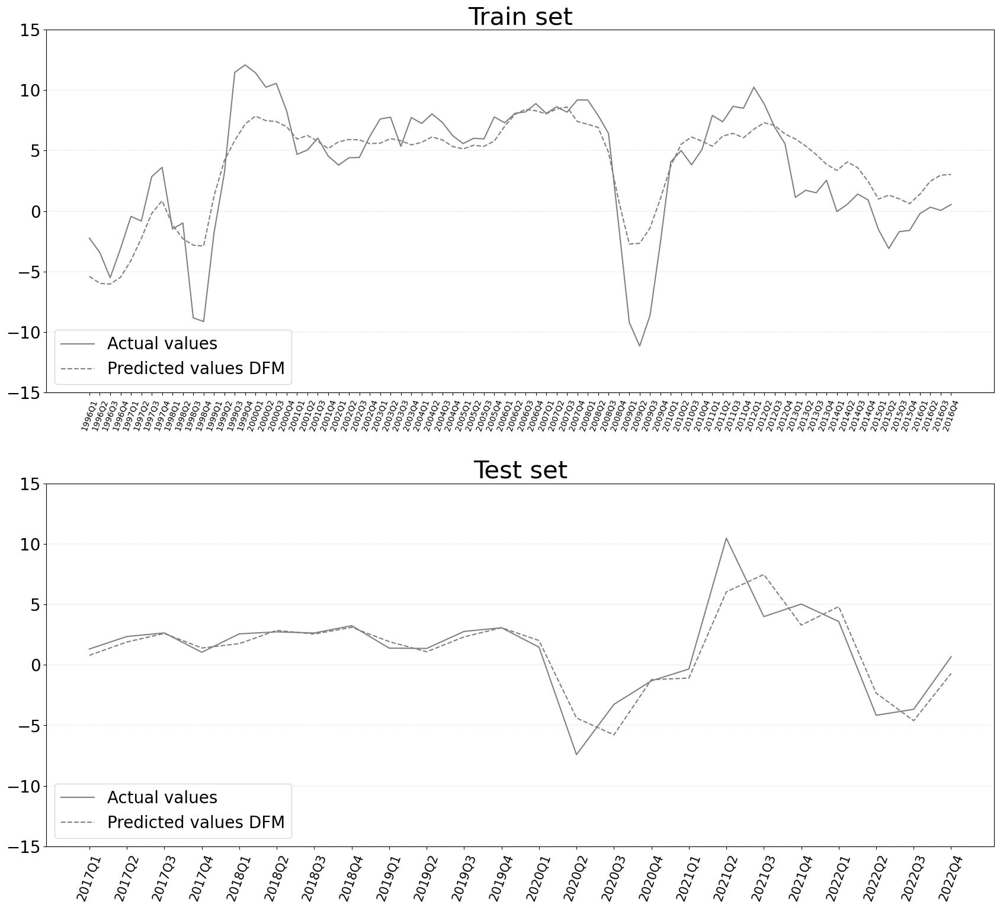

In [87]:
plt.figure(figsize=(8,15))

plt.subplot(211)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_train_actual[~np.isnan(GDP_train_actual)], c='gray', linestyle='-', label='Actual values', linewidth=1.5)
plt.plot(GDP_train_pred[~np.isnan(GDP_train_pred)], c='gray', linestyle='--', label='Predicted values DFM',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_train)), labels=dates_train, rotation=70, size=10)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Train set', size=30)

plt.subplot(212)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_test_actual[~np.isnan(GDP_test_actual)], c='gray', linestyle='-', label='Actual values',  linewidth=1.5)
plt.plot(GDP_test_pred[~np.isnan(GDP_test_pred)], c='gray', linestyle='--', label='Predicted values DFM',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_test)), labels=dates_test, rotation=70, size=15)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Test set', size=30)

plt.subplots_adjust(top=1, bottom=0.08, left=0, right=2, hspace=0.25, wspace=0.35)

plt.show()

# Загрузка имен датасета

In [88]:
names = pd.read_excel('C:/Users/user/Downloads/диплом/данные/Svod for calc.xlsx').iloc[:,1:].columns

In [89]:
names_ordered = []
for i in permutation:
    names_ordered.append(names[i])

In [90]:
names_ordered.remove('GDP')

In [91]:
len(names_ordered)

75

In [92]:
names_fin = []
for i in names_ordered:
    names_fin.insert(len(names_fin), i+'_1m')
    names_fin.insert(len(names_fin), i+'_2m')
    names_fin.insert(len(names_fin), i+'_3m')

In [93]:
names_fin[:] = [x for x in names_fin if x not in ['Investment_1m','Investment_2m',
                                                  'Conf_index_construction_1m','Conf_index_construction_2m',
                                                 'Conf_index_service_1m','Conf_index_service_2m',
                                                 'Conf_index_consumption_1m','Conf_index_consumption_2m']]

In [94]:
len(names_fin)

217

# Подготовка для LSTM

https://github.com/AbdulMoidM/Time-series-multi-step-forecasting-using-LSTM-Modelling-for-US-GDP/blob/master/model1B_3month.py

In [95]:
window = 4

df_x_test_lstm = []
df_x_test_lstm.extend(x_train_lstm_nan[len(x_train_lstm_nan)-window:])
df_x_test_lstm.extend(x_test_lstm_nan)

df_y_test_lstm = []
df_y_test_lstm.extend(y_train_lstm_std[len(y_train_lstm_std)-window:])
df_y_test_lstm.extend(y_test_lstm_std)

x_train_df_lstm, y_train_df_lstm = [], []
for i in range(window, len(x_train_lstm_nan)):
    x_train_df_lstm.append(np.array(x_train_lstm_nan)[i-window:i])
    y_train_df_lstm.append(np.array(y_train_lstm_std)[i])
    
x_test_df_lstm, y_test_df_lstm = [], []
for i in range(window, len(df_x_test_lstm)):
    x_test_df_lstm.append(df_x_test_lstm[i-window:i])
    y_test_df_lstm.append(df_y_test_lstm[i])

In [96]:
df_y_test_lstm_alone = []
df_y_test_lstm_alone.extend(y_train_lstm_alone_std[len(y_train_lstm_alone_std)-window:])
df_y_test_lstm_alone.extend(y_test_lstm_alone_std)

y_train_df_lstm_alone = []
for i in range(window, len(x_train_lstm_nan)):
    y_train_df_lstm_alone.append(np.array(y_train_lstm_alone_std)[i])
    
y_test_df_lstm_alone = []
for i in range(window, len(df_x_test_lstm)):
    y_test_df_lstm_alone.append(df_y_test_lstm_alone[i])

# LSTM

In [68]:
callback = EarlyStopping(
    monitor='mse', 
    patience=3, 
    min_delta=0.000001
)

In [73]:
def build_model(hp):
    model = Sequential()
    model.add(LSTM(hp.Int('first_layer_neurons',min_value=120,max_value=200,step=4), return_sequences=True, activation=hp.Choice('first_layer_activation', values=['relu','sigmoid','tanh'],default='relu'), kernel_regularizer=regularizers.L2(hp.Float('first_layer_l2',min_value=1e-3,max_value=1e-1,step=1e-4)), dropout=hp.Float('first_dropout_rate',min_value=0,max_value=0.3,step=0.01), input_shape=(np.array(x_train_df_lstm).shape[1], np.array(x_train_df_lstm).shape[2])))
#     kernel_regularizer=regularizers.L1(hp.Float('first_layer_l1',min_value=1e-3,max_value=1e-1,step=1e-4))
#     model.add(Dropout(hp.Float('first_dropout_rate',min_value=0,max_value=0.4,step=0.01)))
#     for i in range(hp.Int('n_layers', 0, 1)):
#         model.add(LSTM(hp.Int(f'{i}_layer_units',min_value=120,max_value=256,step=4), activation=hp.Choice(f'{i}_layer_activation', values=['relu', 'sigmoid', 'tanh'],default='relu'), kernel_regularizer=regularizers.L1(hp.Float('last_layer_l2',min_value=1e-3,max_value=1e-1,step=1e-4))))
#         model.add(Dropout(hp.Float(f'{i}_layer_dropout',min_value=0,max_value=0.4,step=0.05)))
    model.add(LSTM(hp.Int('last_layer_neurons',min_value=120,max_value=200,step=4), activation=hp.Choice('last_layer_activation', values=['relu', 'sigmoid', 'tanh'],default='relu'), kernel_regularizer=regularizers.L2(hp.Float('last_layer_l2',min_value=1e-3,max_value=1e-1,step=1e-4)), dropout=hp.Float('last_dropout_rate',min_value=0,max_value=0.3,step=0.01)))
#     model.add(Dropout(hp.Float('last_dropout_rate',min_value=0,max_value=0.4,step=0.01)))
    model.add(Dense(1, activation=hp.Choice('dense_activation',values=['relu','sigmoid', 'tanh'],default='relu')))
    model.compile(loss='mean_squared_error', optimizer=Adam(learning_rate=0.0001), metrics='mse')
    return model

In [74]:
tuner= RandomSearch(
        build_model,
        objective='mse',
        max_trials=100,
        executions_per_trial=1,
        overwrite=True
        )
tuner_alone= RandomSearch(
        build_model,
        objective='mse',
        max_trials=100,
        executions_per_trial=1,
        overwrite=True
        )

In [75]:
random.seed(10)

In [92]:
tuner.search(
        x=np.array(x_train_df_lstm[:int(len(x_train_df_lstm)*0.8)]),
        y=np.array(y_train_df_lstm[:int(len(x_train_df_lstm)*0.8)]),
        epochs=300,
        batch_size=16,
        callbacks=[callback],
        validation_data=(np.array(x_train_df_lstm[int(len(x_train_df_lstm)*0.8):]),np.array(y_train_df_lstm[int(len(x_train_df_lstm)*0.8):]))
)

Trial 100 Complete [00h 00m 15s]
mse: 0.6469382047653198

Best mse So Far: 0.25007164478302
Total elapsed time: 00h 24m 41s
INFO:tensorflow:Oracle triggered exit


In [76]:
tuner_alone.search(
        x=np.array(x_train_df_lstm[:int(len(x_train_df_lstm)*0.8)]),
        y=np.array(y_train_df_lstm_alone[:int(len(x_train_df_lstm)*0.8)]),
        epochs=300,
        batch_size=16,
        callbacks=[callback],
        validation_data=(np.array(x_train_df_lstm[int(len(x_train_df_lstm)*0.8):]),np.array(y_train_df_lstm_alone[int(len(x_train_df_lstm)*0.8):]))
)

Trial 100 Complete [00h 00m 12s]
mse: 0.593536376953125

Best mse So Far: 0.2158922255039215
Total elapsed time: 00h 25m 30s
INFO:tensorflow:Oracle triggered exit


In [93]:
# Get the top 2 hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)
# Build the model with the best hp
model = build_model(best_hps[0])
# Fit with the entire dataset
model.fit(x=np.array(x_train_df_lstm), y=np.array(y_train_df_lstm), epochs=300, batch_size=16, callbacks=[callback])

Epoch 1/300
5/5 [==============================] - 4s 15ms/step - loss: 23.0918 - mse: 1.0067
Epoch 2/300
5/5 [==============================] - 0s 12ms/step - loss: 22.7042 - mse: 0.9853
Epoch 3/300
5/5 [==============================] - 0s 8ms/step - loss: 22.3227 - mse: 0.9660
Epoch 4/300
5/5 [==============================] - 0s 13ms/step - loss: 21.9469 - mse: 0.9477
Epoch 5/300
5/5 [==============================] - 0s 12ms/step - loss: 21.5807 - mse: 0.9339
Epoch 6/300
5/5 [==============================] - 0s 10ms/step - loss: 21.2179 - mse: 0.9181
Epoch 7/300
5/5 [==============================] - 0s 12ms/step - loss: 20.8528 - mse: 0.8949
Epoch 8/300
5/5 [==============================] - 0s 9ms/step - loss: 20.5036 - mse: 0.8819
Epoch 9/300
5/5 [==============================] - 0s 13ms/step - loss: 20.1579 - mse: 0.8670
Epoch 10/300
5/5 [==============================] - 0s 12ms/step - loss: 19.8149 - mse: 0.8495
Epoch 11/300
5/5 [==============================] - 0s 9ms/st

In [98]:
# Get the top 2 hyperparameters
best_hps_alone = tuner_alone.get_best_hyperparameters(num_trials=1)
# Build the model with the best hp
model_alone = build_model(best_hps_alone[0])
# Fit with the entire dataset
model_alone.fit(x=np.array(x_train_df_lstm), y=np.array(y_train_df_lstm_alone), epochs=300, batch_size=16, callbacks=[callback])

Epoch 1/300
5/5 [==============================] - 4s 20ms/step - loss: 23.4682 - mse: 1.3719
Epoch 2/300
5/5 [==============================] - 0s 13ms/step - loss: 22.9944 - mse: 1.2685
Epoch 3/300
5/5 [==============================] - 0s 12ms/step - loss: 22.5445 - mse: 1.1837
Epoch 4/300
5/5 [==============================] - 0s 9ms/step - loss: 22.0987 - mse: 1.0972
Epoch 5/300
5/5 [==============================] - 0s 12ms/step - loss: 21.6517 - mse: 1.0033
Epoch 6/300
5/5 [==============================] - 0s 10ms/step - loss: 21.2311 - mse: 0.9301
Epoch 7/300
5/5 [==============================] - 0s 11ms/step - loss: 20.8256 - mse: 0.8661
Epoch 8/300
5/5 [==============================] - 0s 11ms/step - loss: 20.4522 - mse: 0.8286
Epoch 9/300
5/5 [==============================] - 0s 12ms/step - loss: 20.0990 - mse: 0.8052
Epoch 10/300
5/5 [==============================] - 0s 12ms/step - loss: 19.7481 - mse: 0.7786
Epoch 11/300
5/5 [==============================] - 0s 17ms/

5/5 [==============================] - 0s 9ms/step - loss: 1.0019 - mse: 0.1807
Epoch 174/300
5/5 [==============================] - 0s 12ms/step - loss: 0.9827 - mse: 0.1790
Epoch 175/300
5/5 [==============================] - 0s 9ms/step - loss: 0.9664 - mse: 0.1797
Epoch 176/300
5/5 [==============================] - 0s 8ms/step - loss: 0.9492 - mse: 0.1791
Epoch 177/300
5/5 [==============================] - 0s 14ms/step - loss: 0.9321 - mse: 0.1786
Epoch 178/300
5/5 [==============================] - 0s 11ms/step - loss: 0.9175 - mse: 0.1802
Epoch 179/300
5/5 [==============================] - 0s 11ms/step - loss: 0.9008 - mse: 0.1791
Epoch 180/300
5/5 [==============================] - 0s 13ms/step - loss: 0.8850 - mse: 0.1785
Epoch 181/300
5/5 [==============================] - 0s 12ms/step - loss: 0.8706 - mse: 0.1789
Epoch 182/300
5/5 [==============================] - 0s 8ms/step - loss: 0.8554 - mse: 0.1783
Epoch 183/300
5/5 [==============================] - 0s 12ms/step - 

In [124]:
model.save('LSTM.h5')

In [125]:
model_alone.save('LSTM_alone.h5')

In [97]:
model = load_model('LSTM.h5')

In [98]:
model_alone = load_model('LSTM_alone.h5')

In [69]:
# def build_model(train_x, train_y, epochs, batch_size, verbose):
    
#     model = Sequential()
# #     model.add(BatchNormalization())
#     model.add(LSTM(156, activation='relu', return_sequences=True, input_shape=(train_x.shape[1], train_x.shape[2])))
#     model.add(Dropout(0))
# #     model.add(BatchNormalization())
# #     model.add(Dropout(0.2))
#     model.add(LSTM(216, activation='tanh', return_sequences=True))
#     model.add(Dropout(0.30))
#     model.add(Dense(1))
#     model.compile(loss='mse')
# #                   , optimizer='adam')
    
#     model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose)
    
#     return model

In [99]:
def flatten(lst):
    return [item for sublist in lst for item in sublist]

In [100]:
def LSTM_model(model, train_x, train_y, test_x, test_y, epochs=100, batch_size=15, verbose=1):
    
#     best_hps = tuner.get_best_hyperparameters(num_trials=1)
#     model = build_model(best_hps[0])
#     model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose)
#     print(model.summary())
    
    predictions_train = []
    for history in train_x:
        history = history.reshape((1, history.shape[0], history.shape[1]))
        predictions_train.extend(flatten(model.predict(history)))

    predictions_test = []
    for history in test_x:
        history = history.reshape((1, history.shape[0], history.shape[1]))
        predictions_test.extend(flatten(model.predict(history)))
    
    rmse_train = np.sqrt(mean_squared_error(train_y, predictions_train))
    rmse_test = np.sqrt(mean_squared_error(test_y, predictions_test))
    print('RMSE train: ', rmse_train, '\n','RMSE test: ', rmse_test)
    
    return predictions_train, predictions_test

In [101]:
predictions_train_std, predictions_test_std = LSTM_model(model, np.array(x_train_df_lstm), np.array(y_train_df_lstm), np.array(x_test_df_lstm), np.array(y_test_df_lstm))

1/1 [==============================] - 0s 32ms/step
RMSE train:  0.475466688130265 
 RMSE test:  0.8733612216059544


In [102]:
predictions_train_alone_std, predictions_test_alone_std = LSTM_model(model_alone, np.array(x_train_df_lstm), np.array(y_train_df_lstm_alone), np.array(x_test_df_lstm), np.array(y_test_df_lstm_alone))

1/1 [==============================] - 0s 37ms/step
RMSE train:  0.4164633487440751 
 RMSE test:  0.6016335207096172


In [103]:
predictions_train = Wx_lstm_gdp * np.array(predictions_train_std) + Mx_lstm_gdp
predictions_test = Wx_lstm_gdp * np.array(predictions_test_std) + Mx_lstm_gdp

In [104]:
predictions_train_alone = Wx_lstm_alone_gdp * np.array(predictions_train_alone_std) + Mx_lstm_alone_gdp
predictions_test_alone = Wx_lstm_alone_gdp * np.array(predictions_test_alone_std) + Mx_lstm_alone_gdp

In [105]:
np.sqrt(mean_squared_error(np.array(y_train_df_lstm)*Wx_lstm_gdp + Mx_lstm_gdp, predictions_train))

1.315729236402601

In [106]:
np.sqrt(mean_squared_error(np.array(y_test_df_lstm)*Wx_lstm_gdp + Mx_lstm_gdp, predictions_test))

2.4167978551897833

In [107]:
np.sqrt(mean_squared_error(np.array(y_train_df_lstm_alone)*Wx_lstm_alone_gdp + Mx_lstm_alone_gdp, predictions_train_alone))

2.208511061231321

In [108]:
np.sqrt(mean_squared_error(np.array(y_test_df_lstm_alone)*Wx_lstm_alone_gdp + Mx_lstm_alone_gdp, predictions_test_alone))

3.1904710203785234

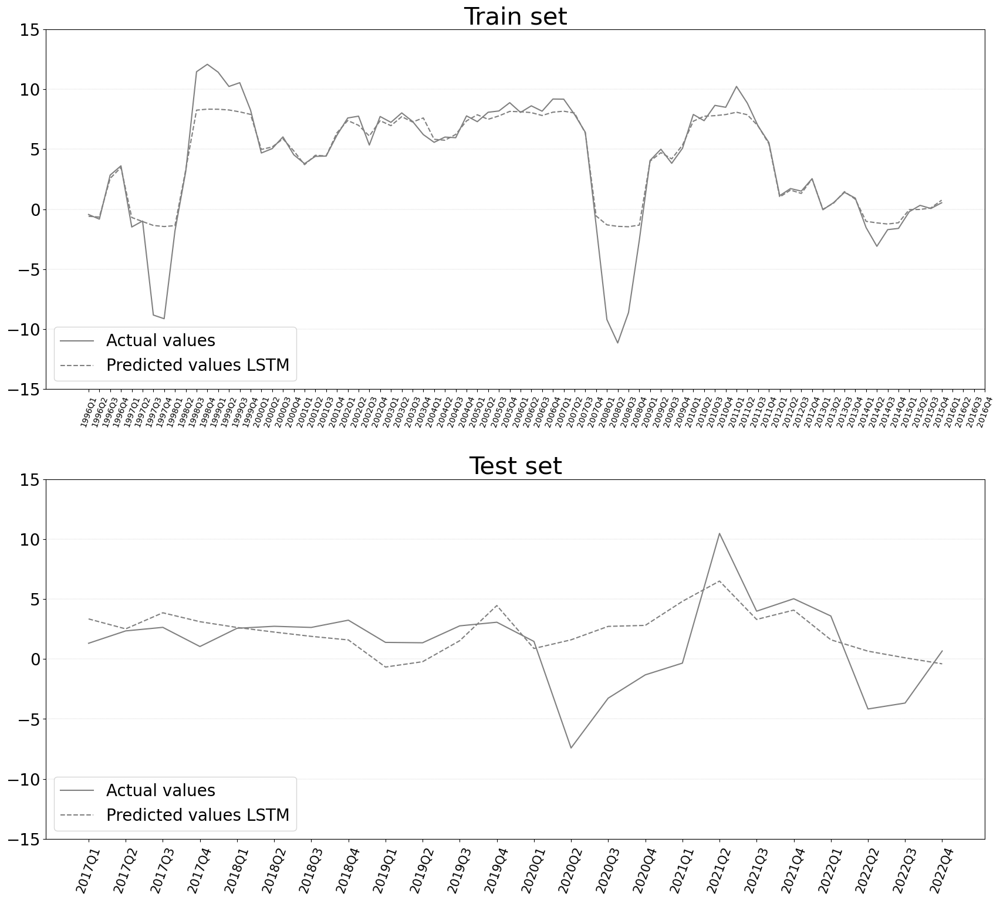

In [110]:
plt.figure(figsize=(8,15))

plt.subplot(211)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(np.array(y_train_df_lstm_alone)*Wx_lstm_alone_gdp + Mx_lstm_alone_gdp, c='gray', linestyle='-', label='Actual values', linewidth=1.5)
plt.plot(predictions_train_alone[~np.isnan(predictions_train_alone)], c='gray', linestyle='--', label='Predicted values LSTM',  linewidth=1.5)
# plt.plot(cat_train_preds[~np.isnan(cat_train_preds)], c='black', label='Предсказанные значения CatBoost',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_train)), labels=dates_train, rotation=70, size=10)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Train set', size=30)

plt.subplot(212)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(np.array(y_test_df_lstm_alone)*Wx_lstm_alone_gdp + Mx_lstm_alone_gdp, c='gray', linestyle='-', label='Actual values',  linewidth=1.5)
plt.plot(predictions_test_alone[~np.isnan(predictions_test_alone)], c='gray', linestyle='--', label='Predicted values LSTM',  linewidth=1.5)
# plt.plot(cat_test_preds[~np.isnan(cat_test_preds)], c='black', label='Предсказанные значения CatBoost',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_test)), labels=dates_test, rotation=70, size=15)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Test set', size=30)

plt.subplots_adjust(top=1, bottom=0.08, left=0, right=2, hspace=0.25, wspace=0.35)

plt.show()

NameError: name 'svr_train_preds' is not defined

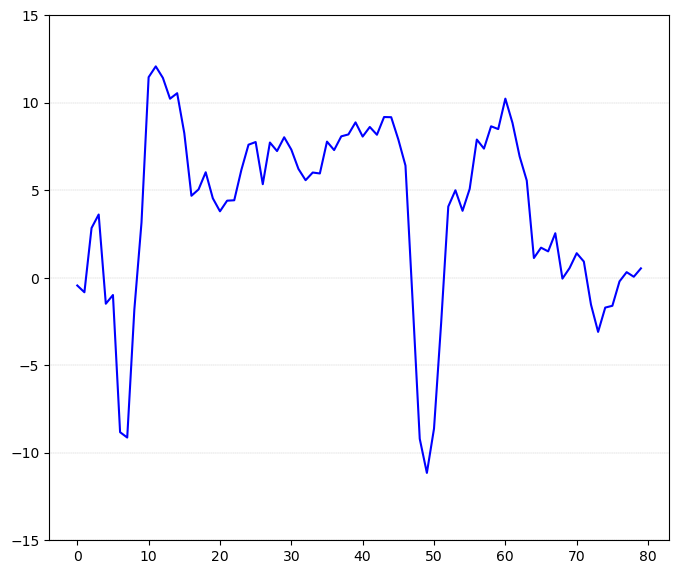

In [85]:
plt.figure(figsize=(8,15))

plt.subplot(211)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(np.array(y_train_df_lstm_alone)*Wx_lstm_alone_gdp + Mx_lstm_alone_gdp, c='b', label='Фактические значения', linewidth=1.5)
plt.plot(svr_train_preds[~np.isnan(svr_train_preds)], c='black', label='Предсказанные значения SVR',  linewidth=1.5)
plt.plot(svr_train_preds[~np.isnan(svr_train_preds)], c='black', label='Предсказанные значения SVR',  linewidth=1.5)
plt.plot(svr_train_preds[~np.isnan(svr_train_preds)], c='black', label='Предсказанные значения SVR',  linewidth=1.5)
plt.plot(cat_train_preds[~np.isnan(cat_train_preds)], c='g', label='Предсказанные значения CatBoost',  linewidth=1.5)
plt.plot(predictions_train_alone[~np.isnan(predictions_train_alone)], c='red', label='Предсказанные значения LSTM',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_train)), labels=dates_train, rotation=70, size=10)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Обучающая выборка', size=30)

plt.subplot(212)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(np.array(y_test_df_lstm_alone)*Wx_lstm_alone_gdp + Mx_lstm_alone_gdp, c='b', label='Фактические значения',  linewidth=1.5)
plt.plot(svr_test_preds[~np.isnan(svr_test_preds)], c='black', label='Предсказанные значения SVR',  linewidth=1.5)
plt.plot(cat_test_preds[~np.isnan(cat_test_preds)], c='g', label='Предсказанные значения CatBoost',  linewidth=1.5)
plt.plot(predictions_test_alone[~np.isnan(predictions_test_alone)], c='red', label='Предсказанные значения LSTM',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_test)), labels=dates_test, rotation=70, size=15)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Тестовая выборка', size=30)

plt.subplots_adjust(top=1, bottom=0.08, left=0, right=2, hspace=0.25, wspace=0.35)

plt.show()

# Анализ нейронной сети

In [111]:
baseline = tf.zeros(shape=(np.array(x_train_df_lstm).shape[1],np.array(x_train_df_lstm).shape[2]))

def interpolate(baseline_x, val, alphas):
    alphas_x = alphas[:, tf.newaxis, tf.newaxis]
    input_x = val.astype('float32')
    delta = input_x - baseline_x
    vals = baseline_x +  alphas_x * delta
    return vals

def compute_gradients(vals, model):
    with tf.GradientTape() as tape:
        tape.watch(vals)
        preds = model(vals)
    return tape.gradient(preds, vals)

def integral_approximation(gradients):
    # riemann_trapezoidal
    grads = (gradients[:-1] + gradients[1:]) / tf.constant(2.0)
    integrated_gradients = tf.math.reduce_mean(grads, axis=0)
    return integrated_gradients

In [112]:
def integrated_gradients(baseline, val, model, m_steps=50, batch_size=1):
    # 1. Generate alphas.
    alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)
    # Initialize TensorArray outside loop to collect gradients.    
    gradient_batches = tf.TensorArray(tf.float32, size=m_steps+1)
    
    val = val.astype('float32')
    
    # Iterate alphas range and batch computation for speed, memory #efficiency, and scaling to larger m_steps.
    for alpha in tf.range(0, len(alphas), batch_size):
        from_ = alpha
        to = tf.minimum(from_ + batch_size, len(alphas))
        alpha_batch = alphas[from_:to]
        # 2. Generate interpolated inputs between baseline and input.
        interpolated_path_input_batch = interpolate(baseline, val, alpha_batch)
        # 3. Compute gradients between model outputs and interpolated inputs.
        gradient_batch = compute_gradients(interpolated_path_input_batch, model)

        # Write batch indices and gradients to extend TensorArray.
        gradient_batches = gradient_batches.scatter(tf.range(from_, to), gradient_batch)    
  
    # Stack path gradients together row-wise into single tensor.
    total_gradients = gradient_batches.stack()
    # 4. Integral approximation through averaging gradients.
    avg_gradients = integral_approximation(gradients=total_gradients)
    # 5. Scale integrated gradients with respect to input.
    integrated_gradients = (val - baseline) * avg_gradients
    return integrated_gradients

In [113]:
IGs = []
for i in range(np.array(x_test_df_lstm).shape[0]):
    IGs.append(integrated_gradients(baseline, np.array(x_test_df_lstm)[i], model_alone, m_steps=217))

In [114]:
igs_df = pd.DataFrame(None, dates_test, names_fin)

for i in range(igs_df.shape[0]):
    for k in range(igs_df.shape[1]):
#         igs_df.iloc[i,k] = float(IGs[i][3][k])
#         igs_df.iloc[i,k] = np.mean([IGs[i][0][k], IGs[i][1][k], IGs[i][2][k], IGs[i][3][k]])
        igs_df.iloc[i,k] = 0.1*IGs[i][0][k]+0.2*IGs[i][1][k]+0.3*IGs[i][2][k]+0.4*IGs[i][3][k]

In [115]:
igs_df_short = pd.DataFrame(None, dates_test, names).drop('GDP', axis=1)

for i in igs_df_short.index:
    for k in igs_df_short.columns:
        l = []
        for j in igs_df.columns:
            if k == j[:-3]:
                l.append(igs_df.loc[i,j])
        igs_df_short.loc[i,k] = np.mean(l)
        if np.mean(l) == np.nan:
            print(i,k)

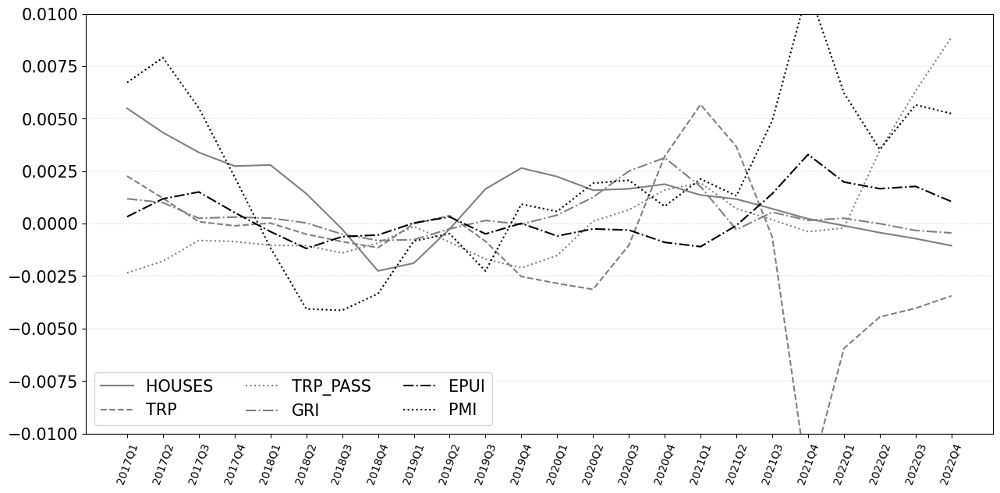

In [116]:
plt.figure(figsize=(15,7))

plt.ylim([-0.01, 0.01])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)

# plt.plot(range(0,len(dates_test)), igs_df_short['Brent'], c='green', label='Brent', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['M0'], c='gold', label='M0', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['Export'], c='salmon', label='Export', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['Import'], c='tan', label='Import', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['Electricity'], c='silver', label='Electricity', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['TRP'], c='blue', label='TRP', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['EPUI'], c='red', label='EPUI', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['Conf_index_manufacturing'], c='sienna', label='Conf_index_manufacturing', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['Conf_index_service'], c='magenta', label='Conf_index_service', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['РЭБ_индекс_цен_выпуск_промышленность_факт_1'], c='magenta', label='РЭБ_индекс_цен_выпуск_промышленность_факт_1', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['РЭБ_индекс_порфтеля_заказов_промышленность_факт_1'], c='magenta', label='РЭБ_индекс_порфтеля_заказов_промышленность_факт_1', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['РЭБ_индекс_занятость_промышленность_факт_1'], c='magenta', label='РЭБ_индекс_занятость_промышленность_факт_1', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['РЭБ_индекс_цен_покупаемая_продукция_промышленность_ожидания_3'], c='magenta', label='РЭБ_индекс_цен_покупаемая_продукция_промышленность_ожидания_3', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['РЭБ_индекс_занятость_промышленность_ожидания_3'], c='magenta', label='РЭБ_индекс_занятость_промышленность_ожидания_3', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['РЭБ_индекс_зарплата_промышленность_ожидания_3'], c='magenta', label='РЭБ_индекс_зарплата_промышленность_ожидания_3', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['РЭБ_индекс_портфель_заказов_промышленность_ожидания_3'], c='magenta', label='РЭБ_индекс_портфель_заказов_промышленность_ожидания_3', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['РЭБ_портфель_заказов_промышленность'], c='magenta', label='РЭБ_портфель_заказов_промышленность', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['РЭБ_доля_предприятий_хорошее_финсостояние_промышленность'], c='magenta', label='РЭБ_доля_предприятий_хорошее_финсостояние_промышленность', linewidth=1.5)

n=35
plt.plot(range(0,len(dates_test)), igs_df_short[igs_df_short.columns[n]], c='gray', linestyle='-', label=igs_df_short.columns[n], linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_short[igs_df_short.columns[n+1]], c='gray', linestyle='--', label=igs_df_short.columns[n+1], linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_short[igs_df_short.columns[n+2]], c='gray', linestyle=':', label=igs_df_short.columns[n+2], linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_short[igs_df_short.columns[n+3]], c='gray', linestyle='-.', label=igs_df_short.columns[n+3], linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_short[igs_df_short.columns[n+4]], c='black', linestyle='-.', label=igs_df_short.columns[n+4], linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_short[igs_df_short.columns[n+5]], c='black', linestyle=':', label=igs_df_short.columns[n+5], linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['Prices'], c='green', label='Prices', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['Uncertainty'], c='gold', label='Uncertainty', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['Investment'], c='black', label='Investment', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['Confidence'], c='indigo', label='Confidence', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['Labor'], c='salmon', label='Labor', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['Financial Markets'], c='lightblue', label='Financial Markets', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['Banking'], c='tan', label='Banking', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['Construction'], c='yellowgreen', label='Construction', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_short['Credits'], c='silver', label='Credits', linewidth=1.5)

plt.xticks(ticks=range(0,len(dates_test)), labels=dates_test, rotation=70, size=10)
plt.yticks(size=15)
plt.legend(fontsize=15, loc='best', ncol=3)
plt.show()

In [117]:
categories = pd.read_excel('Spec.xls', index_col=1).loc[:,'Category'].to_dict()
igs_df_cat = igs_df_short.copy()
igs_df_cat.rename(categories, axis=1, inplace=True)

In [123]:
igs_df_cat_short = pd.DataFrame(None, dates_test, list(set(categories.values()))).drop('GDP', axis=1)

for i in igs_df_cat_short.index:
    for k in igs_df_cat_short.columns:
        l = []
        for j in igs_df_cat.columns:
            if k == j:
                l.append(igs_df_cat.loc[i,j])
        igs_df_cat_short.loc[i,k] = np.mean(l)

In [124]:
igs_df_cat_short.to_excel('igs_df_cat_short_new.xlsx')

In [125]:
igs_df_cat_short.columns

Index([                    1, 'Monetary aggregates',          'Confidence',
                    'Prices',           'Transport',       'Orders volume',
       'International Trade',          'Employment',    'Financial Health',
               'Uncertainty',               'Wages'],
      dtype='object')

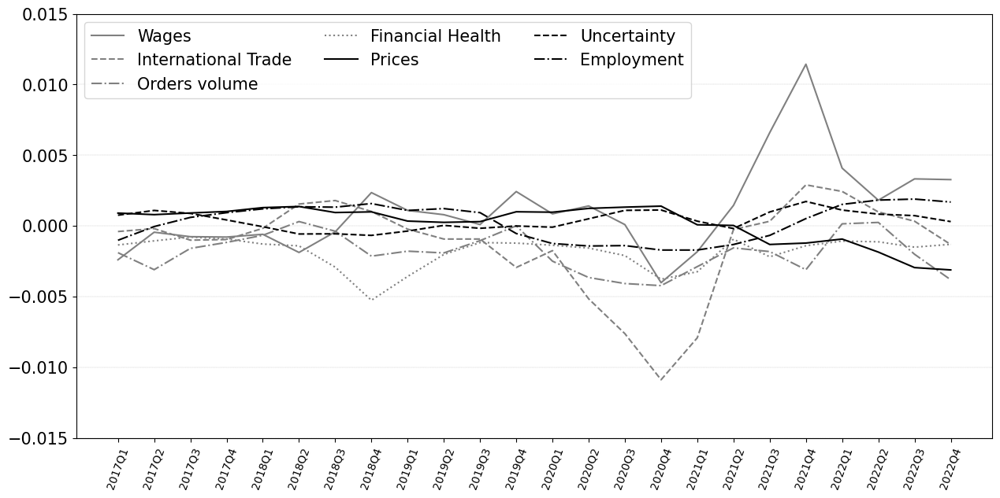

In [126]:
plt.figure(figsize=(15,7))

plt.ylim([-0.015, 0.015])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)

plt.plot(range(0,len(dates_test)), igs_df_cat_short['Wages'], c='gray', linestyle='-', label='Wages', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_cat_short['Transport'], c='aqua', label='Transport', linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_cat_short['International Trade'], c='gray', linestyle='--', label='International Trade', linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_cat_short['Orders volume'], c='gray', linestyle='-.', label='Orders volume', linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_cat_short['Financial Health'], c='gray', linestyle=':', label='Financial Health', linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_cat_short['Prices'], c='black', linestyle='-', label='Prices', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_cat_short['Prices_purchase'], c='yellowgreen', label='Prices_purchase', linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_cat_short['Uncertainty'], c='black', linestyle='--', label='Uncertainty', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_cat_short['Confidence'], c='indigo', label='Confidence', linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_cat_short['Employment'], c='black', linestyle='-.', label='Employment', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_cat_short['Monetary aggregates'], c='tan', label='Monetary aggregates', linewidth=1.5)

plt.xticks(ticks=range(0,len(dates_test)), labels=dates_test, rotation=70, size=10)
plt.yticks(size=15)
plt.legend(fontsize=15, loc='best', ncol=3)
plt.show()

KeyError: 'Labor'

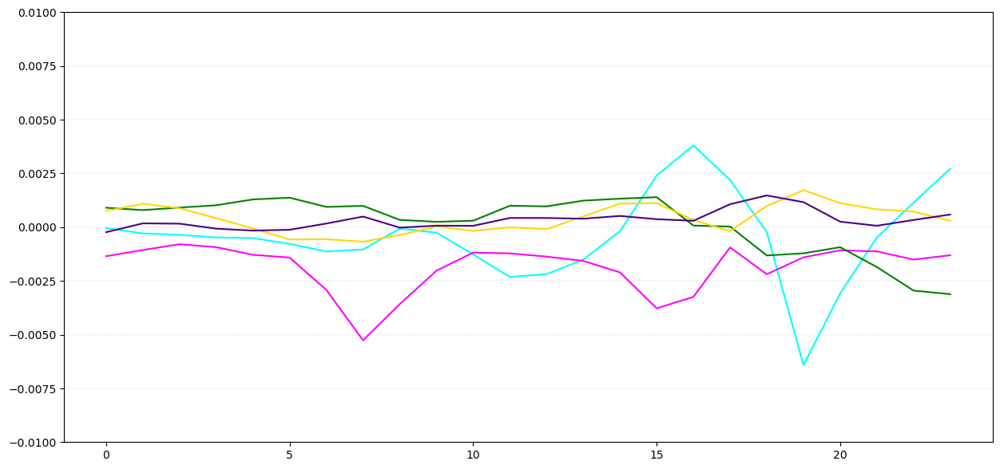

In [127]:
plt.figure(figsize=(15,7))

plt.ylim([-0.01, 0.01])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)

# plt.plot(range(0,len(dates_test)), igs_df_cat_short['Production'], c='blue', label='Production', linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_cat_short['Transport'], c='aqua', label='Transport', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_cat_short['International Trade'], c='red', label='International Trade', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_cat_short['Industry'], c='sienna', label='Industry', linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_cat_short['Financial Health'], c='magenta', label='Financial Health', linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_cat_short['Prices'], c='green', label='Prices', linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_cat_short['Uncertainty'], c='gold', label='Uncertainty', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_cat_short['Investment'], c='black', label='Investment', linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_cat_short['Confidence'], c='indigo', label='Confidence', linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_cat_short['Labor'], c='salmon', label='Labor', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_cat_short['Financial Markets'], c='lightblue', label='Financial Markets', linewidth=1.5)
plt.plot(range(0,len(dates_test)), igs_df_cat_short['Banking'], c='tan', label='Banking', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_cat_short['Construction'], c='yellowgreen', label='Construction', linewidth=1.5)
# plt.plot(range(0,len(dates_test)), igs_df_cat_short['Credits'], c='silver', label='Credits', linewidth=1.5)

plt.xticks(ticks=range(0,len(dates_test)), labels=dates_test, rotation=70, size=10)
plt.yticks(size=15)
plt.legend(fontsize=15, loc='best', ncol=3)
plt.show()

# Оценка ансамбля

In [128]:
np.sqrt(mean_squared_error(GDP_train_actual[~np.isnan(GDP_train_actual)][window:], GDP_train_pred[~np.isnan(GDP_train_pred)][window:]+predictions_train))

1.315729236402601

In [129]:
np.sqrt(mean_squared_error(GDP_test_actual[~np.isnan(GDP_test_actual)], GDP_test_pred[~np.isnan(GDP_test_pred)]+predictions_test))

2.4167978551897833

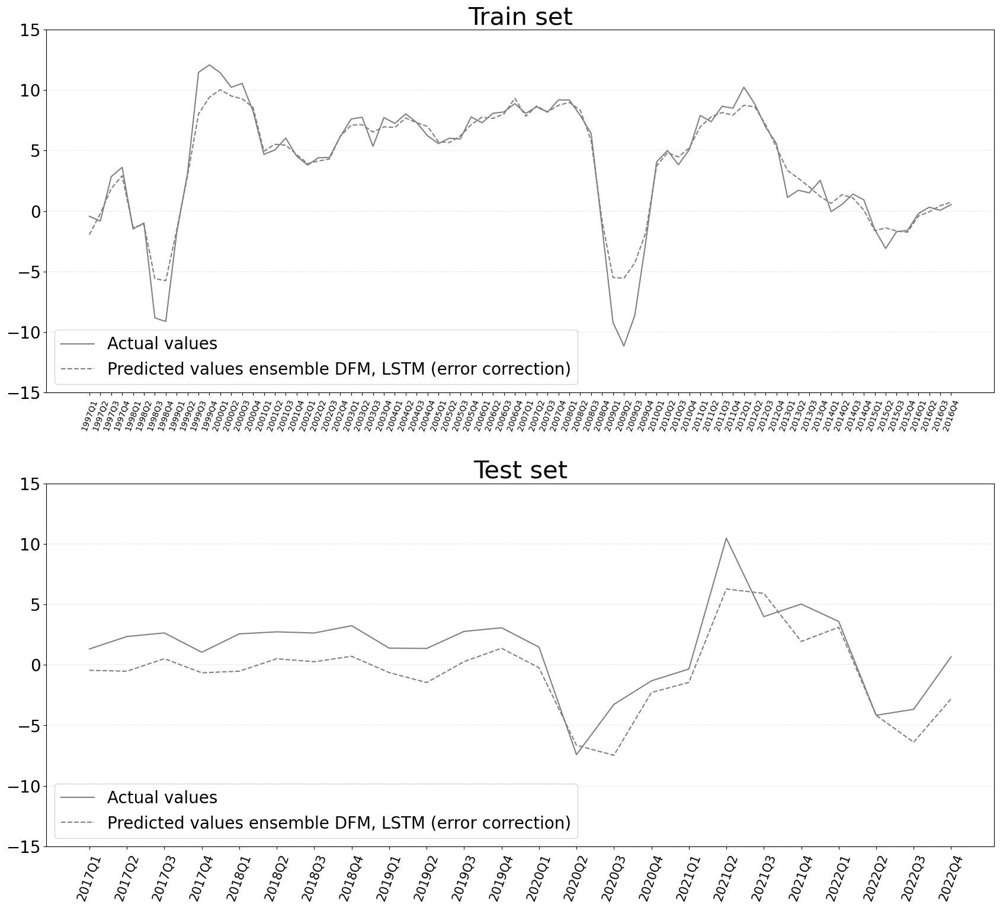

In [130]:
plt.figure(figsize=(8,15))

plt.subplot(211)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_train_actual[~np.isnan(GDP_train_actual)][window:], c='gray', linestyle='-', label='Actual values', linewidth=1.5)
plt.plot(GDP_train_pred[~np.isnan(GDP_train_pred)][window:]+predictions_train, c='gray', linestyle='--', label='Predicted values ensemble DFM, LSTM (error correction)',  linewidth=1.5)
# plt.plot(0.5*GDP_train_pred[~np.isnan(GDP_train_pred)][window:]+0.5*predictions_train_alone, c='g', label=r'Predicted values $^1/_2$DFM+$^1/_2$LSTM',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_train[4:])), labels=dates_train[4:], rotation=70, size=10)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Train set', size=30)

plt.subplot(212)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_test_actual[~np.isnan(GDP_test_actual)], c='gray', linestyle='-', label='Actual values',  linewidth=1.5)
plt.plot(GDP_test_pred[~np.isnan(GDP_test_pred)]+predictions_test, c='gray', linestyle='--', label='Predicted values ensemble DFM, LSTM (error correction)',  linewidth=1.5)
# plt.plot(0.5*GDP_test_pred[~np.isnan(GDP_test_pred)]+0.5*predictions_test_alone, c='g', label=r'Predicted values $^1/_2$DFM+$^1/_2$LSTM',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_test)), labels=dates_test, rotation=70, size=15)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Test set', size=30)

plt.subplots_adjust(top=1, bottom=0.08, left=0, right=2, hspace=0.25, wspace=0.35)

plt.show()

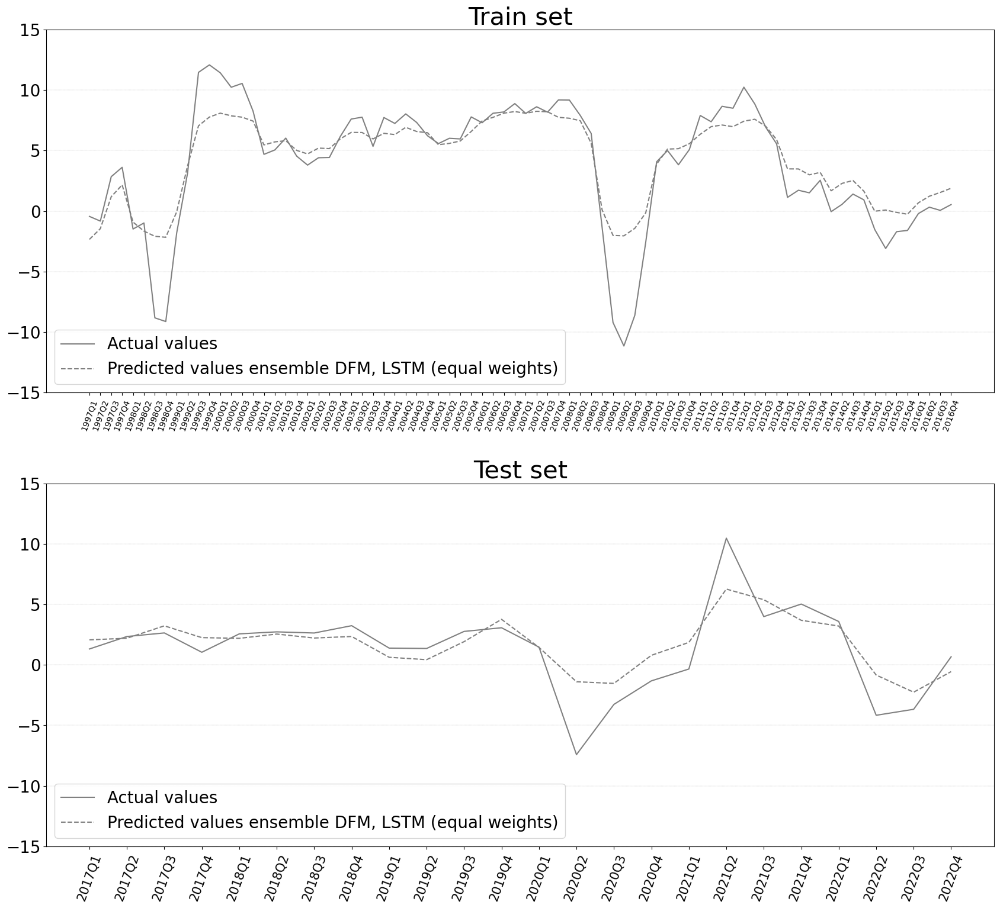

In [132]:
plt.figure(figsize=(8,15))

plt.subplot(211)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_train_actual[~np.isnan(GDP_train_actual)][window:], c='gray', linestyle='-', label='Actual values', linewidth=1.5)
# plt.plot(GDP_train_pred[~np.isnan(GDP_train_pred)][window:]+predictions_train, c='g', label='Predicted values DFM+LSTM',  linewidth=1.5)
plt.plot(0.5*GDP_train_pred[~np.isnan(GDP_train_pred)][window:]+0.5*predictions_train_alone, c='gray', linestyle='--', label='Predicted values ensemble DFM, LSTM (equal weights)',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_train[4:])), labels=dates_train[4:], rotation=70, size=10)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Train set', size=30)

plt.subplot(212)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_test_actual[~np.isnan(GDP_test_actual)], c='gray', linestyle='-', label='Actual values',  linewidth=1.5)
# plt.plot(GDP_test_pred[~np.isnan(GDP_test_pred)]+predictions_test, c='g', label='Predicted values DFM+LSTM',  linewidth=1.5)
plt.plot(0.5*GDP_test_pred[~np.isnan(GDP_test_pred)]+0.5*predictions_test_alone, c='gray', linestyle='--', label='Predicted values ensemble DFM, LSTM (equal weights)',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_test)), labels=dates_test, rotation=70, size=15)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Test set', size=30)

plt.subplots_adjust(top=1, bottom=0.08, left=0, right=2, hspace=0.25, wspace=0.35)

plt.show()

# Оценка средневзвешенного ансамбля

In [133]:
np.sqrt(mean_squared_error(GDP_train_actual[~np.isnan(GDP_train_actual)][window:], 0.5*GDP_train_pred[~np.isnan(GDP_train_pred)][window:]+0.5*predictions_train_alone))

2.3540645108048293

In [134]:
np.sqrt(mean_squared_error(GDP_test_actual[~np.isnan(GDP_test_actual)], 0.5*GDP_test_pred[~np.isnan(GDP_test_pred)]+0.5*predictions_test_alone))

1.9457637953031757

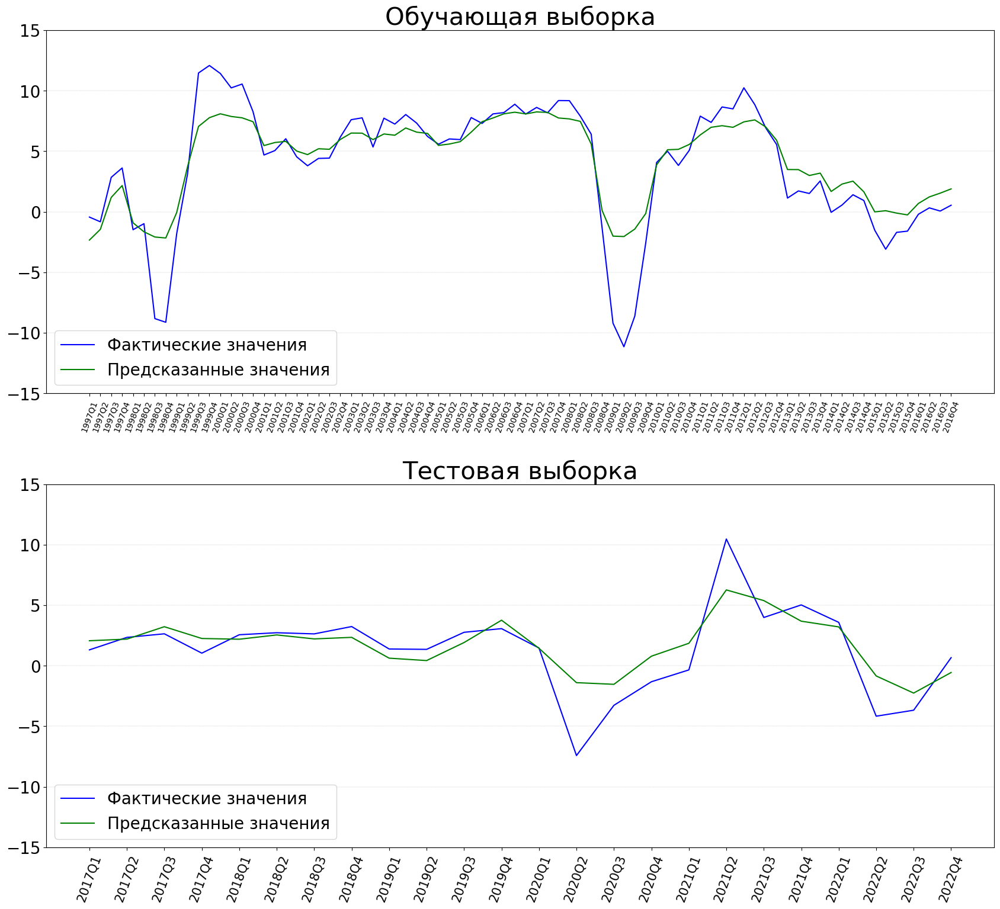

In [120]:
plt.figure(figsize=(8,15))

plt.subplot(211)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_train_actual[~np.isnan(GDP_train_actual)][window:], c='b', label='Actual values', linewidth=1.5)
plt.plot(0.5*GDP_train_pred[~np.isnan(GDP_train_pred)][window:]+0.5*predictions_train_alone, c='g', label=r'Predicted values \dfrac{1}{2}DFM+\dfrac{1}{2}LSTM',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_train[4:])), labels=dates_train[4:], rotation=70, size=10)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Обучающая выборка', size=30)

plt.subplot(212)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_test_actual[~np.isnan(GDP_test_actual)], c='b', label='Actual values',  linewidth=1.5)
plt.plot(0.5*GDP_test_pred[~np.isnan(GDP_test_pred)]+0.5*predictions_test_alone, c='g', label=r'Predicted values \dfrac{1}{2}DFM+\dfrac{1}{2}LSTM',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_test)), labels=dates_test, rotation=70, size=15)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Тестовая выборка', size=30)

plt.subplots_adjust(top=1, bottom=0.08, left=0, right=2, hspace=0.25, wspace=0.35)

plt.show()

# Подготовка для моделей-конкурентов

In [135]:
Mx_lstm_comp   = np.nanmean(GDP_train_actual,axis = 0)
Wx_lstm_comp   = np.nanstd(GDP_train_actual,axis = 0,ddof = 1)
y_train_comp = (GDP_train_actual - Mx_lstm_comp) / Wx_lstm_comp

In [136]:
y_test_comp = (GDP_test_actual - Mx_lstm_comp) / Wx_lstm_comp

# ARMAX

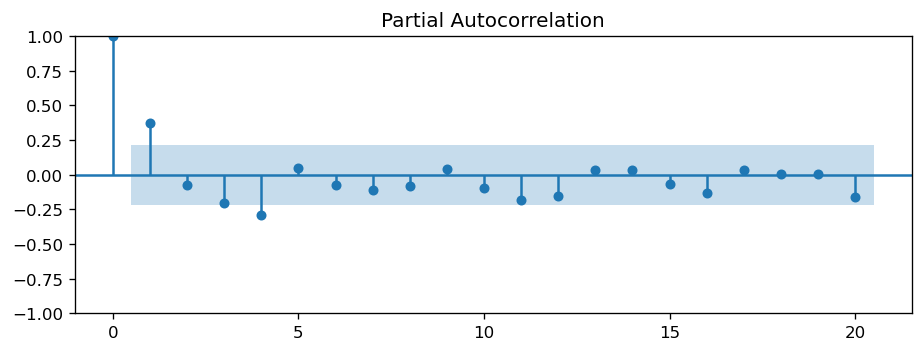

In [137]:
plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120}) 
 
plot_pacf(pd.Series(y_train_comp[~np.isnan(y_train_comp)]).diff().dropna()) 
 
plt.show()

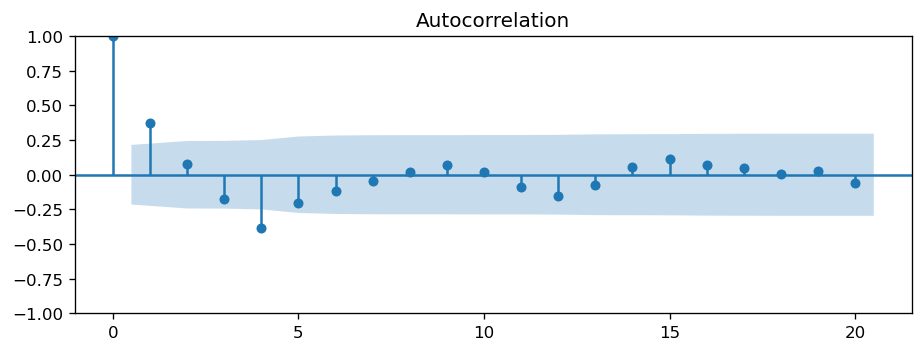

In [138]:
plt.rcParams.update({'figure.figsize' :(9,3), 'figure.dpi' : 120}) 
 
plot_acf(pd.Series(y_train_comp[~np.isnan(y_train_comp)]).diff().dropna()) 
 
plt.show() 

Lags    - AIC 
(1,0,0) - -1324.156
(0,0,1) - -1323.758
(1,0,1) - -1322.146
(2,0,0) - -1322.150
(2,0,1) - -1320.039
(0,0,2) - -1321.982
(1,0,2) - -1319.981
(2,0,2) - -1317.938

In [139]:
arimax = sm.tsa.arima.ARIMA(y_train_comp[~np.isnan(y_train_comp)], exog=x_train_lstm_nan, order=(1,0,1)).fit()
print(arimax.summary())

C:\Users\user\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   84
Model:                 ARIMA(1, 0, 1)   Log Likelihood                 890.071
Date:                Fri, 20 Oct 2023   AIC                          -1338.142
Time:                        23:46:17   BIC                           -800.932
Sample:                             0   HQIC                         -1122.188
                                 - 84                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0148   9.89e-05   -149.227      0.000      -0.015      -0.015
x1            -0.0048      0.000    -42.020      0.000      -0.005      -0.005
x2            -0.0007      0.000     -5.441      0.0

In [140]:
armax_train_preds = arimax.fittedvalues * Wx_lstm_comp + Mx_lstm_comp
armax_test_preds = arimax.predict(start=x_train_lstm_nan.shape[0],end=(x_train_lstm_nan.shape[0]+x_test_lstm_nan.shape[0]-1), exog=x_test_lstm_nan, dynamic=False) * Wx_lstm_comp + Mx_lstm_comp

In [141]:
round(np.sqrt(mean_squared_error(GDP_train_actual[~np.isnan(GDP_train_actual)], armax_train_preds)), 2)

0.0

In [142]:
np.sqrt(mean_squared_error(GDP_test_actual[~np.isnan(GDP_test_actual)], armax_test_preds))

8.556500031420782

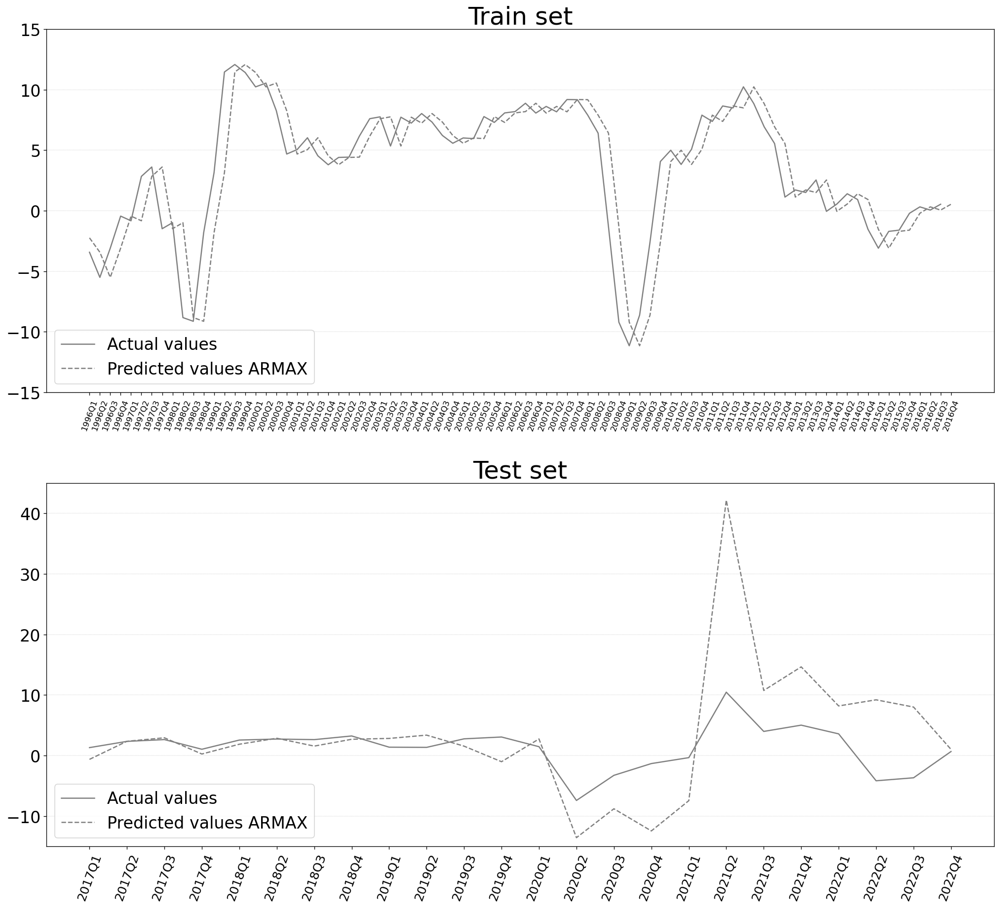

In [143]:
plt.figure(figsize=(8,15))

plt.subplot(211)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_train_actual[~np.isnan(GDP_train_actual)][1:], c='gray', linestyle='-', label='Actual values', linewidth=1.5)
plt.plot(armax_train_preds, c='gray', linestyle='--', label='Predicted values ARMAX',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_train)), labels=dates_train, rotation=70, size=10)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Train set', size=30)

plt.subplot(212)
plt.ylim([-15, 45])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_test_actual[~np.isnan(GDP_test_actual)], c='gray', linestyle='-', label='Actual values',  linewidth=1.5)
plt.plot(armax_test_preds, c='gray', linestyle='--', label='Predicted values ARMAX',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_test)), labels=dates_test, rotation=70, size=15)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Test set', size=30)

plt.subplots_adjust(top=1, bottom=0.08, left=0, right=2, hspace=0.25, wspace=0.35)

plt.show()

# VAR

In [142]:
#https://www.machinelearningplus.com/time-series/vector-autoregression-examples-python/

In [144]:
x_train_lstm_nan_var = np.insert(x_train_lstm_nan, x_train_lstm_nan.shape[1], y_train_comp[~np.isnan(y_train_comp)], axis=1)

In [145]:
maxlag=5
test = 'ssr_chi2test'
def grangers_causation_matrix(data, variables, test=test, verbose=False):    
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.
    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            try:
                test_result = grangercausalitytests(data[:,[c,r]], maxlag=maxlag, verbose=False)
                p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            except:
                p_values = np.nan
#             p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [str(var) + '_x' for var in variables]
    df.index = [str(var) + '_y' for var in variables]
    return df

granger_res = grangers_causation_matrix(x_train_lstm_nan_var, variables = [x for x in range(x_train_lstm_nan_var.shape[1])])        

C:\Users\user\anaconda3\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning:

verbose is deprecated since functions should not print results



In [146]:
preds_var = [int(x.replace('_x', '')) for x in granger_res.columns if granger_res.loc[str(x_train_lstm_nan.shape[1])+'_y', x] <= 0.05]
preds_var.insert(0, x_train_lstm_nan.shape[1])
preds_var

[217,
 1,
 2,
 4,
 5,
 7,
 8,
 9,
 11,
 21,
 23,
 24,
 25,
 31,
 32,
 33,
 35,
 36,
 40,
 41,
 42,
 45,
 46,
 47,
 48,
 49,
 54,
 55,
 56,
 57,
 62,
 63,
 65,
 69,
 71,
 72,
 73,
 74,
 79,
 80,
 81,
 92,
 94,
 95,
 96,
 102,
 103,
 104,
 105,
 106,
 107,
 109,
 111,
 112,
 113,
 118,
 119,
 121,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 136,
 140,
 142,
 143,
 144,
 147,
 148,
 150,
 151,
 152,
 153,
 163,
 166,
 167,
 173,
 175,
 176,
 177,
 178,
 182,
 183,
 184,
 185,
 186,
 187,
 189,
 190,
 196,
 197,
 198,
 199,
 200,
 207,
 213]

In [147]:
for j in range(1,11):
    var = VAR(x_train_lstm_nan_var).fit(j)
    
    lag_order = j
    
    num = int(len(x_train_df_lstm)*0.8)

    train_preds = []
    for i in range(x_train_lstm_nan_var[:num].shape[0]):
        train_preds.append(var.forecast(y=x_train_lstm_nan_var[:num][:lag_order+i,:], steps=1)[0][0])

    test_preds = [train_preds[len(train_preds)-1]]
    train_preds = train_preds[:len(train_preds)-1]

    for i in range(x_train_lstm_nan_var[num:].shape[0]):
        test_preds.append(var.forecast(y=x_train_lstm_nan_var[num:][:lag_order+i,:], steps=1)[0][0])

    test_preds = test_preds[:len(test_preds)-1]
    
    var_train_preds = np.array(train_preds) * Wx_lstm_comp + Mx_lstm_comp
    var_test_preds = np.array(test_preds) * Wx_lstm_comp + Mx_lstm_comp
    
#     print(len(var_train_preds))
#     print(len(var_test_preds))
#     print(GDP_train_actual[~np.isnan(GDP_train_actual)][:num])
    print(j)
    print(round(np.sqrt(mean_squared_error(GDP_train_actual[~np.isnan(GDP_train_actual)][1:num], var_train_preds)),3))
    print(np.sqrt(mean_squared_error(GDP_train_actual[~np.isnan(GDP_train_actual)][num:], var_test_preds)))

1
6.607
3.835486585139585
2
6.578
3.726467568173564
3
6.447
3.6836130181731344
4
6.253
3.766606546356749
5
6.128
3.789461500573949
6
6.158
3.7764822639503257
7
6.282
3.785718925760528


ValueError: x contains one or more constant columns. Column(s) 1552, 1554, 1555, 1556, 1623, 1625, 1626, 1627, 1694, 1696, 1697, 1698 are constant. Adding a constant with trend='c' is not allowed.

In [148]:
# var = VAR(x_train_lstm_nan_var[:,preds_var]).fit(2)
var = VAR(x_train_lstm_nan_var).fit(3)

In [149]:
from statsmodels.stats.stattools import durbin_watson
out = durbin_watson(var.resid)

for i, val in zip(range(x_train_lstm_nan_var[:,preds_var].shape[1]), out):
    print(i, ':', round(val,2))

0 : 1.93
1 : 1.41
2 : 2.06
3 : 1.6
4 : 1.6
5 : 2.07
6 : 1.26
7 : 1.42
8 : 1.54
9 : 1.81
10 : 1.38
11 : 0.94
12 : 1.8
13 : 1.58
14 : 1.36
15 : 1.82
16 : 1.72
17 : 1.64
18 : 1.1
19 : 2.12
20 : 1.72
21 : 1.32
22 : 1.63
23 : 1.56
24 : 0.97
25 : 1.95
26 : 1.9
27 : 1.64
28 : 1.7
29 : 1.41
30 : 1.81
31 : 1.02
32 : 2.14
33 : 1.9
34 : 1.86
35 : 1.84
36 : 2.02
37 : 1.63
38 : 2.18
39 : 2.31
40 : 1.54
41 : 1.5
42 : 1.54
43 : 1.94
44 : 1.76
45 : 1.67
46 : 1.89
47 : 2.0
48 : 1.81
49 : 1.76
50 : 2.05
51 : 1.94
52 : 1.81
53 : 1.58
54 : 1.3
55 : 1.24
56 : 1.68
57 : 1.14
58 : 2.15
59 : 1.51
60 : 2.03
61 : 1.84
62 : 1.8
63 : 1.78
64 : 1.97
65 : 2.08
66 : 1.98
67 : 1.12
68 : 2.08
69 : 1.57
70 : 2.11
71 : 2.19
72 : 1.71
73 : 1.61
74 : 1.93
75 : 1.25
76 : 1.67
77 : 1.31
78 : 1.71
79 : 0.64
80 : 1.71
81 : 1.46
82 : 1.46
83 : 1.95
84 : 1.58
85 : 1.6
86 : 1.89
87 : 1.6
88 : 1.85
89 : 1.74
90 : 1.25
91 : 1.87
92 : 1.49
93 : 1.59
94 : 1.55
95 : 1.41
96 : 2.35
97 : 1.61
98 : 1.9


In [150]:
x_test_lstm_nan_var = np.insert(x_test_lstm_nan, x_test_lstm_nan.shape[1], y_test_comp[~np.isnan(y_test_comp)], axis=1)

In [151]:
lag_order = var.k_ar

train_preds = []
for i in range(x_train_lstm_nan_var.shape[0]):
#     train_preds.append(var.forecast(y=x_train_lstm_nan_var[:lag_order+i,preds_var], steps=1)[0][0])
    train_preds.append(var.forecast(y=x_train_lstm_nan_var[:lag_order+i,:], steps=1)[0][0])
    
test_preds = [train_preds[len(train_preds)-1]]
train_preds = train_preds[:len(train_preds)-1]

for i in range(x_test_lstm_nan_var.shape[0]):
#     test_preds.append(var.forecast(y=x_test_lstm_nan_var[:lag_order+i,preds_var], steps=1)[0][0])
    test_preds.append(var.forecast(y=x_test_lstm_nan_var[:lag_order+i,:], steps=1)[0][0])
    
test_preds = test_preds[:len(test_preds)-1]

In [152]:
var_train_preds = np.array(train_preds) * Wx_lstm_comp + Mx_lstm_comp
var_test_preds = np.array(test_preds) * Wx_lstm_comp + Mx_lstm_comp

In [153]:
round(np.sqrt(mean_squared_error(GDP_train_actual[~np.isnan(GDP_train_actual)][1:], var_train_preds)),3)

5.906

In [154]:
np.sqrt(mean_squared_error(GDP_test_actual[~np.isnan(GDP_test_actual)], var_test_preds))

3.953376543095997

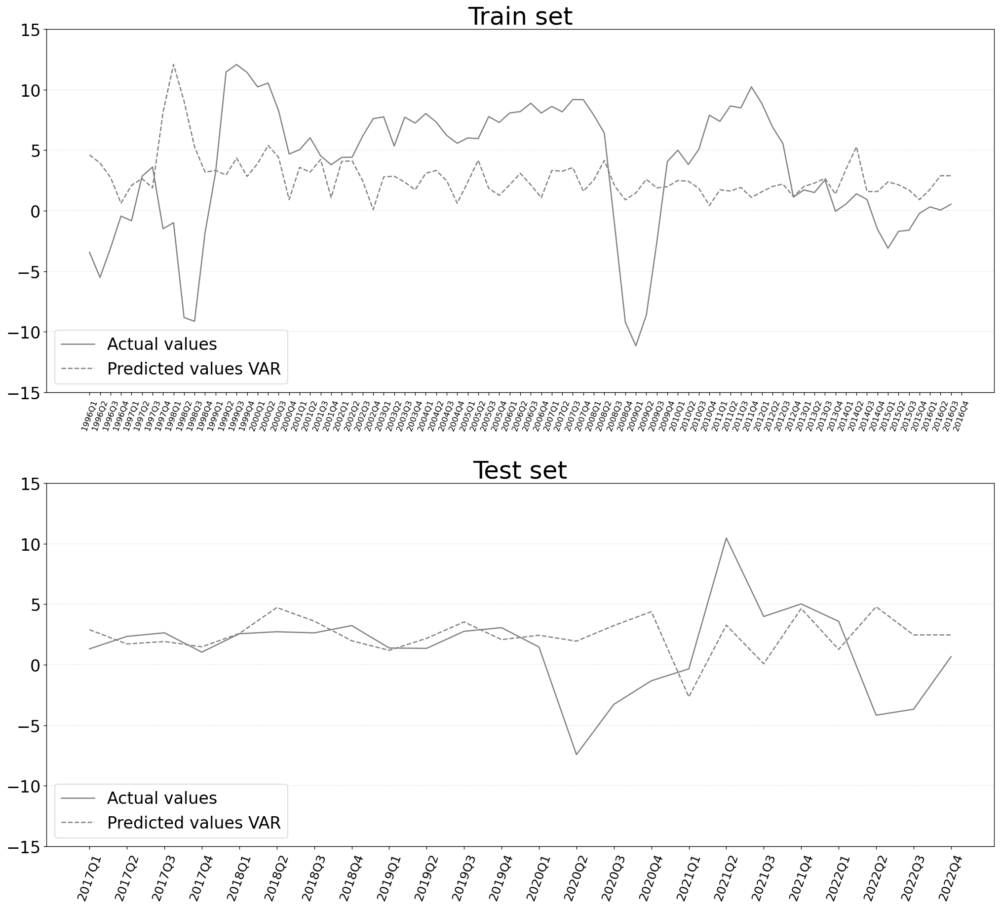

In [155]:
plt.figure(figsize=(8,15))

plt.subplot(211)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_train_actual[~np.isnan(GDP_train_actual)][1:], c='gray', linestyle='-', label='Actual values', linewidth=1.5)
plt.plot(var_train_preds, c='gray', linestyle='--', label='Predicted values VAR',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_train)), labels=dates_train, rotation=70, size=10)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Train set', size=30)

plt.subplot(212)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_test_actual[~np.isnan(GDP_test_actual)], c='gray', linestyle='-', label='Actual values',  linewidth=1.5)
plt.plot(var_test_preds, c='gray', linestyle='--', label='Predicted values VAR',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_test)), labels=dates_test, rotation=70, size=15)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Test set', size=30)

plt.subplots_adjust(top=1, bottom=0.08, left=0, right=2, hspace=0.25, wspace=0.35)

plt.show()

# SVM

In [156]:
parameters = {'C': [1, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2, 2.1, 2.2, 2.3, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9,
                    3, 4, 5, 6, 7, 8, 9, 10]}

svmr = svm.SVR(kernel='rbf')
grid_svr = GridSearchCV(svmr, parameters, scoring= 'neg_root_mean_squared_error', n_jobs=-1)
grid_svr.fit(x_train_lstm_nan,y_train_comp[~np.isnan(y_train_comp)])

GridSearchCV(estimator=SVR(), n_jobs=-1,
             param_grid={'C': [1, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9,
                               2, 2.1, 2.2, 2.3, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9,
                               3, 4, 5, 6, 7, 8, 9, 10]},
             scoring='neg_root_mean_squared_error')

In [157]:
grid_svr.best_params_

{'C': 2}

In [158]:
svr = svm.SVR(kernel='rbf', C=2).fit(x_train_lstm_nan,y_train_comp[~np.isnan(y_train_comp)])

In [159]:
svr_train_preds = svr.predict(x_train_lstm_nan) * Wx_lstm_comp + Mx_lstm_comp
svr_test_preds = svr.predict(x_test_lstm_nan) * Wx_lstm_comp + Mx_lstm_comp

In [160]:
np.sqrt(mean_squared_error(GDP_train_actual[~np.isnan(GDP_train_actual)], svr_train_preds))

0.4983819154116033

In [161]:
np.sqrt(mean_squared_error(GDP_test_actual[~np.isnan(GDP_test_actual)], svr_test_preds))

3.492915534534848

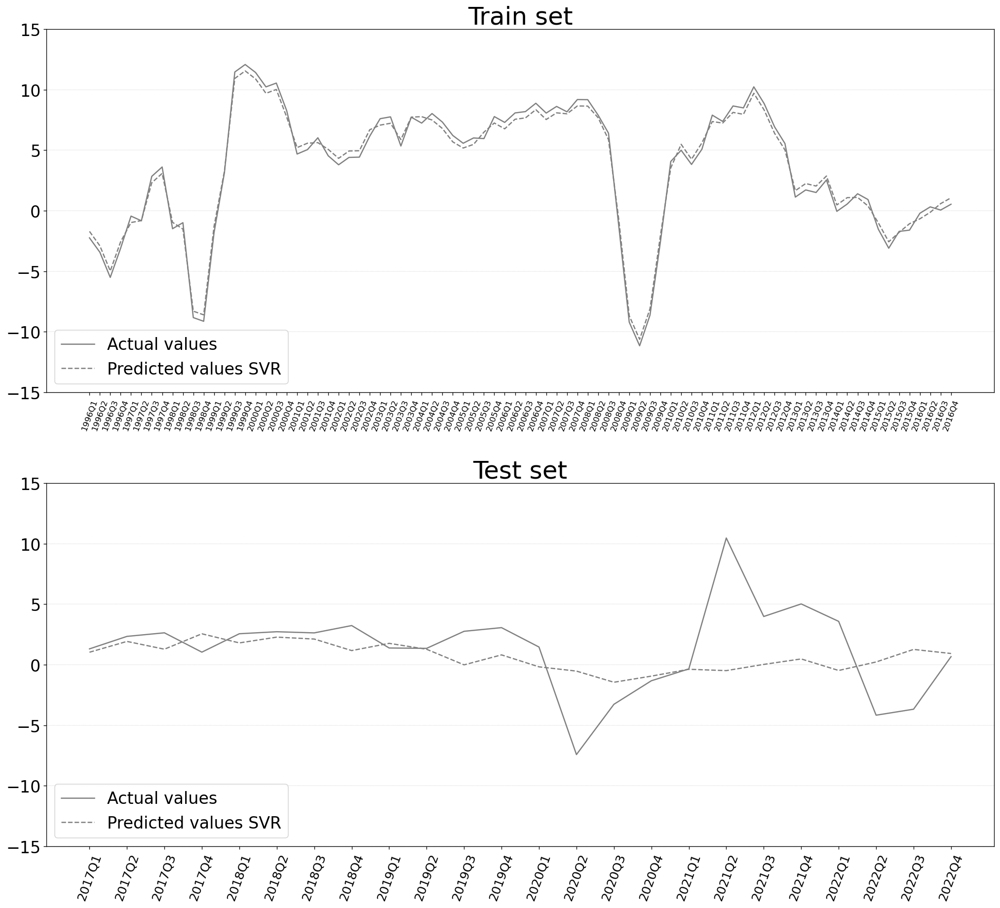

In [162]:
plt.figure(figsize=(8,15))

plt.subplot(211)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_train_actual[~np.isnan(GDP_train_actual)], c='gray', linestyle='-', label='Actual values', linewidth=1.5)
plt.plot(svr_train_preds, c='gray', linestyle='--', label='Predicted values SVR',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_train)), labels=dates_train, rotation=70, size=10)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Train set', size=30)

plt.subplot(212)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_test_actual[~np.isnan(GDP_test_actual)], c='gray', linestyle='-', label='Actual values',  linewidth=1.5)
plt.plot(svr_test_preds, c='gray', linestyle='--', label='Predicted values SVR',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_test)), labels=dates_test, rotation=70, size=15)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Test set', size=30)

plt.subplots_adjust(top=1, bottom=0.08, left=0, right=2, hspace=0.25, wspace=0.35)

plt.show()

# CatBoost

In [163]:
train_dataset = cb.Pool(x_train_lstm_nan,y_train_comp[~np.isnan(y_train_comp)])                                                      
test_dataset = cb.Pool(x_test_lstm_nan,y_test_lstm)

In [164]:
cat = cb.CatBoostRegressor(loss_function='RMSE', random_seed=11, depth=4, l2_leaf_reg=3)

grid = {'learning_rate': np.arange(0.01, 0.06, step=0.01)}
#         'depth': np.arange(4, 7, step=1),
#         'l2_leaf_reg': np.arange(1, 7, step=2)}

grid_search_result = cat.grid_search(grid, X=x_train_lstm_nan, y=y_train_comp[~np.isnan(y_train_comp)])

0:	learn: 1.0302619	test: 0.8142898	best: 0.8142898 (0)	total: 180ms	remaining: 3m
1:	learn: 1.0246587	test: 0.8109120	best: 0.8109120 (1)	total: 187ms	remaining: 1m 33s
2:	learn: 1.0198778	test: 0.8075205	best: 0.8075205 (2)	total: 193ms	remaining: 1m 4s
3:	learn: 1.0161010	test: 0.8058193	best: 0.8058193 (3)	total: 201ms	remaining: 50s
4:	learn: 1.0110400	test: 0.8032086	best: 0.8032086 (4)	total: 209ms	remaining: 41.5s
5:	learn: 1.0060671	test: 0.8021585	best: 0.8021585 (5)	total: 214ms	remaining: 35.5s
6:	learn: 1.0021095	test: 0.7986832	best: 0.7986832 (6)	total: 221ms	remaining: 31.3s
7:	learn: 0.9970129	test: 0.7946972	best: 0.7946972 (7)	total: 227ms	remaining: 28.2s
8:	learn: 0.9920137	test: 0.7921763	best: 0.7921763 (8)	total: 233ms	remaining: 25.7s
9:	learn: 0.9877245	test: 0.7899202	best: 0.7899202 (9)	total: 242ms	remaining: 24s
10:	learn: 0.9830769	test: 0.7873291	best: 0.7873291 (10)	total: 248ms	remaining: 22.3s
11:	learn: 0.9780477	test: 0.7838467	best: 0.7838467 (11)	

138:	learn: 0.5718202	test: 0.5990333	best: 0.5990333 (138)	total: 785ms	remaining: 4.86s
139:	learn: 0.5693756	test: 0.5983453	best: 0.5983453 (139)	total: 789ms	remaining: 4.85s
140:	learn: 0.5671292	test: 0.5982485	best: 0.5982485 (140)	total: 793ms	remaining: 4.83s
141:	learn: 0.5648578	test: 0.5969614	best: 0.5969614 (141)	total: 797ms	remaining: 4.82s
142:	learn: 0.5629460	test: 0.5960671	best: 0.5960671 (142)	total: 801ms	remaining: 4.8s
143:	learn: 0.5604502	test: 0.5942280	best: 0.5942280 (143)	total: 805ms	remaining: 4.78s
144:	learn: 0.5581684	test: 0.5930139	best: 0.5930139 (144)	total: 811ms	remaining: 4.78s
145:	learn: 0.5563263	test: 0.5926606	best: 0.5926606 (145)	total: 818ms	remaining: 4.78s
146:	learn: 0.5547595	test: 0.5919750	best: 0.5919750 (146)	total: 824ms	remaining: 4.78s
147:	learn: 0.5525801	test: 0.5907096	best: 0.5907096 (147)	total: 828ms	remaining: 4.77s
148:	learn: 0.5503186	test: 0.5900060	best: 0.5900060 (148)	total: 833ms	remaining: 4.76s
149:	learn:

272:	learn: 0.3640227	test: 0.5336664	best: 0.5336664 (272)	total: 1.38s	remaining: 3.68s
273:	learn: 0.3629430	test: 0.5334743	best: 0.5334743 (273)	total: 1.39s	remaining: 3.67s
274:	learn: 0.3617675	test: 0.5336535	best: 0.5334743 (273)	total: 1.39s	remaining: 3.67s
275:	learn: 0.3605536	test: 0.5330657	best: 0.5330657 (275)	total: 1.39s	remaining: 3.66s
276:	learn: 0.3594461	test: 0.5331590	best: 0.5330657 (275)	total: 1.4s	remaining: 3.65s
277:	learn: 0.3584039	test: 0.5325397	best: 0.5325397 (277)	total: 1.4s	remaining: 3.64s
278:	learn: 0.3572441	test: 0.5326992	best: 0.5325397 (277)	total: 1.41s	remaining: 3.64s
279:	learn: 0.3560819	test: 0.5317741	best: 0.5317741 (279)	total: 1.41s	remaining: 3.63s
280:	learn: 0.3548241	test: 0.5313695	best: 0.5313695 (280)	total: 1.41s	remaining: 3.62s
281:	learn: 0.3537195	test: 0.5308291	best: 0.5308291 (281)	total: 1.42s	remaining: 3.61s
282:	learn: 0.3524513	test: 0.5304653	best: 0.5304653 (282)	total: 1.42s	remaining: 3.61s
283:	learn: 

408:	learn: 0.2432435	test: 0.4977588	best: 0.4976419 (407)	total: 1.99s	remaining: 2.87s
409:	learn: 0.2425887	test: 0.4975411	best: 0.4975411 (409)	total: 1.99s	remaining: 2.87s
410:	learn: 0.2419301	test: 0.4972968	best: 0.4972968 (410)	total: 2s	remaining: 2.86s
411:	learn: 0.2413151	test: 0.4967459	best: 0.4967459 (411)	total: 2s	remaining: 2.85s
412:	learn: 0.2406589	test: 0.4962407	best: 0.4962407 (412)	total: 2s	remaining: 2.85s
413:	learn: 0.2400873	test: 0.4959649	best: 0.4959649 (413)	total: 2.01s	remaining: 2.84s
414:	learn: 0.2395582	test: 0.4957856	best: 0.4957856 (414)	total: 2.01s	remaining: 2.84s
415:	learn: 0.2388169	test: 0.4954510	best: 0.4954510 (415)	total: 2.02s	remaining: 2.83s
416:	learn: 0.2381851	test: 0.4948836	best: 0.4948836 (416)	total: 2.02s	remaining: 2.83s
417:	learn: 0.2374922	test: 0.4948153	best: 0.4948153 (417)	total: 2.03s	remaining: 2.82s
418:	learn: 0.2367968	test: 0.4945151	best: 0.4945151 (418)	total: 2.03s	remaining: 2.81s
419:	learn: 0.23610

501:	learn: 0.1855722	test: 0.4773622	best: 0.4773622 (501)	total: 2.4s	remaining: 2.38s
502:	learn: 0.1851047	test: 0.4772711	best: 0.4772711 (502)	total: 2.4s	remaining: 2.38s
503:	learn: 0.1845204	test: 0.4773641	best: 0.4772711 (502)	total: 2.41s	remaining: 2.37s
504:	learn: 0.1839308	test: 0.4770165	best: 0.4770165 (504)	total: 2.41s	remaining: 2.37s
505:	learn: 0.1834300	test: 0.4770137	best: 0.4770137 (505)	total: 2.42s	remaining: 2.36s
506:	learn: 0.1828688	test: 0.4772864	best: 0.4770137 (505)	total: 2.42s	remaining: 2.36s
507:	learn: 0.1824413	test: 0.4773407	best: 0.4770137 (505)	total: 2.43s	remaining: 2.35s
508:	learn: 0.1819691	test: 0.4771355	best: 0.4770137 (505)	total: 2.44s	remaining: 2.35s
509:	learn: 0.1814734	test: 0.4770635	best: 0.4770137 (505)	total: 2.45s	remaining: 2.35s
510:	learn: 0.1810563	test: 0.4770757	best: 0.4770137 (505)	total: 2.46s	remaining: 2.35s
511:	learn: 0.1803927	test: 0.4772359	best: 0.4770137 (505)	total: 2.46s	remaining: 2.35s
512:	learn: 

635:	learn: 0.1218015	test: 0.4558764	best: 0.4558757 (634)	total: 3.01s	remaining: 1.72s
636:	learn: 0.1213761	test: 0.4558002	best: 0.4558002 (636)	total: 3.02s	remaining: 1.72s
637:	learn: 0.1209824	test: 0.4558947	best: 0.4558002 (636)	total: 3.02s	remaining: 1.71s
638:	learn: 0.1205737	test: 0.4554161	best: 0.4554161 (638)	total: 3.02s	remaining: 1.71s
639:	learn: 0.1201260	test: 0.4554072	best: 0.4554072 (639)	total: 3.03s	remaining: 1.7s
640:	learn: 0.1196964	test: 0.4551210	best: 0.4551210 (640)	total: 3.03s	remaining: 1.7s
641:	learn: 0.1193977	test: 0.4549415	best: 0.4549415 (641)	total: 3.04s	remaining: 1.69s
642:	learn: 0.1191163	test: 0.4549423	best: 0.4549415 (641)	total: 3.04s	remaining: 1.69s
643:	learn: 0.1188672	test: 0.4548259	best: 0.4548259 (643)	total: 3.05s	remaining: 1.68s
644:	learn: 0.1185342	test: 0.4548288	best: 0.4548259 (643)	total: 3.05s	remaining: 1.68s
645:	learn: 0.1182583	test: 0.4547569	best: 0.4547569 (645)	total: 3.06s	remaining: 1.68s
646:	learn: 

730:	learn: 0.0920282	test: 0.4476298	best: 0.4476298 (730)	total: 3.41s	remaining: 1.25s
731:	learn: 0.0918383	test: 0.4475231	best: 0.4475231 (731)	total: 3.42s	remaining: 1.25s
732:	learn: 0.0915362	test: 0.4473025	best: 0.4473025 (732)	total: 3.42s	remaining: 1.25s
733:	learn: 0.0912354	test: 0.4471278	best: 0.4471278 (733)	total: 3.42s	remaining: 1.24s
734:	learn: 0.0909353	test: 0.4469238	best: 0.4469238 (734)	total: 3.43s	remaining: 1.24s
735:	learn: 0.0907307	test: 0.4469210	best: 0.4469210 (735)	total: 3.43s	remaining: 1.23s
736:	learn: 0.0904633	test: 0.4468554	best: 0.4468554 (736)	total: 3.44s	remaining: 1.23s
737:	learn: 0.0901967	test: 0.4468860	best: 0.4468554 (736)	total: 3.44s	remaining: 1.22s
738:	learn: 0.0898439	test: 0.4465971	best: 0.4465971 (738)	total: 3.45s	remaining: 1.22s
739:	learn: 0.0896346	test: 0.4464862	best: 0.4464862 (739)	total: 3.45s	remaining: 1.21s
740:	learn: 0.0894583	test: 0.4463480	best: 0.4463480 (740)	total: 3.46s	remaining: 1.21s
741:	learn

866:	learn: 0.0611418	test: 0.4395903	best: 0.4394790 (859)	total: 4s	remaining: 614ms
867:	learn: 0.0609391	test: 0.4394957	best: 0.4394790 (859)	total: 4.01s	remaining: 610ms
868:	learn: 0.0607654	test: 0.4393476	best: 0.4393476 (868)	total: 4.01s	remaining: 605ms
869:	learn: 0.0606038	test: 0.4392487	best: 0.4392487 (869)	total: 4.02s	remaining: 601ms
870:	learn: 0.0604323	test: 0.4391022	best: 0.4391022 (870)	total: 4.03s	remaining: 596ms
871:	learn: 0.0602029	test: 0.4390087	best: 0.4390087 (871)	total: 4.03s	remaining: 592ms
872:	learn: 0.0600314	test: 0.4388774	best: 0.4388774 (872)	total: 4.04s	remaining: 587ms
873:	learn: 0.0598729	test: 0.4387794	best: 0.4387794 (873)	total: 4.04s	remaining: 582ms
874:	learn: 0.0596470	test: 0.4386870	best: 0.4386870 (874)	total: 4.04s	remaining: 578ms
875:	learn: 0.0594806	test: 0.4385446	best: 0.4385446 (875)	total: 4.05s	remaining: 573ms
876:	learn: 0.0593036	test: 0.4386153	best: 0.4385446 (875)	total: 4.05s	remaining: 568ms
877:	learn: 0

0:	loss: 0.4337220	best: 0.4337220 (0)	total: 4.83s	remaining: 19.3s
0:	learn: 1.0262343	test: 0.8123963	best: 0.8123963 (0)	total: 4.07ms	remaining: 4.07s
1:	learn: 1.0150862	test: 0.8057109	best: 0.8057109 (1)	total: 7.29ms	remaining: 3.64s
2:	learn: 1.0056371	test: 0.7990320	best: 0.7990320 (2)	total: 10.6ms	remaining: 3.52s
3:	learn: 0.9982069	test: 0.7957232	best: 0.7957232 (3)	total: 14.4ms	remaining: 3.6s
4:	learn: 0.9883056	test: 0.7906379	best: 0.7906379 (4)	total: 18.6ms	remaining: 3.69s
5:	learn: 0.9786535	test: 0.7886402	best: 0.7886402 (5)	total: 24.1ms	remaining: 3.99s
6:	learn: 0.9710232	test: 0.7819359	best: 0.7819359 (6)	total: 29.2ms	remaining: 4.15s
7:	learn: 0.9612736	test: 0.7743746	best: 0.7743746 (7)	total: 33.8ms	remaining: 4.19s
8:	learn: 0.9517780	test: 0.7697527	best: 0.7697527 (8)	total: 37ms	remaining: 4.07s
9:	learn: 0.9436803	test: 0.7655145	best: 0.7655145 (9)	total: 40.3ms	remaining: 3.98s
10:	learn: 0.9349673	test: 0.7607900	best: 0.7607900 (10)	total:

107:	learn: 0.4419936	test: 0.5626441	best: 0.5626441 (107)	total: 408ms	remaining: 3.37s
108:	learn: 0.4388056	test: 0.5620024	best: 0.5620024 (108)	total: 412ms	remaining: 3.37s
109:	learn: 0.4359092	test: 0.5605997	best: 0.5605997 (109)	total: 416ms	remaining: 3.36s
110:	learn: 0.4337753	test: 0.5591983	best: 0.5591983 (110)	total: 420ms	remaining: 3.36s
111:	learn: 0.4311198	test: 0.5581366	best: 0.5581366 (111)	total: 423ms	remaining: 3.35s
112:	learn: 0.4276895	test: 0.5566182	best: 0.5566182 (112)	total: 427ms	remaining: 3.35s
113:	learn: 0.4261666	test: 0.5560513	best: 0.5560513 (113)	total: 431ms	remaining: 3.35s
114:	learn: 0.4236011	test: 0.5561175	best: 0.5560513 (113)	total: 440ms	remaining: 3.39s
115:	learn: 0.4204515	test: 0.5547423	best: 0.5547423 (115)	total: 445ms	remaining: 3.39s
116:	learn: 0.4178577	test: 0.5535263	best: 0.5535263 (116)	total: 450ms	remaining: 3.39s
117:	learn: 0.4150420	test: 0.5521475	best: 0.5521475 (117)	total: 454ms	remaining: 3.39s
118:	learn

208:	learn: 0.2395764	test: 0.4947796	best: 0.4947796 (208)	total: 811ms	remaining: 3.07s
209:	learn: 0.2383451	test: 0.4944375	best: 0.4944375 (209)	total: 815ms	remaining: 3.07s
210:	learn: 0.2371257	test: 0.4940963	best: 0.4940963 (210)	total: 819ms	remaining: 3.06s
211:	learn: 0.2356906	test: 0.4935001	best: 0.4935001 (211)	total: 823ms	remaining: 3.06s
212:	learn: 0.2338779	test: 0.4937901	best: 0.4935001 (211)	total: 826ms	remaining: 3.05s
213:	learn: 0.2324305	test: 0.4937933	best: 0.4935001 (211)	total: 830ms	remaining: 3.05s
214:	learn: 0.2308807	test: 0.4936897	best: 0.4935001 (211)	total: 833ms	remaining: 3.04s
215:	learn: 0.2295265	test: 0.4930804	best: 0.4930804 (215)	total: 838ms	remaining: 3.04s
216:	learn: 0.2280669	test: 0.4921715	best: 0.4921715 (216)	total: 843ms	remaining: 3.04s
217:	learn: 0.2268367	test: 0.4913292	best: 0.4913292 (217)	total: 847ms	remaining: 3.04s
218:	learn: 0.2254750	test: 0.4905180	best: 0.4905180 (218)	total: 852ms	remaining: 3.04s
219:	learn

313:	learn: 0.1234671	test: 0.4614276	best: 0.4613619 (312)	total: 1.23s	remaining: 2.69s
314:	learn: 0.1228403	test: 0.4610313	best: 0.4610313 (314)	total: 1.24s	remaining: 2.69s
315:	learn: 0.1220387	test: 0.4609052	best: 0.4609052 (315)	total: 1.24s	remaining: 2.69s
316:	learn: 0.1212433	test: 0.4602928	best: 0.4602928 (316)	total: 1.25s	remaining: 2.69s
317:	learn: 0.1204294	test: 0.4605655	best: 0.4602928 (316)	total: 1.25s	remaining: 2.69s
318:	learn: 0.1196003	test: 0.4606065	best: 0.4602928 (316)	total: 1.26s	remaining: 2.68s
319:	learn: 0.1189063	test: 0.4608061	best: 0.4602928 (316)	total: 1.26s	remaining: 2.68s
320:	learn: 0.1182685	test: 0.4604734	best: 0.4602928 (316)	total: 1.27s	remaining: 2.68s
321:	learn: 0.1173918	test: 0.4596926	best: 0.4596926 (321)	total: 1.27s	remaining: 2.67s
322:	learn: 0.1163207	test: 0.4590530	best: 0.4590530 (322)	total: 1.27s	remaining: 2.67s
323:	learn: 0.1155757	test: 0.4585613	best: 0.4585613 (323)	total: 1.28s	remaining: 2.67s
324:	learn

408:	learn: 0.0692155	test: 0.4517006	best: 0.4504019 (379)	total: 1.63s	remaining: 2.36s
409:	learn: 0.0688331	test: 0.4513816	best: 0.4504019 (379)	total: 1.64s	remaining: 2.35s
410:	learn: 0.0683662	test: 0.4511060	best: 0.4504019 (379)	total: 1.64s	remaining: 2.35s
411:	learn: 0.0680614	test: 0.4509857	best: 0.4504019 (379)	total: 1.64s	remaining: 2.35s
412:	learn: 0.0676055	test: 0.4506908	best: 0.4504019 (379)	total: 1.65s	remaining: 2.34s
413:	learn: 0.0672452	test: 0.4507996	best: 0.4504019 (379)	total: 1.65s	remaining: 2.34s
414:	learn: 0.0668780	test: 0.4504915	best: 0.4504019 (379)	total: 1.66s	remaining: 2.33s
415:	learn: 0.0664130	test: 0.4503914	best: 0.4503914 (415)	total: 1.66s	remaining: 2.33s
416:	learn: 0.0661237	test: 0.4503828	best: 0.4503828 (416)	total: 1.67s	remaining: 2.33s
417:	learn: 0.0658796	test: 0.4501845	best: 0.4501845 (417)	total: 1.67s	remaining: 2.32s
418:	learn: 0.0654771	test: 0.4498502	best: 0.4498502 (418)	total: 1.67s	remaining: 2.32s
419:	learn

539:	learn: 0.0317621	test: 0.4425764	best: 0.4424290 (538)	total: 2.26s	remaining: 1.93s
540:	learn: 0.0316709	test: 0.4425387	best: 0.4424290 (538)	total: 2.27s	remaining: 1.92s
541:	learn: 0.0314752	test: 0.4424735	best: 0.4424290 (538)	total: 2.27s	remaining: 1.92s
542:	learn: 0.0312828	test: 0.4423258	best: 0.4423258 (542)	total: 2.27s	remaining: 1.92s
543:	learn: 0.0311716	test: 0.4422562	best: 0.4422562 (543)	total: 2.28s	remaining: 1.91s
544:	learn: 0.0309460	test: 0.4422414	best: 0.4422414 (544)	total: 2.28s	remaining: 1.91s
545:	learn: 0.0307800	test: 0.4423277	best: 0.4422414 (544)	total: 2.29s	remaining: 1.9s
546:	learn: 0.0306176	test: 0.4423396	best: 0.4422414 (544)	total: 2.29s	remaining: 1.9s
547:	learn: 0.0305097	test: 0.4422538	best: 0.4422414 (544)	total: 2.3s	remaining: 1.9s
548:	learn: 0.0302673	test: 0.4422643	best: 0.4422414 (544)	total: 2.3s	remaining: 1.89s
549:	learn: 0.0301086	test: 0.4423360	best: 0.4422414 (544)	total: 2.31s	remaining: 1.89s
550:	learn: 0.0

639:	learn: 0.0177639	test: 0.4432217	best: 0.4422036 (553)	total: 2.66s	remaining: 1.49s
640:	learn: 0.0176316	test: 0.4432369	best: 0.4422036 (553)	total: 2.66s	remaining: 1.49s
641:	learn: 0.0175757	test: 0.4431994	best: 0.4422036 (553)	total: 2.67s	remaining: 1.49s
642:	learn: 0.0174938	test: 0.4431390	best: 0.4422036 (553)	total: 2.67s	remaining: 1.48s
643:	learn: 0.0173654	test: 0.4431512	best: 0.4422036 (553)	total: 2.67s	remaining: 1.48s
644:	learn: 0.0172963	test: 0.4431573	best: 0.4422036 (553)	total: 2.68s	remaining: 1.47s
645:	learn: 0.0171632	test: 0.4431350	best: 0.4422036 (553)	total: 2.68s	remaining: 1.47s
646:	learn: 0.0170955	test: 0.4431252	best: 0.4422036 (553)	total: 2.69s	remaining: 1.47s
647:	learn: 0.0169651	test: 0.4431032	best: 0.4422036 (553)	total: 2.69s	remaining: 1.46s
648:	learn: 0.0169076	test: 0.4431022	best: 0.4422036 (553)	total: 2.7s	remaining: 1.46s
649:	learn: 0.0168410	test: 0.4430976	best: 0.4422036 (553)	total: 2.7s	remaining: 1.46s
650:	learn: 

739:	learn: 0.0101035	test: 0.4428894	best: 0.4422036 (553)	total: 3.05s	remaining: 1.07s
740:	learn: 0.0100482	test: 0.4428772	best: 0.4422036 (553)	total: 3.06s	remaining: 1.07s
741:	learn: 0.0100093	test: 0.4428655	best: 0.4422036 (553)	total: 3.06s	remaining: 1.06s
742:	learn: 0.0099678	test: 0.4428553	best: 0.4422036 (553)	total: 3.07s	remaining: 1.06s
743:	learn: 0.0099322	test: 0.4428342	best: 0.4422036 (553)	total: 3.07s	remaining: 1.06s
744:	learn: 0.0098657	test: 0.4428719	best: 0.4422036 (553)	total: 3.08s	remaining: 1.05s
745:	learn: 0.0098059	test: 0.4428363	best: 0.4422036 (553)	total: 3.08s	remaining: 1.05s
746:	learn: 0.0097744	test: 0.4428290	best: 0.4422036 (553)	total: 3.09s	remaining: 1.04s
747:	learn: 0.0097130	test: 0.4427937	best: 0.4422036 (553)	total: 3.09s	remaining: 1.04s
748:	learn: 0.0096541	test: 0.4428101	best: 0.4422036 (553)	total: 3.1s	remaining: 1.04s
749:	learn: 0.0095964	test: 0.4428263	best: 0.4422036 (553)	total: 3.1s	remaining: 1.03s
750:	learn: 

834:	learn: 0.0059291	test: 0.4425732	best: 0.4422036 (553)	total: 3.46s	remaining: 683ms
835:	learn: 0.0059033	test: 0.4425596	best: 0.4422036 (553)	total: 3.46s	remaining: 679ms
836:	learn: 0.0058667	test: 0.4425653	best: 0.4422036 (553)	total: 3.47s	remaining: 675ms
837:	learn: 0.0058237	test: 0.4425663	best: 0.4422036 (553)	total: 3.47s	remaining: 671ms
838:	learn: 0.0057861	test: 0.4425322	best: 0.4422036 (553)	total: 3.48s	remaining: 667ms
839:	learn: 0.0057480	test: 0.4425314	best: 0.4422036 (553)	total: 3.48s	remaining: 663ms
840:	learn: 0.0057152	test: 0.4425367	best: 0.4422036 (553)	total: 3.48s	remaining: 659ms
841:	learn: 0.0056962	test: 0.4425269	best: 0.4422036 (553)	total: 3.49s	remaining: 655ms
842:	learn: 0.0056546	test: 0.4425312	best: 0.4422036 (553)	total: 3.5s	remaining: 651ms
843:	learn: 0.0056319	test: 0.4425227	best: 0.4422036 (553)	total: 3.5s	remaining: 647ms
844:	learn: 0.0056135	test: 0.4425131	best: 0.4422036 (553)	total: 3.5s	remaining: 643ms
845:	learn: 0

975:	learn: 0.0028612	test: 0.4422561	best: 0.4421508 (910)	total: 4.06s	remaining: 99.9ms
976:	learn: 0.0028434	test: 0.4422596	best: 0.4421508 (910)	total: 4.07s	remaining: 95.7ms
977:	learn: 0.0028213	test: 0.4422576	best: 0.4421508 (910)	total: 4.07s	remaining: 91.6ms
978:	learn: 0.0028038	test: 0.4422516	best: 0.4421508 (910)	total: 4.07s	remaining: 87.4ms
979:	learn: 0.0027908	test: 0.4422576	best: 0.4421508 (910)	total: 4.08s	remaining: 83.3ms
980:	learn: 0.0027764	test: 0.4422523	best: 0.4421508 (910)	total: 4.08s	remaining: 79.1ms
981:	learn: 0.0027667	test: 0.4422530	best: 0.4421508 (910)	total: 4.09s	remaining: 74.9ms
982:	learn: 0.0027499	test: 0.4422473	best: 0.4421508 (910)	total: 4.09s	remaining: 70.8ms
983:	learn: 0.0027413	test: 0.4422496	best: 0.4421508 (910)	total: 4.1s	remaining: 66.6ms
984:	learn: 0.0027268	test: 0.4422551	best: 0.4421508 (910)	total: 4.1s	remaining: 62.4ms
985:	learn: 0.0027093	test: 0.4422564	best: 0.4421508 (910)	total: 4.1s	remaining: 58.3ms
98

76:	learn: 0.4114219	test: 0.5482779	best: 0.5482779 (76)	total: 312ms	remaining: 3.74s
77:	learn: 0.4075098	test: 0.5477543	best: 0.5477543 (77)	total: 317ms	remaining: 3.74s
78:	learn: 0.4020893	test: 0.5473531	best: 0.5473531 (78)	total: 321ms	remaining: 3.74s
79:	learn: 0.3989697	test: 0.5468010	best: 0.5468010 (79)	total: 325ms	remaining: 3.74s
80:	learn: 0.3945468	test: 0.5465293	best: 0.5465293 (80)	total: 330ms	remaining: 3.74s
81:	learn: 0.3915615	test: 0.5467094	best: 0.5465293 (80)	total: 335ms	remaining: 3.75s
82:	learn: 0.3882263	test: 0.5459230	best: 0.5459230 (82)	total: 340ms	remaining: 3.76s
83:	learn: 0.3845155	test: 0.5449764	best: 0.5449764 (83)	total: 344ms	remaining: 3.76s
84:	learn: 0.3799875	test: 0.5435131	best: 0.5435131 (84)	total: 348ms	remaining: 3.75s
85:	learn: 0.3760671	test: 0.5413970	best: 0.5413970 (85)	total: 352ms	remaining: 3.74s
86:	learn: 0.3724505	test: 0.5397730	best: 0.5397730 (86)	total: 355ms	remaining: 3.72s
87:	learn: 0.3695991	test: 0.539

177:	learn: 0.1648153	test: 0.4773700	best: 0.4773700 (177)	total: 718ms	remaining: 3.31s
178:	learn: 0.1636033	test: 0.4767161	best: 0.4767161 (178)	total: 722ms	remaining: 3.31s
179:	learn: 0.1618783	test: 0.4758482	best: 0.4758482 (179)	total: 727ms	remaining: 3.31s
180:	learn: 0.1600148	test: 0.4762914	best: 0.4758482 (179)	total: 731ms	remaining: 3.31s
181:	learn: 0.1583733	test: 0.4754150	best: 0.4754150 (181)	total: 736ms	remaining: 3.31s
182:	learn: 0.1565040	test: 0.4738514	best: 0.4738514 (182)	total: 740ms	remaining: 3.3s
183:	learn: 0.1548406	test: 0.4736749	best: 0.4736749 (183)	total: 745ms	remaining: 3.3s
184:	learn: 0.1529805	test: 0.4734479	best: 0.4734479 (184)	total: 749ms	remaining: 3.3s
185:	learn: 0.1514514	test: 0.4730405	best: 0.4730405 (185)	total: 754ms	remaining: 3.3s
186:	learn: 0.1501970	test: 0.4726477	best: 0.4726477 (186)	total: 758ms	remaining: 3.29s
187:	learn: 0.1487150	test: 0.4725786	best: 0.4725786 (187)	total: 762ms	remaining: 3.29s
188:	learn: 0.

275:	learn: 0.0669497	test: 0.4542781	best: 0.4542781 (275)	total: 1.11s	remaining: 2.92s
276:	learn: 0.0662754	test: 0.4544113	best: 0.4542781 (275)	total: 1.12s	remaining: 2.92s
277:	learn: 0.0656129	test: 0.4541054	best: 0.4541054 (277)	total: 1.12s	remaining: 2.91s
278:	learn: 0.0650508	test: 0.4538207	best: 0.4538207 (278)	total: 1.12s	remaining: 2.9s
279:	learn: 0.0643975	test: 0.4539955	best: 0.4538207 (278)	total: 1.13s	remaining: 2.9s
280:	learn: 0.0636179	test: 0.4540292	best: 0.4538207 (278)	total: 1.13s	remaining: 2.9s
281:	learn: 0.0630239	test: 0.4536303	best: 0.4536303 (281)	total: 1.14s	remaining: 2.9s
282:	learn: 0.0623524	test: 0.4536300	best: 0.4536300 (282)	total: 1.14s	remaining: 2.89s
283:	learn: 0.0619586	test: 0.4534887	best: 0.4534887 (283)	total: 1.15s	remaining: 2.89s
284:	learn: 0.0612689	test: 0.4529515	best: 0.4529515 (284)	total: 1.15s	remaining: 2.88s
285:	learn: 0.0606003	test: 0.4525576	best: 0.4525576 (285)	total: 1.15s	remaining: 2.88s
286:	learn: 0.

370:	learn: 0.0290993	test: 0.4463254	best: 0.4463254 (370)	total: 1.52s	remaining: 2.57s
371:	learn: 0.0287955	test: 0.4463467	best: 0.4463254 (370)	total: 1.52s	remaining: 2.57s
372:	learn: 0.0285578	test: 0.4463557	best: 0.4463254 (370)	total: 1.53s	remaining: 2.57s
373:	learn: 0.0284189	test: 0.4462379	best: 0.4462379 (373)	total: 1.53s	remaining: 2.57s
374:	learn: 0.0281841	test: 0.4461719	best: 0.4461719 (374)	total: 1.54s	remaining: 2.57s
375:	learn: 0.0278863	test: 0.4462303	best: 0.4461719 (374)	total: 1.55s	remaining: 2.57s
376:	learn: 0.0277533	test: 0.4461368	best: 0.4461368 (376)	total: 1.56s	remaining: 2.57s
377:	learn: 0.0274794	test: 0.4459117	best: 0.4459117 (377)	total: 1.56s	remaining: 2.57s
378:	learn: 0.0271793	test: 0.4457433	best: 0.4457433 (378)	total: 1.57s	remaining: 2.57s
379:	learn: 0.0269382	test: 0.4456768	best: 0.4456768 (379)	total: 1.57s	remaining: 2.57s
380:	learn: 0.0265817	test: 0.4456503	best: 0.4456503 (380)	total: 1.58s	remaining: 2.57s
381:	learn

486:	learn: 0.0109148	test: 0.4430278	best: 0.4430197 (485)	total: 2.11s	remaining: 2.22s
487:	learn: 0.0108051	test: 0.4430386	best: 0.4430197 (485)	total: 2.12s	remaining: 2.22s
488:	learn: 0.0107217	test: 0.4430182	best: 0.4430182 (488)	total: 2.12s	remaining: 2.21s
489:	learn: 0.0106489	test: 0.4429637	best: 0.4429637 (489)	total: 2.12s	remaining: 2.21s
490:	learn: 0.0105626	test: 0.4429783	best: 0.4429637 (489)	total: 2.13s	remaining: 2.21s
491:	learn: 0.0104801	test: 0.4429960	best: 0.4429637 (489)	total: 2.13s	remaining: 2.2s
492:	learn: 0.0104108	test: 0.4429440	best: 0.4429440 (492)	total: 2.14s	remaining: 2.2s
493:	learn: 0.0103174	test: 0.4429235	best: 0.4429235 (493)	total: 2.15s	remaining: 2.2s
494:	learn: 0.0102121	test: 0.4429332	best: 0.4429235 (493)	total: 2.15s	remaining: 2.2s
495:	learn: 0.0101410	test: 0.4429101	best: 0.4429101 (495)	total: 2.16s	remaining: 2.19s
496:	learn: 0.0100369	test: 0.4428967	best: 0.4428967 (496)	total: 2.16s	remaining: 2.19s
497:	learn: 0.

624:	learn: 0.0033649	test: 0.4423843	best: 0.4423836 (620)	total: 2.71s	remaining: 1.63s
625:	learn: 0.0033349	test: 0.4423804	best: 0.4423804 (625)	total: 2.72s	remaining: 1.62s
626:	learn: 0.0033019	test: 0.4423763	best: 0.4423763 (626)	total: 2.72s	remaining: 1.62s
627:	learn: 0.0032698	test: 0.4423723	best: 0.4423723 (627)	total: 2.72s	remaining: 1.61s
628:	learn: 0.0032484	test: 0.4423739	best: 0.4423723 (627)	total: 2.73s	remaining: 1.61s
629:	learn: 0.0032267	test: 0.4423613	best: 0.4423613 (629)	total: 2.73s	remaining: 1.6s
630:	learn: 0.0032016	test: 0.4423604	best: 0.4423604 (630)	total: 2.74s	remaining: 1.6s
631:	learn: 0.0031682	test: 0.4423666	best: 0.4423604 (630)	total: 2.74s	remaining: 1.6s
632:	learn: 0.0031525	test: 0.4423587	best: 0.4423587 (632)	total: 2.75s	remaining: 1.59s
633:	learn: 0.0031332	test: 0.4423420	best: 0.4423420 (633)	total: 2.75s	remaining: 1.59s
634:	learn: 0.0031127	test: 0.4423300	best: 0.4423300 (634)	total: 2.77s	remaining: 1.59s
635:	learn: 0

718:	learn: 0.0017187	test: 0.4420936	best: 0.4420845 (717)	total: 3.13s	remaining: 1.22s
719:	learn: 0.0016997	test: 0.4420959	best: 0.4420845 (717)	total: 3.14s	remaining: 1.22s
720:	learn: 0.0016929	test: 0.4420928	best: 0.4420845 (717)	total: 3.14s	remaining: 1.22s
721:	learn: 0.0016744	test: 0.4420929	best: 0.4420845 (717)	total: 3.15s	remaining: 1.21s
722:	learn: 0.0016569	test: 0.4420982	best: 0.4420845 (717)	total: 3.15s	remaining: 1.21s
723:	learn: 0.0016522	test: 0.4420982	best: 0.4420845 (717)	total: 3.15s	remaining: 1.2s
724:	learn: 0.0016369	test: 0.4420957	best: 0.4420845 (717)	total: 3.16s	remaining: 1.2s
725:	learn: 0.0016192	test: 0.4420949	best: 0.4420845 (717)	total: 3.16s	remaining: 1.19s
726:	learn: 0.0016022	test: 0.4420962	best: 0.4420845 (717)	total: 3.17s	remaining: 1.19s
727:	learn: 0.0015964	test: 0.4420978	best: 0.4420845 (717)	total: 3.17s	remaining: 1.19s
728:	learn: 0.0015812	test: 0.4420994	best: 0.4420845 (717)	total: 3.17s	remaining: 1.18s
729:	learn: 

834:	learn: 0.0006286	test: 0.4420981	best: 0.4420845 (717)	total: 3.73s	remaining: 738ms
835:	learn: 0.0006224	test: 0.4420988	best: 0.4420845 (717)	total: 3.74s	remaining: 733ms
836:	learn: 0.0006184	test: 0.4420983	best: 0.4420845 (717)	total: 3.74s	remaining: 729ms
837:	learn: 0.0006109	test: 0.4420999	best: 0.4420845 (717)	total: 3.75s	remaining: 724ms
838:	learn: 0.0006036	test: 0.4421018	best: 0.4420845 (717)	total: 3.75s	remaining: 720ms
839:	learn: 0.0005978	test: 0.4421036	best: 0.4420845 (717)	total: 3.75s	remaining: 715ms
840:	learn: 0.0005954	test: 0.4421019	best: 0.4420845 (717)	total: 3.76s	remaining: 711ms
841:	learn: 0.0005900	test: 0.4421016	best: 0.4420845 (717)	total: 3.76s	remaining: 706ms
842:	learn: 0.0005848	test: 0.4421072	best: 0.4420845 (717)	total: 3.77s	remaining: 702ms
843:	learn: 0.0005779	test: 0.4421095	best: 0.4420845 (717)	total: 3.77s	remaining: 697ms
844:	learn: 0.0005759	test: 0.4421078	best: 0.4420845 (717)	total: 3.78s	remaining: 693ms
845:	learn

969:	learn: 0.0002028	test: 0.4420816	best: 0.4420811 (966)	total: 4.36s	remaining: 135ms
970:	learn: 0.0002011	test: 0.4420818	best: 0.4420811 (966)	total: 4.36s	remaining: 130ms
971:	learn: 0.0001990	test: 0.4420820	best: 0.4420811 (966)	total: 4.37s	remaining: 126ms
972:	learn: 0.0001980	test: 0.4420820	best: 0.4420811 (966)	total: 4.37s	remaining: 121ms
973:	learn: 0.0001970	test: 0.4420819	best: 0.4420811 (966)	total: 4.38s	remaining: 117ms
974:	learn: 0.0001958	test: 0.4420818	best: 0.4420811 (966)	total: 4.38s	remaining: 112ms
975:	learn: 0.0001952	test: 0.4420818	best: 0.4420811 (966)	total: 4.38s	remaining: 108ms
976:	learn: 0.0001942	test: 0.4420814	best: 0.4420811 (966)	total: 4.39s	remaining: 103ms
977:	learn: 0.0001930	test: 0.4420814	best: 0.4420811 (966)	total: 4.39s	remaining: 98.9ms
978:	learn: 0.0001919	test: 0.4420813	best: 0.4420811 (966)	total: 4.4s	remaining: 94.4ms
979:	learn: 0.0001909	test: 0.4420809	best: 0.4420809 (979)	total: 4.41s	remaining: 90.1ms
980:	lea

62:	learn: 0.3907700	test: 0.5401447	best: 0.5401447 (62)	total: 259ms	remaining: 3.85s
63:	learn: 0.3866286	test: 0.5411605	best: 0.5401447 (62)	total: 263ms	remaining: 3.85s
64:	learn: 0.3810984	test: 0.5389236	best: 0.5389236 (64)	total: 268ms	remaining: 3.85s
65:	learn: 0.3768856	test: 0.5373398	best: 0.5373398 (65)	total: 271ms	remaining: 3.84s
66:	learn: 0.3709048	test: 0.5351237	best: 0.5351237 (66)	total: 277ms	remaining: 3.86s
67:	learn: 0.3650250	test: 0.5333629	best: 0.5333629 (67)	total: 281ms	remaining: 3.85s
68:	learn: 0.3596572	test: 0.5317390	best: 0.5317390 (68)	total: 285ms	remaining: 3.84s
69:	learn: 0.3544386	test: 0.5310537	best: 0.5310537 (69)	total: 289ms	remaining: 3.83s
70:	learn: 0.3492968	test: 0.5289067	best: 0.5289067 (70)	total: 293ms	remaining: 3.84s
71:	learn: 0.3445071	test: 0.5261773	best: 0.5261773 (71)	total: 298ms	remaining: 3.84s
72:	learn: 0.3397188	test: 0.5241968	best: 0.5241968 (72)	total: 302ms	remaining: 3.84s
73:	learn: 0.3355020	test: 0.522

162:	learn: 0.1156408	test: 0.4613596	best: 0.4613596 (162)	total: 654ms	remaining: 3.36s
163:	learn: 0.1142906	test: 0.4611506	best: 0.4611506 (163)	total: 660ms	remaining: 3.36s
164:	learn: 0.1132835	test: 0.4607213	best: 0.4607213 (164)	total: 665ms	remaining: 3.36s
165:	learn: 0.1118167	test: 0.4606850	best: 0.4606850 (165)	total: 670ms	remaining: 3.36s
166:	learn: 0.1108805	test: 0.4602198	best: 0.4602198 (166)	total: 674ms	remaining: 3.36s
167:	learn: 0.1098758	test: 0.4595608	best: 0.4595608 (167)	total: 680ms	remaining: 3.37s
168:	learn: 0.1089691	test: 0.4594099	best: 0.4594099 (168)	total: 684ms	remaining: 3.36s
169:	learn: 0.1074525	test: 0.4596611	best: 0.4594099 (168)	total: 689ms	remaining: 3.36s
170:	learn: 0.1066964	test: 0.4591459	best: 0.4591459 (170)	total: 692ms	remaining: 3.36s
171:	learn: 0.1053714	test: 0.4590908	best: 0.4590908 (171)	total: 697ms	remaining: 3.35s
172:	learn: 0.1039910	test: 0.4587144	best: 0.4587144 (172)	total: 701ms	remaining: 3.35s
173:	learn

256:	learn: 0.0392959	test: 0.4454748	best: 0.4451417 (238)	total: 1.08s	remaining: 3.12s
257:	learn: 0.0387954	test: 0.4458229	best: 0.4451417 (238)	total: 1.08s	remaining: 3.12s
258:	learn: 0.0382737	test: 0.4460788	best: 0.4451417 (238)	total: 1.09s	remaining: 3.11s
259:	learn: 0.0377566	test: 0.4460349	best: 0.4451417 (238)	total: 1.09s	remaining: 3.11s
260:	learn: 0.0372122	test: 0.4460495	best: 0.4451417 (238)	total: 1.1s	remaining: 3.11s
261:	learn: 0.0367744	test: 0.4461563	best: 0.4451417 (238)	total: 1.1s	remaining: 3.1s
262:	learn: 0.0362578	test: 0.4463866	best: 0.4451417 (238)	total: 1.11s	remaining: 3.1s
263:	learn: 0.0358837	test: 0.4461511	best: 0.4451417 (238)	total: 1.11s	remaining: 3.1s
264:	learn: 0.0353857	test: 0.4457781	best: 0.4451417 (238)	total: 1.11s	remaining: 3.09s
265:	learn: 0.0349129	test: 0.4459588	best: 0.4451417 (238)	total: 1.12s	remaining: 3.09s
266:	learn: 0.0344673	test: 0.4461642	best: 0.4451417 (238)	total: 1.12s	remaining: 3.08s
267:	learn: 0.0

353:	learn: 0.0120330	test: 0.4432113	best: 0.4430745 (347)	total: 1.48s	remaining: 2.7s
354:	learn: 0.0118562	test: 0.4432547	best: 0.4430745 (347)	total: 1.49s	remaining: 2.7s
355:	learn: 0.0117663	test: 0.4431972	best: 0.4430745 (347)	total: 1.49s	remaining: 2.7s
356:	learn: 0.0116460	test: 0.4431499	best: 0.4430745 (347)	total: 1.49s	remaining: 2.69s
357:	learn: 0.0115397	test: 0.4431615	best: 0.4430745 (347)	total: 1.5s	remaining: 2.69s
358:	learn: 0.0114365	test: 0.4431210	best: 0.4430745 (347)	total: 1.5s	remaining: 2.68s
359:	learn: 0.0113248	test: 0.4431280	best: 0.4430745 (347)	total: 1.51s	remaining: 2.68s
360:	learn: 0.0111601	test: 0.4431686	best: 0.4430745 (347)	total: 1.51s	remaining: 2.68s
361:	learn: 0.0110288	test: 0.4432632	best: 0.4430745 (347)	total: 1.51s	remaining: 2.67s
362:	learn: 0.0109097	test: 0.4431653	best: 0.4430745 (347)	total: 1.52s	remaining: 2.67s
363:	learn: 0.0107756	test: 0.4432357	best: 0.4430745 (347)	total: 1.52s	remaining: 2.66s
364:	learn: 0.0

458:	learn: 0.0044240	test: 0.4432692	best: 0.4430745 (347)	total: 1.88s	remaining: 2.21s
459:	learn: 0.0044101	test: 0.4432688	best: 0.4430745 (347)	total: 1.88s	remaining: 2.21s
460:	learn: 0.0043459	test: 0.4432564	best: 0.4430745 (347)	total: 1.89s	remaining: 2.21s
461:	learn: 0.0042939	test: 0.4432818	best: 0.4430745 (347)	total: 1.89s	remaining: 2.2s
462:	learn: 0.0042417	test: 0.4432891	best: 0.4430745 (347)	total: 1.9s	remaining: 2.2s
463:	learn: 0.0042323	test: 0.4432827	best: 0.4430745 (347)	total: 1.9s	remaining: 2.2s
464:	learn: 0.0041817	test: 0.4432335	best: 0.4430745 (347)	total: 1.91s	remaining: 2.19s
465:	learn: 0.0041169	test: 0.4432332	best: 0.4430745 (347)	total: 1.91s	remaining: 2.19s
466:	learn: 0.0040680	test: 0.4432402	best: 0.4430745 (347)	total: 1.92s	remaining: 2.19s
467:	learn: 0.0040519	test: 0.4432398	best: 0.4430745 (347)	total: 1.92s	remaining: 2.18s
468:	learn: 0.0040430	test: 0.4432396	best: 0.4430745 (347)	total: 1.92s	remaining: 2.18s
469:	learn: 0.0

596:	learn: 0.0009727	test: 0.4428997	best: 0.4428997 (596)	total: 2.48s	remaining: 1.67s
597:	learn: 0.0009605	test: 0.4428980	best: 0.4428980 (597)	total: 2.48s	remaining: 1.67s
598:	learn: 0.0009471	test: 0.4428933	best: 0.4428933 (598)	total: 2.48s	remaining: 1.66s
599:	learn: 0.0009383	test: 0.4428904	best: 0.4428904 (599)	total: 2.49s	remaining: 1.66s
600:	learn: 0.0009293	test: 0.4428895	best: 0.4428895 (600)	total: 2.49s	remaining: 1.65s
601:	learn: 0.0009209	test: 0.4428866	best: 0.4428866 (601)	total: 2.5s	remaining: 1.65s
602:	learn: 0.0009125	test: 0.4428886	best: 0.4428866 (601)	total: 2.5s	remaining: 1.65s
603:	learn: 0.0009014	test: 0.4428827	best: 0.4428827 (603)	total: 2.5s	remaining: 1.64s
604:	learn: 0.0008935	test: 0.4428800	best: 0.4428800 (604)	total: 2.51s	remaining: 1.64s
605:	learn: 0.0008816	test: 0.4428753	best: 0.4428753 (605)	total: 2.51s	remaining: 1.63s
606:	learn: 0.0008741	test: 0.4428727	best: 0.4428727 (606)	total: 2.52s	remaining: 1.63s
607:	learn: 0

689:	learn: 0.0003717	test: 0.4428684	best: 0.4428534 (616)	total: 2.87s	remaining: 1.29s
690:	learn: 0.0003698	test: 0.4428683	best: 0.4428534 (616)	total: 2.87s	remaining: 1.28s
691:	learn: 0.0003651	test: 0.4428690	best: 0.4428534 (616)	total: 2.88s	remaining: 1.28s
692:	learn: 0.0003613	test: 0.4428683	best: 0.4428534 (616)	total: 2.88s	remaining: 1.28s
693:	learn: 0.0003574	test: 0.4428698	best: 0.4428534 (616)	total: 2.88s	remaining: 1.27s
694:	learn: 0.0003538	test: 0.4428713	best: 0.4428534 (616)	total: 2.89s	remaining: 1.27s
695:	learn: 0.0003484	test: 0.4428689	best: 0.4428534 (616)	total: 2.89s	remaining: 1.26s
696:	learn: 0.0003433	test: 0.4428666	best: 0.4428534 (616)	total: 2.9s	remaining: 1.26s
697:	learn: 0.0003401	test: 0.4428662	best: 0.4428534 (616)	total: 2.9s	remaining: 1.25s
698:	learn: 0.0003352	test: 0.4428632	best: 0.4428534 (616)	total: 2.9s	remaining: 1.25s
699:	learn: 0.0003313	test: 0.4428610	best: 0.4428534 (616)	total: 2.91s	remaining: 1.25s
700:	learn: 0

786:	learn: 0.0001371	test: 0.4428382	best: 0.4428381 (785)	total: 3.27s	remaining: 885ms
787:	learn: 0.0001355	test: 0.4428382	best: 0.4428381 (785)	total: 3.27s	remaining: 881ms
788:	learn: 0.0001337	test: 0.4428387	best: 0.4428381 (785)	total: 3.28s	remaining: 877ms
789:	learn: 0.0001332	test: 0.4428390	best: 0.4428381 (785)	total: 3.28s	remaining: 873ms
790:	learn: 0.0001326	test: 0.4428391	best: 0.4428381 (785)	total: 3.29s	remaining: 869ms
791:	learn: 0.0001309	test: 0.4428388	best: 0.4428381 (785)	total: 3.29s	remaining: 865ms
792:	learn: 0.0001304	test: 0.4428386	best: 0.4428381 (785)	total: 3.3s	remaining: 861ms
793:	learn: 0.0001290	test: 0.4428393	best: 0.4428381 (785)	total: 3.3s	remaining: 857ms
794:	learn: 0.0001273	test: 0.4428396	best: 0.4428381 (785)	total: 3.31s	remaining: 853ms
795:	learn: 0.0001259	test: 0.4428397	best: 0.4428381 (785)	total: 3.31s	remaining: 849ms
796:	learn: 0.0001243	test: 0.4428392	best: 0.4428381 (785)	total: 3.32s	remaining: 845ms
797:	learn: 

923:	learn: 0.0000434	test: 0.4428287	best: 0.4428284 (922)	total: 3.89s	remaining: 320ms
924:	learn: 0.0000429	test: 0.4428288	best: 0.4428284 (922)	total: 3.89s	remaining: 315ms
925:	learn: 0.0000428	test: 0.4428288	best: 0.4428284 (922)	total: 3.89s	remaining: 311ms
926:	learn: 0.0000426	test: 0.4428288	best: 0.4428284 (922)	total: 3.9s	remaining: 307ms
927:	learn: 0.0000421	test: 0.4428287	best: 0.4428284 (922)	total: 3.9s	remaining: 303ms
928:	learn: 0.0000416	test: 0.4428287	best: 0.4428284 (922)	total: 3.91s	remaining: 299ms
929:	learn: 0.0000410	test: 0.4428288	best: 0.4428284 (922)	total: 3.91s	remaining: 294ms
930:	learn: 0.0000405	test: 0.4428289	best: 0.4428284 (922)	total: 3.92s	remaining: 290ms
931:	learn: 0.0000400	test: 0.4428289	best: 0.4428284 (922)	total: 3.92s	remaining: 286ms
932:	learn: 0.0000396	test: 0.4428290	best: 0.4428284 (922)	total: 3.92s	remaining: 282ms
933:	learn: 0.0000392	test: 0.4428288	best: 0.4428284 (922)	total: 3.93s	remaining: 278ms
934:	learn: 

17:	learn: 0.6902380	test: 0.6684545	best: 0.6679469 (15)	total: 67.3ms	remaining: 3.67s
18:	learn: 0.6768274	test: 0.6635441	best: 0.6635441 (18)	total: 72.5ms	remaining: 3.74s
19:	learn: 0.6605150	test: 0.6585074	best: 0.6585074 (19)	total: 77.2ms	remaining: 3.78s
20:	learn: 0.6466096	test: 0.6494273	best: 0.6494273 (20)	total: 81.6ms	remaining: 3.8s
21:	learn: 0.6343428	test: 0.6436214	best: 0.6436214 (21)	total: 86.3ms	remaining: 3.84s
22:	learn: 0.6214361	test: 0.6348431	best: 0.6348431 (22)	total: 90.7ms	remaining: 3.85s
23:	learn: 0.6089256	test: 0.6299709	best: 0.6299709 (23)	total: 95.5ms	remaining: 3.88s
24:	learn: 0.5949855	test: 0.6247862	best: 0.6247862 (24)	total: 100ms	remaining: 3.9s
25:	learn: 0.5831160	test: 0.6156193	best: 0.6156193 (25)	total: 105ms	remaining: 3.94s
26:	learn: 0.5711416	test: 0.6103271	best: 0.6103271 (26)	total: 110ms	remaining: 3.95s
27:	learn: 0.5598954	test: 0.6036595	best: 0.6036595 (27)	total: 114ms	remaining: 3.95s
28:	learn: 0.5494890	test: 

140:	learn: 0.0999566	test: 0.4667884	best: 0.4663485 (136)	total: 650ms	remaining: 3.96s
141:	learn: 0.0981917	test: 0.4664521	best: 0.4663485 (136)	total: 655ms	remaining: 3.96s
142:	learn: 0.0963187	test: 0.4663768	best: 0.4663485 (136)	total: 660ms	remaining: 3.95s
143:	learn: 0.0947344	test: 0.4666052	best: 0.4663485 (136)	total: 664ms	remaining: 3.95s
144:	learn: 0.0932491	test: 0.4670174	best: 0.4663485 (136)	total: 668ms	remaining: 3.94s
145:	learn: 0.0919901	test: 0.4668514	best: 0.4663485 (136)	total: 672ms	remaining: 3.93s
146:	learn: 0.0910001	test: 0.4663434	best: 0.4663434 (146)	total: 677ms	remaining: 3.93s
147:	learn: 0.0899157	test: 0.4658560	best: 0.4658560 (147)	total: 682ms	remaining: 3.92s
148:	learn: 0.0883888	test: 0.4651537	best: 0.4651537 (148)	total: 687ms	remaining: 3.92s
149:	learn: 0.0870161	test: 0.4657032	best: 0.4651537 (148)	total: 691ms	remaining: 3.92s
150:	learn: 0.0861368	test: 0.4649806	best: 0.4649806 (150)	total: 696ms	remaining: 3.91s
151:	learn

237:	learn: 0.0226890	test: 0.4522937	best: 0.4520258 (233)	total: 1.05s	remaining: 3.37s
238:	learn: 0.0222843	test: 0.4525102	best: 0.4520258 (233)	total: 1.06s	remaining: 3.37s
239:	learn: 0.0221039	test: 0.4523752	best: 0.4520258 (233)	total: 1.06s	remaining: 3.37s
240:	learn: 0.0217048	test: 0.4523223	best: 0.4520258 (233)	total: 1.07s	remaining: 3.36s
241:	learn: 0.0215610	test: 0.4522060	best: 0.4520258 (233)	total: 1.07s	remaining: 3.36s
242:	learn: 0.0211853	test: 0.4523277	best: 0.4520258 (233)	total: 1.08s	remaining: 3.36s
243:	learn: 0.0208739	test: 0.4522169	best: 0.4520258 (233)	total: 1.08s	remaining: 3.35s
244:	learn: 0.0204704	test: 0.4522345	best: 0.4520258 (233)	total: 1.09s	remaining: 3.35s
245:	learn: 0.0201288	test: 0.4522513	best: 0.4520258 (233)	total: 1.09s	remaining: 3.35s
246:	learn: 0.0199989	test: 0.4521238	best: 0.4520258 (233)	total: 1.1s	remaining: 3.35s
247:	learn: 0.0196237	test: 0.4521414	best: 0.4520258 (233)	total: 1.1s	remaining: 3.34s
248:	learn: 

332:	learn: 0.0057652	test: 0.4512233	best: 0.4511929 (298)	total: 1.46s	remaining: 2.92s
333:	learn: 0.0056645	test: 0.4511867	best: 0.4511867 (333)	total: 1.46s	remaining: 2.91s
334:	learn: 0.0056039	test: 0.4512078	best: 0.4511867 (333)	total: 1.47s	remaining: 2.91s
335:	learn: 0.0055459	test: 0.4512281	best: 0.4511867 (333)	total: 1.47s	remaining: 2.9s
336:	learn: 0.0054453	test: 0.4512243	best: 0.4511867 (333)	total: 1.47s	remaining: 2.9s
337:	learn: 0.0053974	test: 0.4512036	best: 0.4511867 (333)	total: 1.48s	remaining: 2.9s
338:	learn: 0.0053216	test: 0.4512149	best: 0.4511867 (333)	total: 1.49s	remaining: 2.9s
339:	learn: 0.0052491	test: 0.4512389	best: 0.4511867 (333)	total: 1.49s	remaining: 2.89s
340:	learn: 0.0051639	test: 0.4512028	best: 0.4511867 (333)	total: 1.49s	remaining: 2.88s
341:	learn: 0.0050944	test: 0.4511930	best: 0.4511867 (333)	total: 1.5s	remaining: 2.88s
342:	learn: 0.0050051	test: 0.4512156	best: 0.4511867 (333)	total: 1.5s	remaining: 2.88s
343:	learn: 0.00

427:	learn: 0.0016351	test: 0.4510212	best: 0.4510100 (412)	total: 1.85s	remaining: 2.48s
428:	learn: 0.0016110	test: 0.4510199	best: 0.4510100 (412)	total: 1.86s	remaining: 2.48s
429:	learn: 0.0015856	test: 0.4510150	best: 0.4510100 (412)	total: 1.86s	remaining: 2.47s
430:	learn: 0.0015539	test: 0.4510243	best: 0.4510100 (412)	total: 1.87s	remaining: 2.46s
431:	learn: 0.0015304	test: 0.4510197	best: 0.4510100 (412)	total: 1.87s	remaining: 2.46s
432:	learn: 0.0015007	test: 0.4510281	best: 0.4510100 (412)	total: 1.88s	remaining: 2.46s
433:	learn: 0.0014836	test: 0.4510162	best: 0.4510100 (412)	total: 1.88s	remaining: 2.45s
434:	learn: 0.0014544	test: 0.4510196	best: 0.4510100 (412)	total: 1.88s	remaining: 2.44s
435:	learn: 0.0014356	test: 0.4510034	best: 0.4510034 (435)	total: 1.89s	remaining: 2.44s
436:	learn: 0.0014135	test: 0.4509951	best: 0.4509951 (436)	total: 1.89s	remaining: 2.44s
437:	learn: 0.0014001	test: 0.4509863	best: 0.4509863 (437)	total: 1.9s	remaining: 2.44s
438:	learn:

565:	learn: 0.0002726	test: 0.4508988	best: 0.4508469 (475)	total: 2.47s	remaining: 1.89s
566:	learn: 0.0002707	test: 0.4508981	best: 0.4508469 (475)	total: 2.48s	remaining: 1.89s
567:	learn: 0.0002696	test: 0.4508979	best: 0.4508469 (475)	total: 2.48s	remaining: 1.89s
568:	learn: 0.0002668	test: 0.4508960	best: 0.4508469 (475)	total: 2.48s	remaining: 1.88s
569:	learn: 0.0002644	test: 0.4508964	best: 0.4508469 (475)	total: 2.49s	remaining: 1.88s
570:	learn: 0.0002634	test: 0.4508966	best: 0.4508469 (475)	total: 2.49s	remaining: 1.87s
571:	learn: 0.0002606	test: 0.4508982	best: 0.4508469 (475)	total: 2.49s	remaining: 1.87s
572:	learn: 0.0002591	test: 0.4508966	best: 0.4508469 (475)	total: 2.5s	remaining: 1.86s
573:	learn: 0.0002580	test: 0.4508968	best: 0.4508469 (475)	total: 2.5s	remaining: 1.86s
574:	learn: 0.0002533	test: 0.4508954	best: 0.4508469 (475)	total: 2.51s	remaining: 1.85s
575:	learn: 0.0002495	test: 0.4508958	best: 0.4508469 (475)	total: 2.51s	remaining: 1.85s
576:	learn: 

663:	learn: 0.0000916	test: 0.4508814	best: 0.4508469 (475)	total: 2.87s	remaining: 1.45s
664:	learn: 0.0000905	test: 0.4508810	best: 0.4508469 (475)	total: 2.87s	remaining: 1.45s
665:	learn: 0.0000891	test: 0.4508814	best: 0.4508469 (475)	total: 2.88s	remaining: 1.44s
666:	learn: 0.0000880	test: 0.4508823	best: 0.4508469 (475)	total: 2.88s	remaining: 1.44s
667:	learn: 0.0000869	test: 0.4508826	best: 0.4508469 (475)	total: 2.88s	remaining: 1.43s
668:	learn: 0.0000864	test: 0.4508826	best: 0.4508469 (475)	total: 2.89s	remaining: 1.43s
669:	learn: 0.0000861	test: 0.4508826	best: 0.4508469 (475)	total: 2.89s	remaining: 1.43s
670:	learn: 0.0000846	test: 0.4508824	best: 0.4508469 (475)	total: 2.9s	remaining: 1.42s
671:	learn: 0.0000834	test: 0.4508833	best: 0.4508469 (475)	total: 2.9s	remaining: 1.42s
672:	learn: 0.0000831	test: 0.4508833	best: 0.4508469 (475)	total: 2.91s	remaining: 1.41s
673:	learn: 0.0000817	test: 0.4508830	best: 0.4508469 (475)	total: 2.91s	remaining: 1.41s
674:	learn: 

761:	learn: 0.0000289	test: 0.4508841	best: 0.4508469 (475)	total: 3.27s	remaining: 1.02s
762:	learn: 0.0000286	test: 0.4508841	best: 0.4508469 (475)	total: 3.27s	remaining: 1.02s
763:	learn: 0.0000284	test: 0.4508842	best: 0.4508469 (475)	total: 3.28s	remaining: 1.01s
764:	learn: 0.0000282	test: 0.4508841	best: 0.4508469 (475)	total: 3.28s	remaining: 1.01s
765:	learn: 0.0000277	test: 0.4508841	best: 0.4508469 (475)	total: 3.29s	remaining: 1s
766:	learn: 0.0000272	test: 0.4508843	best: 0.4508469 (475)	total: 3.29s	remaining: 1s
767:	learn: 0.0000269	test: 0.4508845	best: 0.4508469 (475)	total: 3.3s	remaining: 996ms
768:	learn: 0.0000266	test: 0.4508847	best: 0.4508469 (475)	total: 3.3s	remaining: 992ms
769:	learn: 0.0000264	test: 0.4508848	best: 0.4508469 (475)	total: 3.31s	remaining: 987ms
770:	learn: 0.0000262	test: 0.4508848	best: 0.4508469 (475)	total: 3.31s	remaining: 983ms
771:	learn: 0.0000260	test: 0.4508847	best: 0.4508469 (475)	total: 3.31s	remaining: 978ms
772:	learn: 0.0000

856:	learn: 0.0000095	test: 0.4508857	best: 0.4508469 (475)	total: 3.67s	remaining: 613ms
857:	learn: 0.0000094	test: 0.4508856	best: 0.4508469 (475)	total: 3.68s	remaining: 609ms
858:	learn: 0.0000093	test: 0.4508857	best: 0.4508469 (475)	total: 3.68s	remaining: 604ms
859:	learn: 0.0000093	test: 0.4508856	best: 0.4508469 (475)	total: 3.68s	remaining: 600ms
860:	learn: 0.0000092	test: 0.4508856	best: 0.4508469 (475)	total: 3.69s	remaining: 595ms
861:	learn: 0.0000091	test: 0.4508857	best: 0.4508469 (475)	total: 3.69s	remaining: 591ms
862:	learn: 0.0000089	test: 0.4508856	best: 0.4508469 (475)	total: 3.69s	remaining: 587ms
863:	learn: 0.0000089	test: 0.4508856	best: 0.4508469 (475)	total: 3.7s	remaining: 583ms
864:	learn: 0.0000089	test: 0.4508856	best: 0.4508469 (475)	total: 3.71s	remaining: 579ms
865:	learn: 0.0000087	test: 0.4508856	best: 0.4508469 (475)	total: 3.71s	remaining: 574ms
866:	learn: 0.0000087	test: 0.4508856	best: 0.4508469 (475)	total: 3.72s	remaining: 570ms
867:	learn:

994:	learn: 0.0000021	test: 0.4508849	best: 0.4508469 (475)	total: 4.27s	remaining: 21.5ms
995:	learn: 0.0000021	test: 0.4508849	best: 0.4508469 (475)	total: 4.28s	remaining: 17.2ms
996:	learn: 0.0000020	test: 0.4508849	best: 0.4508469 (475)	total: 4.28s	remaining: 12.9ms
997:	learn: 0.0000020	test: 0.4508849	best: 0.4508469 (475)	total: 4.29s	remaining: 8.6ms
998:	learn: 0.0000020	test: 0.4508849	best: 0.4508469 (475)	total: 4.29s	remaining: 4.3ms
999:	learn: 0.0000019	test: 0.4508849	best: 0.4508469 (475)	total: 4.3s	remaining: 0us

bestTest = 0.4508469336
bestIteration = 475

4:	loss: 0.4508469	best: 0.4337220 (0)	total: 22.5s	remaining: 0us
Estimating final quality...
Training on fold [0/3]
0:	learn: 1.0229974	test: 0.9223620	best: 0.9223620 (0)	total: 3.37ms	remaining: 3.36s
1:	learn: 1.0197114	test: 0.9194418	best: 0.9194418 (1)	total: 6.28ms	remaining: 3.13s
2:	learn: 1.0155044	test: 0.9154856	best: 0.9154856 (2)	total: 10.1ms	remaining: 3.37s
3:	learn: 1.0113342	test: 0.9113611

135:	learn: 0.5959500	test: 0.6212377	best: 0.6212377 (135)	total: 511ms	remaining: 3.25s
136:	learn: 0.5933925	test: 0.6198049	best: 0.6198049 (136)	total: 515ms	remaining: 3.25s
137:	learn: 0.5922708	test: 0.6192876	best: 0.6192876 (137)	total: 518ms	remaining: 3.24s
138:	learn: 0.5898110	test: 0.6178990	best: 0.6178990 (138)	total: 522ms	remaining: 3.23s
139:	learn: 0.5882424	test: 0.6168875	best: 0.6168875 (139)	total: 526ms	remaining: 3.23s
140:	learn: 0.5864071	test: 0.6157655	best: 0.6157655 (140)	total: 531ms	remaining: 3.23s
141:	learn: 0.5847628	test: 0.6141774	best: 0.6141774 (141)	total: 535ms	remaining: 3.23s
142:	learn: 0.5826890	test: 0.6133423	best: 0.6133423 (142)	total: 539ms	remaining: 3.23s
143:	learn: 0.5806670	test: 0.6117004	best: 0.6117004 (143)	total: 543ms	remaining: 3.23s
144:	learn: 0.5784403	test: 0.6101303	best: 0.6101303 (144)	total: 548ms	remaining: 3.23s
145:	learn: 0.5763747	test: 0.6084257	best: 0.6084257 (145)	total: 552ms	remaining: 3.23s
146:	learn

249:	learn: 0.4126802	test: 0.5188321	best: 0.5188321 (249)	total: 905ms	remaining: 2.71s
250:	learn: 0.4117950	test: 0.5181282	best: 0.5181282 (250)	total: 910ms	remaining: 2.71s
251:	learn: 0.4101611	test: 0.5172861	best: 0.5172861 (251)	total: 915ms	remaining: 2.71s
252:	learn: 0.4088259	test: 0.5168557	best: 0.5168557 (252)	total: 919ms	remaining: 2.71s
253:	learn: 0.4074676	test: 0.5160424	best: 0.5160424 (253)	total: 925ms	remaining: 2.71s
254:	learn: 0.4060240	test: 0.5157129	best: 0.5157129 (254)	total: 929ms	remaining: 2.71s
255:	learn: 0.4052373	test: 0.5152574	best: 0.5152574 (255)	total: 933ms	remaining: 2.71s
256:	learn: 0.4038129	test: 0.5139504	best: 0.5139504 (256)	total: 938ms	remaining: 2.71s
257:	learn: 0.4026461	test: 0.5132101	best: 0.5132101 (257)	total: 943ms	remaining: 2.71s
258:	learn: 0.4016390	test: 0.5126478	best: 0.5126478 (258)	total: 949ms	remaining: 2.71s
259:	learn: 0.4001919	test: 0.5125324	best: 0.5125324 (259)	total: 952ms	remaining: 2.71s
260:	learn

368:	learn: 0.2896538	test: 0.4652278	best: 0.4652278 (368)	total: 1.32s	remaining: 2.26s
369:	learn: 0.2886041	test: 0.4646306	best: 0.4646306 (369)	total: 1.33s	remaining: 2.26s
370:	learn: 0.2877013	test: 0.4644684	best: 0.4644684 (370)	total: 1.33s	remaining: 2.26s
371:	learn: 0.2867548	test: 0.4640229	best: 0.4640229 (371)	total: 1.34s	remaining: 2.25s
372:	learn: 0.2858947	test: 0.4636774	best: 0.4636774 (372)	total: 1.34s	remaining: 2.26s
373:	learn: 0.2849607	test: 0.4633705	best: 0.4633705 (373)	total: 1.35s	remaining: 2.25s
374:	learn: 0.2841486	test: 0.4627717	best: 0.4627717 (374)	total: 1.35s	remaining: 2.25s
375:	learn: 0.2831038	test: 0.4625486	best: 0.4625486 (375)	total: 1.36s	remaining: 2.25s
376:	learn: 0.2820086	test: 0.4624617	best: 0.4624617 (376)	total: 1.36s	remaining: 2.25s
377:	learn: 0.2811176	test: 0.4622751	best: 0.4622751 (377)	total: 1.36s	remaining: 2.24s
378:	learn: 0.2805069	test: 0.4623016	best: 0.4622751 (377)	total: 1.37s	remaining: 2.24s
379:	learn

477:	learn: 0.2090714	test: 0.4368876	best: 0.4368876 (477)	total: 1.72s	remaining: 1.88s
478:	learn: 0.2083570	test: 0.4368760	best: 0.4368760 (478)	total: 1.72s	remaining: 1.87s
479:	learn: 0.2075916	test: 0.4365981	best: 0.4365981 (479)	total: 1.73s	remaining: 1.87s
480:	learn: 0.2069272	test: 0.4361292	best: 0.4361292 (480)	total: 1.73s	remaining: 1.87s
481:	learn: 0.2063453	test: 0.4361418	best: 0.4361292 (480)	total: 1.73s	remaining: 1.86s
482:	learn: 0.2055746	test: 0.4358620	best: 0.4358620 (482)	total: 1.74s	remaining: 1.86s
483:	learn: 0.2049925	test: 0.4358147	best: 0.4358147 (483)	total: 1.74s	remaining: 1.86s
484:	learn: 0.2046378	test: 0.4354917	best: 0.4354917 (484)	total: 1.75s	remaining: 1.85s
485:	learn: 0.2042661	test: 0.4355130	best: 0.4354917 (484)	total: 1.75s	remaining: 1.85s
486:	learn: 0.2036970	test: 0.4352701	best: 0.4352701 (486)	total: 1.75s	remaining: 1.85s
487:	learn: 0.2031722	test: 0.4351099	best: 0.4351099 (487)	total: 1.76s	remaining: 1.84s
488:	learn

592:	learn: 0.1428996	test: 0.4136616	best: 0.4136616 (592)	total: 2.13s	remaining: 1.46s
593:	learn: 0.1424083	test: 0.4134296	best: 0.4134296 (593)	total: 2.13s	remaining: 1.46s
594:	learn: 0.1419646	test: 0.4133163	best: 0.4133163 (594)	total: 2.13s	remaining: 1.45s
595:	learn: 0.1415220	test: 0.4131552	best: 0.4131552 (595)	total: 2.14s	remaining: 1.45s
596:	learn: 0.1411021	test: 0.4129736	best: 0.4129736 (596)	total: 2.14s	remaining: 1.45s
597:	learn: 0.1404813	test: 0.4127576	best: 0.4127576 (597)	total: 2.14s	remaining: 1.44s
598:	learn: 0.1400817	test: 0.4126366	best: 0.4126366 (598)	total: 2.15s	remaining: 1.44s
599:	learn: 0.1396430	test: 0.4125811	best: 0.4125811 (599)	total: 2.15s	remaining: 1.43s
600:	learn: 0.1392262	test: 0.4124909	best: 0.4124909 (600)	total: 2.16s	remaining: 1.43s
601:	learn: 0.1387307	test: 0.4122559	best: 0.4122559 (601)	total: 2.16s	remaining: 1.43s
602:	learn: 0.1383459	test: 0.4121239	best: 0.4121239 (602)	total: 2.16s	remaining: 1.42s
603:	learn

703:	learn: 0.0981751	test: 0.4001372	best: 0.4001372 (703)	total: 2.54s	remaining: 1.07s
704:	learn: 0.0979415	test: 0.4000697	best: 0.4000697 (704)	total: 2.54s	remaining: 1.06s
705:	learn: 0.0977096	test: 0.4000026	best: 0.4000026 (705)	total: 2.54s	remaining: 1.06s
706:	learn: 0.0973237	test: 0.3998173	best: 0.3998173 (706)	total: 2.55s	remaining: 1.05s
707:	learn: 0.0969573	test: 0.3997586	best: 0.3997586 (707)	total: 2.55s	remaining: 1.05s
708:	learn: 0.0965595	test: 0.3996482	best: 0.3996482 (708)	total: 2.55s	remaining: 1.05s
709:	learn: 0.0963374	test: 0.3995119	best: 0.3995119 (709)	total: 2.56s	remaining: 1.04s
710:	learn: 0.0959320	test: 0.3993995	best: 0.3993995 (710)	total: 2.56s	remaining: 1.04s
711:	learn: 0.0955303	test: 0.3992885	best: 0.3992885 (711)	total: 2.57s	remaining: 1.04s
712:	learn: 0.0951516	test: 0.3992232	best: 0.3992232 (712)	total: 2.57s	remaining: 1.03s
713:	learn: 0.0947625	test: 0.3991150	best: 0.3991150 (713)	total: 2.58s	remaining: 1.03s
714:	learn

821:	learn: 0.0676006	test: 0.3916573	best: 0.3916573 (821)	total: 2.95s	remaining: 639ms
822:	learn: 0.0673900	test: 0.3916688	best: 0.3916573 (821)	total: 2.95s	remaining: 635ms
823:	learn: 0.0672468	test: 0.3916667	best: 0.3916573 (821)	total: 2.96s	remaining: 632ms
824:	learn: 0.0669969	test: 0.3916026	best: 0.3916026 (824)	total: 2.96s	remaining: 628ms
825:	learn: 0.0668103	test: 0.3915591	best: 0.3915591 (825)	total: 2.96s	remaining: 624ms
826:	learn: 0.0665649	test: 0.3915317	best: 0.3915317 (826)	total: 2.97s	remaining: 621ms
827:	learn: 0.0663261	test: 0.3914937	best: 0.3914937 (827)	total: 2.97s	remaining: 617ms
828:	learn: 0.0661480	test: 0.3913990	best: 0.3913990 (828)	total: 2.97s	remaining: 613ms
829:	learn: 0.0659312	test: 0.3913810	best: 0.3913810 (829)	total: 2.98s	remaining: 610ms
830:	learn: 0.0656861	test: 0.3912842	best: 0.3912842 (830)	total: 2.98s	remaining: 606ms
831:	learn: 0.0655472	test: 0.3912821	best: 0.3912821 (831)	total: 2.99s	remaining: 603ms
832:	learn

931:	learn: 0.0486530	test: 0.3870226	best: 0.3870226 (931)	total: 3.35s	remaining: 244ms
932:	learn: 0.0485549	test: 0.3870216	best: 0.3870216 (932)	total: 3.35s	remaining: 241ms
933:	learn: 0.0484205	test: 0.3870078	best: 0.3870078 (933)	total: 3.35s	remaining: 237ms
934:	learn: 0.0482562	test: 0.3869357	best: 0.3869357 (934)	total: 3.36s	remaining: 233ms
935:	learn: 0.0480801	test: 0.3868832	best: 0.3868832 (935)	total: 3.36s	remaining: 230ms
936:	learn: 0.0479834	test: 0.3868846	best: 0.3868832 (935)	total: 3.37s	remaining: 226ms
937:	learn: 0.0478184	test: 0.3868138	best: 0.3868138 (937)	total: 3.37s	remaining: 223ms
938:	learn: 0.0476696	test: 0.3867835	best: 0.3867835 (938)	total: 3.37s	remaining: 219ms
939:	learn: 0.0474879	test: 0.3867301	best: 0.3867301 (939)	total: 3.38s	remaining: 216ms
940:	learn: 0.0473926	test: 0.3867316	best: 0.3867301 (939)	total: 3.38s	remaining: 212ms
941:	learn: 0.0472459	test: 0.3867251	best: 0.3867251 (941)	total: 3.39s	remaining: 209ms
942:	learn

30:	learn: 0.7833402	test: 1.0995748	best: 1.0995748 (30)	total: 102ms	remaining: 3.19s
31:	learn: 0.7805836	test: 1.0965570	best: 1.0965570 (31)	total: 106ms	remaining: 3.2s
32:	learn: 0.7773331	test: 1.0930139	best: 1.0930139 (32)	total: 109ms	remaining: 3.2s
33:	learn: 0.7743206	test: 1.0902253	best: 1.0902253 (33)	total: 113ms	remaining: 3.2s
34:	learn: 0.7710648	test: 1.0868209	best: 1.0868209 (34)	total: 116ms	remaining: 3.21s
35:	learn: 0.7685345	test: 1.0849382	best: 1.0849382 (35)	total: 120ms	remaining: 3.21s
36:	learn: 0.7656683	test: 1.0823800	best: 1.0823800 (36)	total: 124ms	remaining: 3.22s
37:	learn: 0.7623982	test: 1.0803417	best: 1.0803417 (37)	total: 127ms	remaining: 3.22s
38:	learn: 0.7587918	test: 1.0779199	best: 1.0779199 (38)	total: 131ms	remaining: 3.23s
39:	learn: 0.7555801	test: 1.0750739	best: 1.0750739 (39)	total: 136ms	remaining: 3.25s
40:	learn: 0.7530489	test: 1.0729261	best: 1.0729261 (40)	total: 140ms	remaining: 3.27s
41:	learn: 0.7500079	test: 1.070368

138:	learn: 0.5258157	test: 0.8899917	best: 0.8899917 (138)	total: 511ms	remaining: 3.17s
139:	learn: 0.5237160	test: 0.8876718	best: 0.8876718 (139)	total: 519ms	remaining: 3.19s
140:	learn: 0.5223739	test: 0.8859454	best: 0.8859454 (140)	total: 525ms	remaining: 3.2s
141:	learn: 0.5206541	test: 0.8847760	best: 0.8847760 (141)	total: 532ms	remaining: 3.21s
142:	learn: 0.5193890	test: 0.8852356	best: 0.8847760 (141)	total: 536ms	remaining: 3.21s
143:	learn: 0.5177626	test: 0.8836312	best: 0.8836312 (143)	total: 546ms	remaining: 3.25s
144:	learn: 0.5159404	test: 0.8820595	best: 0.8820595 (144)	total: 555ms	remaining: 3.27s
145:	learn: 0.5142821	test: 0.8812291	best: 0.8812291 (145)	total: 561ms	remaining: 3.28s
146:	learn: 0.5124860	test: 0.8797627	best: 0.8797627 (146)	total: 568ms	remaining: 3.29s
147:	learn: 0.5108676	test: 0.8787879	best: 0.8787879 (147)	total: 575ms	remaining: 3.31s
148:	learn: 0.5093815	test: 0.8775514	best: 0.8775514 (148)	total: 581ms	remaining: 3.31s
149:	learn:

244:	learn: 0.3810895	test: 0.7876459	best: 0.7876459 (244)	total: 920ms	remaining: 2.83s
245:	learn: 0.3800601	test: 0.7871630	best: 0.7871630 (245)	total: 924ms	remaining: 2.83s
246:	learn: 0.3788018	test: 0.7866773	best: 0.7866773 (246)	total: 928ms	remaining: 2.83s
247:	learn: 0.3775481	test: 0.7856275	best: 0.7856275 (247)	total: 933ms	remaining: 2.83s
248:	learn: 0.3765535	test: 0.7848817	best: 0.7848817 (248)	total: 938ms	remaining: 2.83s
249:	learn: 0.3751223	test: 0.7840986	best: 0.7840986 (249)	total: 942ms	remaining: 2.83s
250:	learn: 0.3738902	test: 0.7829608	best: 0.7829608 (250)	total: 948ms	remaining: 2.83s
251:	learn: 0.3727089	test: 0.7819112	best: 0.7819112 (251)	total: 957ms	remaining: 2.84s
252:	learn: 0.3717981	test: 0.7810996	best: 0.7810996 (252)	total: 964ms	remaining: 2.85s
253:	learn: 0.3712051	test: 0.7806195	best: 0.7806195 (253)	total: 967ms	remaining: 2.84s
254:	learn: 0.3702424	test: 0.7803621	best: 0.7803621 (254)	total: 972ms	remaining: 2.84s
255:	learn

347:	learn: 0.2859706	test: 0.7254815	best: 0.7254815 (347)	total: 1.33s	remaining: 2.49s
348:	learn: 0.2854841	test: 0.7253713	best: 0.7253713 (348)	total: 1.33s	remaining: 2.49s
349:	learn: 0.2846075	test: 0.7244171	best: 0.7244171 (349)	total: 1.34s	remaining: 2.48s
350:	learn: 0.2836931	test: 0.7238119	best: 0.7238119 (350)	total: 1.34s	remaining: 2.48s
351:	learn: 0.2829169	test: 0.7230552	best: 0.7230552 (351)	total: 1.34s	remaining: 2.47s
352:	learn: 0.2822711	test: 0.7225193	best: 0.7225193 (352)	total: 1.35s	remaining: 2.47s
353:	learn: 0.2816447	test: 0.7225754	best: 0.7225193 (352)	total: 1.35s	remaining: 2.46s
354:	learn: 0.2806178	test: 0.7221750	best: 0.7221750 (354)	total: 1.35s	remaining: 2.46s
355:	learn: 0.2798224	test: 0.7219401	best: 0.7219401 (355)	total: 1.36s	remaining: 2.46s
356:	learn: 0.2793508	test: 0.7215326	best: 0.7215326 (356)	total: 1.36s	remaining: 2.45s
357:	learn: 0.2786882	test: 0.7214546	best: 0.7214546 (357)	total: 1.36s	remaining: 2.44s
358:	learn

460:	learn: 0.2110053	test: 0.6819604	best: 0.6819604 (460)	total: 1.75s	remaining: 2.04s
461:	learn: 0.2106212	test: 0.6818290	best: 0.6818290 (461)	total: 1.75s	remaining: 2.04s
462:	learn: 0.2099853	test: 0.6816006	best: 0.6816006 (462)	total: 1.75s	remaining: 2.03s
463:	learn: 0.2093947	test: 0.6813236	best: 0.6813236 (463)	total: 1.76s	remaining: 2.03s
464:	learn: 0.2087347	test: 0.6806120	best: 0.6806120 (464)	total: 1.76s	remaining: 2.03s
465:	learn: 0.2082235	test: 0.6805657	best: 0.6805657 (465)	total: 1.77s	remaining: 2.02s
466:	learn: 0.2075323	test: 0.6801343	best: 0.6801343 (466)	total: 1.77s	remaining: 2.02s
467:	learn: 0.2070013	test: 0.6800568	best: 0.6800568 (467)	total: 1.78s	remaining: 2.02s
468:	learn: 0.2061137	test: 0.6793614	best: 0.6793614 (468)	total: 1.78s	remaining: 2.02s
469:	learn: 0.2056441	test: 0.6789491	best: 0.6789491 (469)	total: 1.79s	remaining: 2.02s
470:	learn: 0.2052046	test: 0.6785135	best: 0.6785135 (470)	total: 1.79s	remaining: 2.01s
471:	learn

595:	learn: 0.1403045	test: 0.6474313	best: 0.6474267 (594)	total: 2.36s	remaining: 1.6s
596:	learn: 0.1397324	test: 0.6472848	best: 0.6472848 (596)	total: 2.36s	remaining: 1.59s
597:	learn: 0.1392003	test: 0.6468664	best: 0.6468664 (597)	total: 2.36s	remaining: 1.59s
598:	learn: 0.1388686	test: 0.6468422	best: 0.6468422 (598)	total: 2.37s	remaining: 1.59s
599:	learn: 0.1384725	test: 0.6465283	best: 0.6465283 (599)	total: 2.38s	remaining: 1.58s
600:	learn: 0.1379562	test: 0.6464879	best: 0.6464879 (600)	total: 2.38s	remaining: 1.58s
601:	learn: 0.1375498	test: 0.6460554	best: 0.6460554 (601)	total: 2.38s	remaining: 1.57s
602:	learn: 0.1370277	test: 0.6457709	best: 0.6457709 (602)	total: 2.39s	remaining: 1.57s
603:	learn: 0.1366660	test: 0.6454066	best: 0.6454066 (603)	total: 2.39s	remaining: 1.57s
604:	learn: 0.1362609	test: 0.6453185	best: 0.6453185 (604)	total: 2.4s	remaining: 1.56s
605:	learn: 0.1356983	test: 0.6450646	best: 0.6450646 (605)	total: 2.4s	remaining: 1.56s
606:	learn: 0

706:	learn: 0.0955501	test: 0.6267938	best: 0.6267938 (706)	total: 2.76s	remaining: 1.14s
707:	learn: 0.0951926	test: 0.6265273	best: 0.6265273 (707)	total: 2.76s	remaining: 1.14s
708:	learn: 0.0948176	test: 0.6263955	best: 0.6263955 (708)	total: 2.76s	remaining: 1.13s
709:	learn: 0.0944973	test: 0.6261947	best: 0.6261947 (709)	total: 2.77s	remaining: 1.13s
710:	learn: 0.0941803	test: 0.6260932	best: 0.6260932 (710)	total: 2.77s	remaining: 1.13s
711:	learn: 0.0938640	test: 0.6258949	best: 0.6258949 (711)	total: 2.77s	remaining: 1.12s
712:	learn: 0.0935356	test: 0.6256913	best: 0.6256913 (712)	total: 2.77s	remaining: 1.12s
713:	learn: 0.0931382	test: 0.6254898	best: 0.6254898 (713)	total: 2.78s	remaining: 1.11s
714:	learn: 0.0929057	test: 0.6255380	best: 0.6254898 (713)	total: 2.78s	remaining: 1.11s
715:	learn: 0.0926504	test: 0.6255560	best: 0.6254898 (713)	total: 2.78s	remaining: 1.1s
716:	learn: 0.0922775	test: 0.6253262	best: 0.6253262 (716)	total: 2.79s	remaining: 1.1s
717:	learn: 

824:	learn: 0.0649484	test: 0.6111878	best: 0.6111878 (824)	total: 3.16s	remaining: 670ms
825:	learn: 0.0646913	test: 0.6110949	best: 0.6110949 (825)	total: 3.16s	remaining: 666ms
826:	learn: 0.0644599	test: 0.6109577	best: 0.6109577 (826)	total: 3.16s	remaining: 662ms
827:	learn: 0.0643258	test: 0.6109188	best: 0.6109188 (827)	total: 3.17s	remaining: 658ms
828:	learn: 0.0641874	test: 0.6108437	best: 0.6108437 (828)	total: 3.17s	remaining: 654ms
829:	learn: 0.0639778	test: 0.6107140	best: 0.6107140 (829)	total: 3.18s	remaining: 651ms
830:	learn: 0.0637267	test: 0.6106112	best: 0.6106112 (830)	total: 3.18s	remaining: 647ms
831:	learn: 0.0635949	test: 0.6105491	best: 0.6105491 (831)	total: 3.19s	remaining: 643ms
832:	learn: 0.0633688	test: 0.6104150	best: 0.6104150 (832)	total: 3.19s	remaining: 640ms
833:	learn: 0.0631218	test: 0.6103138	best: 0.6103138 (833)	total: 3.2s	remaining: 636ms
834:	learn: 0.0629679	test: 0.6103290	best: 0.6103138 (833)	total: 3.2s	remaining: 633ms
835:	learn: 

940:	learn: 0.0468853	test: 0.6024038	best: 0.6024038 (940)	total: 3.55s	remaining: 223ms
941:	learn: 0.0466993	test: 0.6023052	best: 0.6023052 (941)	total: 3.56s	remaining: 219ms
942:	learn: 0.0465751	test: 0.6022472	best: 0.6022472 (942)	total: 3.56s	remaining: 216ms
943:	learn: 0.0463985	test: 0.6022009	best: 0.6022009 (943)	total: 3.57s	remaining: 212ms
944:	learn: 0.0462743	test: 0.6020883	best: 0.6020883 (944)	total: 3.57s	remaining: 208ms
945:	learn: 0.0461650	test: 0.6019929	best: 0.6019929 (945)	total: 3.58s	remaining: 204ms
946:	learn: 0.0460506	test: 0.6019275	best: 0.6019275 (946)	total: 3.58s	remaining: 201ms
947:	learn: 0.0459020	test: 0.6018192	best: 0.6018192 (947)	total: 3.59s	remaining: 197ms
948:	learn: 0.0457287	test: 0.6017736	best: 0.6017736 (948)	total: 3.59s	remaining: 193ms
949:	learn: 0.0456408	test: 0.6017245	best: 0.6017245 (949)	total: 3.59s	remaining: 189ms
950:	learn: 0.0455532	test: 0.6016704	best: 0.6016704 (950)	total: 3.6s	remaining: 185ms
951:	learn:

45:	learn: 0.8599958	test: 0.7520365	best: 0.7520365 (45)	total: 142ms	remaining: 2.95s
46:	learn: 0.8567061	test: 0.7512693	best: 0.7512693 (46)	total: 148ms	remaining: 3s
47:	learn: 0.8531601	test: 0.7484834	best: 0.7484834 (47)	total: 152ms	remaining: 3.02s
48:	learn: 0.8493342	test: 0.7460412	best: 0.7460412 (48)	total: 156ms	remaining: 3.03s
49:	learn: 0.8453265	test: 0.7443278	best: 0.7443278 (49)	total: 160ms	remaining: 3.04s
50:	learn: 0.8415475	test: 0.7434503	best: 0.7434503 (50)	total: 163ms	remaining: 3.03s
51:	learn: 0.8384817	test: 0.7425261	best: 0.7425261 (51)	total: 166ms	remaining: 3.03s
52:	learn: 0.8341877	test: 0.7401790	best: 0.7401790 (52)	total: 171ms	remaining: 3.05s
53:	learn: 0.8303363	test: 0.7383728	best: 0.7383728 (53)	total: 174ms	remaining: 3.05s
54:	learn: 0.8266056	test: 0.7361581	best: 0.7361581 (54)	total: 179ms	remaining: 3.07s
55:	learn: 0.8225093	test: 0.7332156	best: 0.7332156 (55)	total: 183ms	remaining: 3.08s
56:	learn: 0.8189063	test: 0.730968

162:	learn: 0.5376438	test: 0.6021851	best: 0.6021851 (162)	total: 565ms	remaining: 2.9s
163:	learn: 0.5354597	test: 0.6010973	best: 0.6010973 (163)	total: 570ms	remaining: 2.9s
164:	learn: 0.5334213	test: 0.5998508	best: 0.5998508 (164)	total: 575ms	remaining: 2.91s
165:	learn: 0.5310419	test: 0.5994317	best: 0.5994317 (165)	total: 579ms	remaining: 2.91s
166:	learn: 0.5287624	test: 0.5979555	best: 0.5979555 (166)	total: 584ms	remaining: 2.91s
167:	learn: 0.5264291	test: 0.5967297	best: 0.5967297 (167)	total: 589ms	remaining: 2.92s
168:	learn: 0.5238326	test: 0.5960096	best: 0.5960096 (168)	total: 594ms	remaining: 2.92s
169:	learn: 0.5216704	test: 0.5950844	best: 0.5950844 (169)	total: 601ms	remaining: 2.93s
170:	learn: 0.5202981	test: 0.5945884	best: 0.5945884 (170)	total: 608ms	remaining: 2.95s
171:	learn: 0.5184406	test: 0.5938478	best: 0.5938478 (171)	total: 615ms	remaining: 2.96s
172:	learn: 0.5160072	test: 0.5927878	best: 0.5927878 (172)	total: 622ms	remaining: 2.97s
173:	learn: 

256:	learn: 0.3821045	test: 0.5441031	best: 0.5441031 (256)	total: 962ms	remaining: 2.78s
257:	learn: 0.3808790	test: 0.5439647	best: 0.5439647 (257)	total: 967ms	remaining: 2.78s
258:	learn: 0.3797600	test: 0.5442524	best: 0.5439647 (257)	total: 970ms	remaining: 2.77s
259:	learn: 0.3786522	test: 0.5439078	best: 0.5439078 (259)	total: 973ms	remaining: 2.77s
260:	learn: 0.3771261	test: 0.5434250	best: 0.5434250 (260)	total: 977ms	remaining: 2.77s
261:	learn: 0.3762782	test: 0.5431105	best: 0.5431105 (261)	total: 981ms	remaining: 2.76s
262:	learn: 0.3751249	test: 0.5429104	best: 0.5429104 (262)	total: 986ms	remaining: 2.76s
263:	learn: 0.3742357	test: 0.5424207	best: 0.5424207 (263)	total: 991ms	remaining: 2.76s
264:	learn: 0.3731066	test: 0.5415486	best: 0.5415486 (264)	total: 995ms	remaining: 2.76s
265:	learn: 0.3718946	test: 0.5404998	best: 0.5404998 (265)	total: 1000ms	remaining: 2.76s
266:	learn: 0.3704348	test: 0.5395681	best: 0.5395681 (266)	total: 1s	remaining: 2.75s
267:	learn: 

364:	learn: 0.2712032	test: 0.5059796	best: 0.5059796 (364)	total: 1.36s	remaining: 2.37s
365:	learn: 0.2704250	test: 0.5060133	best: 0.5059796 (364)	total: 1.36s	remaining: 2.36s
366:	learn: 0.2693714	test: 0.5055213	best: 0.5055213 (366)	total: 1.37s	remaining: 2.36s
367:	learn: 0.2686507	test: 0.5054001	best: 0.5054001 (367)	total: 1.37s	remaining: 2.35s
368:	learn: 0.2679497	test: 0.5051697	best: 0.5051697 (368)	total: 1.38s	remaining: 2.35s
369:	learn: 0.2670352	test: 0.5051990	best: 0.5051697 (368)	total: 1.38s	remaining: 2.35s
370:	learn: 0.2659919	test: 0.5050626	best: 0.5050626 (370)	total: 1.38s	remaining: 2.35s
371:	learn: 0.2651480	test: 0.5047384	best: 0.5047384 (371)	total: 1.39s	remaining: 2.35s
372:	learn: 0.2644387	test: 0.5047622	best: 0.5047384 (371)	total: 1.39s	remaining: 2.34s
373:	learn: 0.2636386	test: 0.5049347	best: 0.5047384 (371)	total: 1.4s	remaining: 2.34s
374:	learn: 0.2628013	test: 0.5045387	best: 0.5045387 (374)	total: 1.4s	remaining: 2.34s
375:	learn: 

479:	learn: 0.1868583	test: 0.4837933	best: 0.4837933 (479)	total: 1.76s	remaining: 1.9s
480:	learn: 0.1863390	test: 0.4836208	best: 0.4836208 (480)	total: 1.76s	remaining: 1.9s
481:	learn: 0.1856454	test: 0.4832502	best: 0.4832502 (481)	total: 1.76s	remaining: 1.9s
482:	learn: 0.1849114	test: 0.4835303	best: 0.4832502 (481)	total: 1.77s	remaining: 1.89s
483:	learn: 0.1842354	test: 0.4833321	best: 0.4832502 (481)	total: 1.77s	remaining: 1.89s
484:	learn: 0.1837597	test: 0.4833420	best: 0.4832502 (481)	total: 1.77s	remaining: 1.89s
485:	learn: 0.1831323	test: 0.4833091	best: 0.4832502 (481)	total: 1.78s	remaining: 1.88s
486:	learn: 0.1825721	test: 0.4831738	best: 0.4831738 (486)	total: 1.78s	remaining: 1.88s
487:	learn: 0.1818514	test: 0.4829761	best: 0.4829761 (487)	total: 1.78s	remaining: 1.87s
488:	learn: 0.1812200	test: 0.4826146	best: 0.4826146 (488)	total: 1.79s	remaining: 1.87s
489:	learn: 0.1807251	test: 0.4824755	best: 0.4824755 (489)	total: 1.79s	remaining: 1.87s
490:	learn: 0

573:	learn: 0.1366074	test: 0.4712923	best: 0.4712923 (573)	total: 2.17s	remaining: 1.61s
574:	learn: 0.1360737	test: 0.4710597	best: 0.4710597 (574)	total: 2.18s	remaining: 1.61s
575:	learn: 0.1354971	test: 0.4706993	best: 0.4706993 (575)	total: 2.18s	remaining: 1.6s
576:	learn: 0.1349918	test: 0.4704434	best: 0.4704434 (576)	total: 2.18s	remaining: 1.6s
577:	learn: 0.1345807	test: 0.4703879	best: 0.4703879 (577)	total: 2.19s	remaining: 1.6s
578:	learn: 0.1341246	test: 0.4703236	best: 0.4703236 (578)	total: 2.19s	remaining: 1.59s
579:	learn: 0.1336200	test: 0.4701066	best: 0.4701066 (579)	total: 2.19s	remaining: 1.59s
580:	learn: 0.1330949	test: 0.4700423	best: 0.4700423 (580)	total: 2.2s	remaining: 1.58s
581:	learn: 0.1327093	test: 0.4699494	best: 0.4699494 (581)	total: 2.2s	remaining: 1.58s
582:	learn: 0.1323177	test: 0.4698741	best: 0.4698741 (582)	total: 2.21s	remaining: 1.58s
583:	learn: 0.1318210	test: 0.4698044	best: 0.4698044 (583)	total: 2.21s	remaining: 1.58s
584:	learn: 0.1

708:	learn: 0.0870761	test: 0.4591771	best: 0.4590303 (704)	total: 2.76s	remaining: 1.13s
709:	learn: 0.0868457	test: 0.4590707	best: 0.4590303 (704)	total: 2.77s	remaining: 1.13s
710:	learn: 0.0865903	test: 0.4589957	best: 0.4589957 (710)	total: 2.77s	remaining: 1.13s
711:	learn: 0.0862725	test: 0.4587320	best: 0.4587320 (711)	total: 2.77s	remaining: 1.12s
712:	learn: 0.0860459	test: 0.4586274	best: 0.4586274 (712)	total: 2.78s	remaining: 1.12s
713:	learn: 0.0858475	test: 0.4586535	best: 0.4586274 (712)	total: 2.78s	remaining: 1.11s
714:	learn: 0.0856234	test: 0.4585500	best: 0.4585500 (714)	total: 2.79s	remaining: 1.11s
715:	learn: 0.0851666	test: 0.4582947	best: 0.4582947 (715)	total: 2.79s	remaining: 1.11s
716:	learn: 0.0849711	test: 0.4583208	best: 0.4582947 (715)	total: 2.79s	remaining: 1.1s
717:	learn: 0.0846887	test: 0.4584053	best: 0.4582947 (715)	total: 2.8s	remaining: 1.1s
718:	learn: 0.0843825	test: 0.4582977	best: 0.4582947 (715)	total: 2.8s	remaining: 1.09s
719:	learn: 0.

809:	learn: 0.0638065	test: 0.4517058	best: 0.4517058 (809)	total: 3.16s	remaining: 741ms
810:	learn: 0.0637006	test: 0.4516027	best: 0.4516027 (810)	total: 3.16s	remaining: 737ms
811:	learn: 0.0635317	test: 0.4515118	best: 0.4515118 (811)	total: 3.17s	remaining: 734ms
812:	learn: 0.0633980	test: 0.4514860	best: 0.4514860 (812)	total: 3.17s	remaining: 730ms
813:	learn: 0.0632683	test: 0.4515081	best: 0.4514860 (812)	total: 3.18s	remaining: 727ms
814:	learn: 0.0630011	test: 0.4514722	best: 0.4514722 (814)	total: 3.19s	remaining: 723ms
815:	learn: 0.0628425	test: 0.4514440	best: 0.4514440 (815)	total: 3.19s	remaining: 720ms
816:	learn: 0.0626706	test: 0.4513902	best: 0.4513902 (816)	total: 3.19s	remaining: 716ms
817:	learn: 0.0624990	test: 0.4513361	best: 0.4513361 (817)	total: 3.2s	remaining: 712ms
818:	learn: 0.0623524	test: 0.4512956	best: 0.4512956 (818)	total: 3.2s	remaining: 708ms
819:	learn: 0.0621016	test: 0.4512844	best: 0.4512844 (819)	total: 3.21s	remaining: 704ms
820:	learn: 

907:	learn: 0.0509827	test: 0.4503205	best: 0.4501853 (899)	total: 3.56s	remaining: 361ms
908:	learn: 0.0509352	test: 0.4503193	best: 0.4501853 (899)	total: 3.57s	remaining: 358ms
909:	learn: 0.0507192	test: 0.4503994	best: 0.4501853 (899)	total: 3.58s	remaining: 354ms
910:	learn: 0.0506294	test: 0.4503821	best: 0.4501853 (899)	total: 3.58s	remaining: 350ms
911:	learn: 0.0505402	test: 0.4503257	best: 0.4501853 (899)	total: 3.58s	remaining: 346ms
912:	learn: 0.0504933	test: 0.4503252	best: 0.4501853 (899)	total: 3.59s	remaining: 342ms
913:	learn: 0.0502806	test: 0.4502759	best: 0.4501853 (899)	total: 3.59s	remaining: 338ms
914:	learn: 0.0502255	test: 0.4502543	best: 0.4501853 (899)	total: 3.6s	remaining: 334ms
915:	learn: 0.0501375	test: 0.4501987	best: 0.4501853 (899)	total: 3.6s	remaining: 330ms
916:	learn: 0.0499432	test: 0.4501848	best: 0.4501848 (916)	total: 3.6s	remaining: 326ms
917:	learn: 0.0498555	test: 0.4501288	best: 0.4501288 (917)	total: 3.61s	remaining: 322ms
918:	learn: 0

In [165]:
grid_search_result['params']

{'learning_rate': 0.01}

In [166]:
cat = cb.CatBoostRegressor(loss_function='RMSE', random_seed=11, depth=4, l2_leaf_reg=3, 
                           learning_rate=0.01).fit(x_train_lstm_nan, y_train_comp[~np.isnan(y_train_comp)])

0:	learn: 0.9891832	total: 9.12ms	remaining: 9.11s
1:	learn: 0.9855513	total: 14.9ms	remaining: 7.42s
2:	learn: 0.9802344	total: 20.9ms	remaining: 6.95s
3:	learn: 0.9751794	total: 26.8ms	remaining: 6.67s
4:	learn: 0.9711907	total: 32.4ms	remaining: 6.45s
5:	learn: 0.9669516	total: 37.6ms	remaining: 6.23s
6:	learn: 0.9628797	total: 44ms	remaining: 6.24s
7:	learn: 0.9585809	total: 49.3ms	remaining: 6.11s
8:	learn: 0.9537239	total: 55ms	remaining: 6.05s
9:	learn: 0.9493624	total: 61.5ms	remaining: 6.08s
10:	learn: 0.9454144	total: 66.8ms	remaining: 6s
11:	learn: 0.9419540	total: 74ms	remaining: 6.09s
12:	learn: 0.9367883	total: 79.8ms	remaining: 6.06s
13:	learn: 0.9320063	total: 86.4ms	remaining: 6.08s
14:	learn: 0.9279275	total: 93.2ms	remaining: 6.12s
15:	learn: 0.9230481	total: 98.5ms	remaining: 6.06s
16:	learn: 0.9189316	total: 106ms	remaining: 6.13s
17:	learn: 0.9140964	total: 112ms	remaining: 6.11s
18:	learn: 0.9095556	total: 118ms	remaining: 6.11s
19:	learn: 0.9053665	total: 124ms	

203:	learn: 0.4475290	total: 1.02s	remaining: 3.97s
204:	learn: 0.4461373	total: 1.02s	remaining: 3.96s
205:	learn: 0.4444402	total: 1.02s	remaining: 3.95s
206:	learn: 0.4430025	total: 1.03s	remaining: 3.94s
207:	learn: 0.4413120	total: 1.03s	remaining: 3.93s
208:	learn: 0.4398812	total: 1.04s	remaining: 3.92s
209:	learn: 0.4387819	total: 1.04s	remaining: 3.91s
210:	learn: 0.4373055	total: 1.04s	remaining: 3.9s
211:	learn: 0.4359763	total: 1.05s	remaining: 3.9s
212:	learn: 0.4349883	total: 1.05s	remaining: 3.89s
213:	learn: 0.4339374	total: 1.06s	remaining: 3.89s
214:	learn: 0.4325554	total: 1.06s	remaining: 3.88s
215:	learn: 0.4310228	total: 1.07s	remaining: 3.88s
216:	learn: 0.4297262	total: 1.07s	remaining: 3.87s
217:	learn: 0.4280005	total: 1.08s	remaining: 3.87s
218:	learn: 0.4265671	total: 1.08s	remaining: 3.87s
219:	learn: 0.4253416	total: 1.09s	remaining: 3.86s
220:	learn: 0.4240134	total: 1.09s	remaining: 3.85s
221:	learn: 0.4231041	total: 1.1s	remaining: 3.85s
222:	learn: 0.4

388:	learn: 0.2604180	total: 1.99s	remaining: 3.13s
389:	learn: 0.2598386	total: 2s	remaining: 3.13s
390:	learn: 0.2591854	total: 2.01s	remaining: 3.13s
391:	learn: 0.2586757	total: 2.01s	remaining: 3.12s
392:	learn: 0.2579899	total: 2.02s	remaining: 3.11s
393:	learn: 0.2574289	total: 2.02s	remaining: 3.11s
394:	learn: 0.2570733	total: 2.02s	remaining: 3.1s
395:	learn: 0.2563766	total: 2.03s	remaining: 3.1s
396:	learn: 0.2556366	total: 2.04s	remaining: 3.1s
397:	learn: 0.2548798	total: 2.04s	remaining: 3.09s
398:	learn: 0.2539979	total: 2.05s	remaining: 3.09s
399:	learn: 0.2532727	total: 2.06s	remaining: 3.08s
400:	learn: 0.2526110	total: 2.06s	remaining: 3.08s
401:	learn: 0.2520924	total: 2.06s	remaining: 3.07s
402:	learn: 0.2512643	total: 2.07s	remaining: 3.06s
403:	learn: 0.2505306	total: 2.07s	remaining: 3.06s
404:	learn: 0.2499882	total: 2.08s	remaining: 3.05s
405:	learn: 0.2491760	total: 2.08s	remaining: 3.05s
406:	learn: 0.2485403	total: 2.09s	remaining: 3.04s
407:	learn: 0.2477

557:	learn: 0.1636408	total: 2.79s	remaining: 2.21s
558:	learn: 0.1631691	total: 2.79s	remaining: 2.2s
559:	learn: 0.1626853	total: 2.8s	remaining: 2.2s
560:	learn: 0.1622013	total: 2.8s	remaining: 2.19s
561:	learn: 0.1617393	total: 2.81s	remaining: 2.19s
562:	learn: 0.1613897	total: 2.82s	remaining: 2.19s
563:	learn: 0.1609005	total: 2.83s	remaining: 2.19s
564:	learn: 0.1604803	total: 2.83s	remaining: 2.18s
565:	learn: 0.1600605	total: 2.83s	remaining: 2.17s
566:	learn: 0.1596567	total: 2.84s	remaining: 2.17s
567:	learn: 0.1591706	total: 2.85s	remaining: 2.17s
568:	learn: 0.1587381	total: 2.85s	remaining: 2.16s
569:	learn: 0.1582591	total: 2.86s	remaining: 2.16s
570:	learn: 0.1576654	total: 2.87s	remaining: 2.15s
571:	learn: 0.1572242	total: 2.87s	remaining: 2.15s
572:	learn: 0.1566812	total: 2.88s	remaining: 2.14s
573:	learn: 0.1563058	total: 2.88s	remaining: 2.14s
574:	learn: 0.1558084	total: 2.88s	remaining: 2.13s
575:	learn: 0.1552367	total: 2.89s	remaining: 2.13s
576:	learn: 0.15

755:	learn: 0.0930186	total: 3.79s	remaining: 1.22s
756:	learn: 0.0928578	total: 3.79s	remaining: 1.22s
757:	learn: 0.0926700	total: 3.8s	remaining: 1.21s
758:	learn: 0.0925112	total: 3.81s	remaining: 1.21s
759:	learn: 0.0922752	total: 3.81s	remaining: 1.2s
760:	learn: 0.0920191	total: 3.82s	remaining: 1.2s
761:	learn: 0.0916682	total: 3.82s	remaining: 1.19s
762:	learn: 0.0912943	total: 3.83s	remaining: 1.19s
763:	learn: 0.0910936	total: 3.83s	remaining: 1.18s
764:	learn: 0.0908197	total: 3.83s	remaining: 1.18s
765:	learn: 0.0905336	total: 3.84s	remaining: 1.17s
766:	learn: 0.0903060	total: 3.84s	remaining: 1.17s
767:	learn: 0.0901547	total: 3.85s	remaining: 1.16s
768:	learn: 0.0899110	total: 3.85s	remaining: 1.16s
769:	learn: 0.0895717	total: 3.85s	remaining: 1.15s
770:	learn: 0.0893358	total: 3.86s	remaining: 1.15s
771:	learn: 0.0891047	total: 3.86s	remaining: 1.14s
772:	learn: 0.0888179	total: 3.87s	remaining: 1.14s
773:	learn: 0.0885104	total: 3.87s	remaining: 1.13s
774:	learn: 0.0

933:	learn: 0.0573220	total: 4.6s	remaining: 325ms
934:	learn: 0.0572311	total: 4.61s	remaining: 320ms
935:	learn: 0.0570799	total: 4.61s	remaining: 315ms
936:	learn: 0.0569816	total: 4.62s	remaining: 310ms
937:	learn: 0.0568085	total: 4.62s	remaining: 306ms
938:	learn: 0.0567115	total: 4.63s	remaining: 301ms
939:	learn: 0.0565339	total: 4.63s	remaining: 296ms
940:	learn: 0.0563434	total: 4.64s	remaining: 291ms
941:	learn: 0.0561548	total: 4.64s	remaining: 286ms
942:	learn: 0.0560019	total: 4.65s	remaining: 281ms
943:	learn: 0.0559333	total: 4.65s	remaining: 276ms
944:	learn: 0.0557584	total: 4.66s	remaining: 271ms
945:	learn: 0.0555685	total: 4.66s	remaining: 266ms
946:	learn: 0.0553846	total: 4.67s	remaining: 261ms
947:	learn: 0.0552193	total: 4.67s	remaining: 256ms
948:	learn: 0.0551523	total: 4.67s	remaining: 251ms
949:	learn: 0.0549569	total: 4.68s	remaining: 246ms
950:	learn: 0.0547717	total: 4.68s	remaining: 241ms
951:	learn: 0.0546275	total: 4.69s	remaining: 236ms
952:	learn: 0

In [167]:
cat_train_preds = cat.predict(x_train_lstm_nan) * Wx_lstm_comp + Mx_lstm_comp
cat_test_preds = cat.predict(x_test_lstm_nan) * Wx_lstm_comp + Mx_lstm_comp

In [168]:
round(np.sqrt(mean_squared_error(GDP_train_actual[~np.isnan(GDP_train_actual)], cat_train_preds)), 6)

0.256036

In [169]:
np.sqrt(mean_squared_error(GDP_test_actual[~np.isnan(GDP_test_actual)], cat_test_preds))

3.2260325638141896

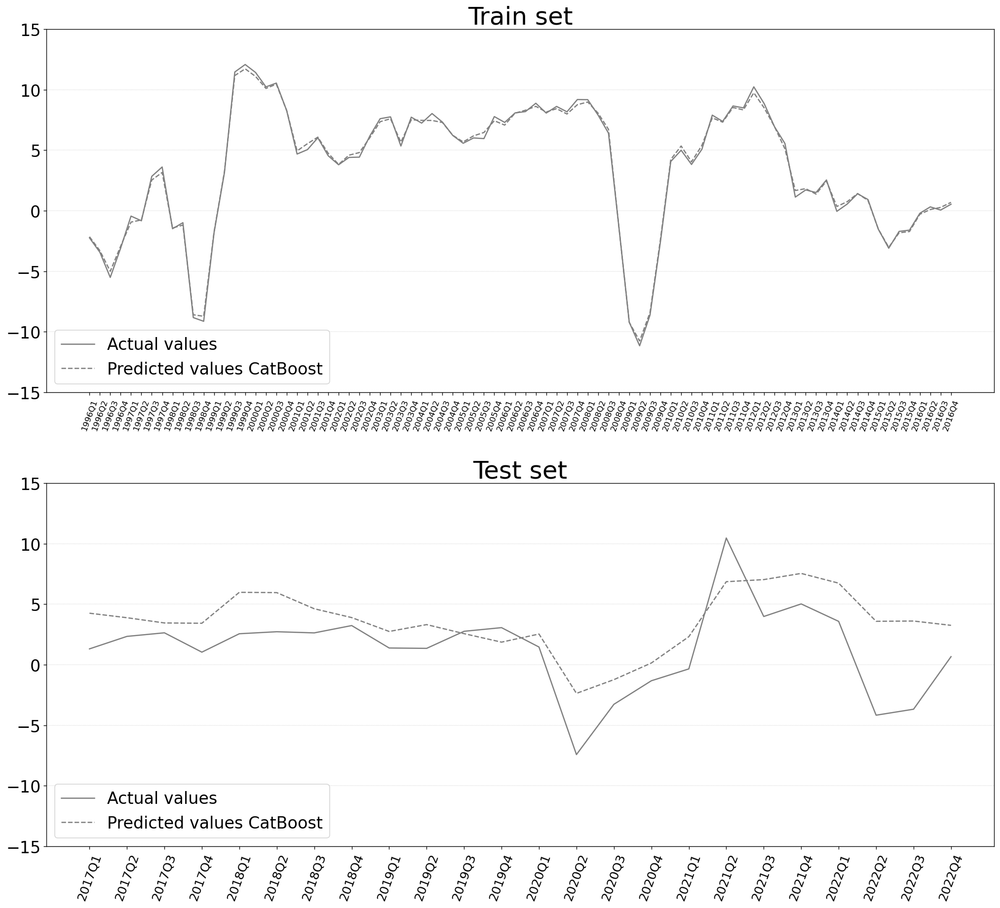

In [171]:
plt.figure(figsize=(8,15))

plt.subplot(211)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_train_actual[~np.isnan(GDP_train_actual)], c='gray', linestyle='-', label='Actual values', linewidth=1.5)
plt.plot(cat_train_preds, c='gray', linestyle='--', label='Predicted values CatBoost',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_train)), labels=dates_train, rotation=70, size=10)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Train set', size=30)

plt.subplot(212)
plt.ylim([-15, 15])
plt.grid(True, axis='y', linestyle='dashed', linewidth=0.25)
plt.plot(GDP_test_actual[~np.isnan(GDP_test_actual)], c='gray', linestyle='-', label='Actual values',  linewidth=1.5)
plt.plot(cat_test_preds, c='gray', linestyle='--', label='Predicted values CatBoost',  linewidth=1.5)
plt.xticks(ticks=range(0,len(dates_test)), labels=dates_test, rotation=70, size=15)
plt.yticks(size=20)
plt.legend(fontsize=20, loc='lower left')
plt.title('Test set', size=30)

plt.subplots_adjust(top=1, bottom=0.08, left=0, right=2, hspace=0.25, wspace=0.35)

plt.show()